In [253]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [254]:
train_df = pd.read_csv('dseats_2024_training_dataset.csv')

In [255]:
train_df

,PRODUCTION DATE,Field Name,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,FLOW_KIND,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
0,07/04/2014 00:00,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,0.000000,273.150000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000,0.0000
1,08/04/2014 00:00,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,0.000000,273.150000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000,0.0000
2,09/04/2014 00:00,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,0.000000,273.150000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000,0.0000
3,10/04/2014 00:00,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,0.000000,273.150000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000,0.0000
4,11/04/2014 00:00,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,4500.454030,370.025890,4020.534770,0.000000,479.919260,33.071950,0.0000,0.000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6920,26/06/2015 00:00,DSEAT,DSEAT-001-F-15 D,109,001-F-15 D,production,OP,2903.229117,379.373252,2460.629972,182.554483,442.599145,1.880480,747.8181,614123.984,64.2838
6921,27/06/2015 00:00,DSEAT,DSEAT-001-F-15 D,109,001-F-15 D,production,OP,2905.030564,379.379814,2456.159205,184.106427,448.871358,2.120109,749.2019,614168.462,64.4725
6922,28/06/2015 00:00,DSEAT,DSEAT-001-F-15 D,109,001-F-15 D,production,OP,2928.389988,379.313739,2484.425946,175.609150,443.964042,1.980460,789.9611,648175.070,65.9192
6923,29/06/2015 00:00,DSEAT,DSEAT-001-F-15 D,109,001-F-15 D,production,OP,2939.874982,379.288114,2496.000496,173.255362,443.874486,1.692930,789.7724,637067.219,63.3403


In [256]:
val_df = pd.read_csv('dseats_2024_validation_dataset.csv')

In [257]:
val_df

,PRODUCTION DATE,Field Name,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,FLOW_KIND,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
0,2015-07-01 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3061.253047,380.665745,2659.809580,0.0,401.443468,0.491632,NaN,NaN,NaN
1,2015-07-02 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3247.951135,376.759980,2547.453670,0.0,700.497465,21.775180,NaN,NaN,NaN
2,2015-07-03 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3333.012485,375.985300,2533.912265,0.0,799.100220,27.638780,NaN,NaN,NaN
3,2015-07-04 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3404.022465,375.419010,2481.804485,0.0,922.217980,36.178940,NaN,NaN,NaN
4,2015-07-05 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3465.473030,375.004710,2408.310945,0.0,1057.162085,45.424140,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9915,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9916,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9917,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9918,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Data Exploration

In [258]:
train_df.isnull().sum()

PRODUCTION DATE                  0
Field Name                       0
WELL_BORE_CODE                   0
N_WELL_BORE_CODE                 0
WellBore Name                    0
FLOW_KIND                        0
WELL_TYPE                        0
Downhole Pressure (PSI)          0
Downhole Temperature (Kelvin)    0
Average Tubing Pressure          0
Annulus Pressure (PSI)           0
AVG WHP (PSI)                    0
Choke Size                       6
Oil Production (stb/day)         0
Gas Volume (scf/day)             0
Water Production (stb/day)       0
dtype: int64

In [259]:
val_df.isnull().sum()

PRODUCTION DATE                  7845
Field Name                       7845
WELL_BORE_CODE                   7845
N_WELL_BORE_CODE                 7845
WellBore Name                    7845
FLOW_KIND                        7845
WELL_TYPE                        7845
Downhole Pressure (PSI)          7845
Downhole Temperature (Kelvin)    7845
Average Tubing Pressure          7845
Annulus Pressure (PSI)           7845
AVG WHP (PSI)                    7845
Choke Size                       7845
Oil Production (stb/day)         9920
Gas Volume (scf/day)             9920
Water Production (stb/day)       9920
dtype: int64

In [260]:
print(train_df.shape)
print(val_df.shape)

(6925, 16)
(9920, 16)


In [261]:
train_df.columns

Index(['PRODUCTION DATE', 'Field Name', 'WELL_BORE_CODE', 'N_WELL_BORE_CODE',
       'WellBore Name', 'FLOW_KIND', 'WELL_TYPE', 'Downhole Pressure (PSI)',
       'Downhole Temperature (Kelvin)', 'Average Tubing Pressure',
       'Annulus Pressure (PSI)', 'AVG WHP (PSI)', 'Choke Size',
       'Oil Production (stb/day)', 'Gas Volume (scf/day)',
       'Water Production (stb/day)'],
      dtype='object')

In [262]:
train_df.duplicated().sum()

0

In [263]:
train_df['PRODUCTION DATE'].unique()

array(['07/04/2014 00:00', '08/04/2014 00:00', '09/04/2014 00:00', ...,
       '05/07/2013 00:00', '06/07/2013 00:00', '07/07/2013 00:00'],
      dtype=object)

In [264]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6925 entries, 0 to 6924
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   PRODUCTION DATE                6925 non-null   object 
 1   Field Name                     6925 non-null   object 
 2   WELL_BORE_CODE                 6925 non-null   object 
 3   N_WELL_BORE_CODE               6925 non-null   int64  
 4   WellBore Name                  6925 non-null   object 
 5   FLOW_KIND                      6925 non-null   object 
 6   WELL_TYPE                      6925 non-null   object 
 7   Downhole Pressure (PSI)        6925 non-null   float64
 8   Downhole Temperature (Kelvin)  6925 non-null   float64
 9   Average Tubing Pressure        6925 non-null   float64
 10  Annulus Pressure (PSI)         6925 non-null   float64
 11  AVG WHP (PSI)                  6925 non-null   float64
 12  Choke Size                     6919 non-null   f

#### Extracting the Year and Data from Production Date in train data

In [265]:
train_df['PRODUCTION DATE'] = pd.to_datetime(train_df['PRODUCTION DATE'], format='%d/%m/%Y %H:%M')

train_df['Production Year'] = train_df['PRODUCTION DATE'].dt.year
train_df['Production Month'] = train_df['PRODUCTION DATE'].dt.month_name()

In [266]:
train_df.head()

,PRODUCTION DATE,Field Name,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,FLOW_KIND,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day),Production Year,Production Month
0,2014-04-07,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,0.0,0.0,2014,April
1,2014-04-08,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,0.0,0.0,2014,April
2,2014-04-09,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,0.0,0.0,2014,April
3,2014-04-10,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,0.0,0.0,2014,April
4,2014-04-11,DSEAT,DSEAT-001-F-1 C,105,001-F-1 C,production,OP,4500.45403,370.02589,4020.53477,0.0,479.91926,33.07195,0.0,0.0,0.0,2014,April


In [267]:
test_df = val_df.drop(['Oil Production (stb/day)','Gas Volume (scf/day)','Water Production (stb/day)'], axis=1)

In [268]:
test_df[~test_df.isnull().any(axis=1)]

,PRODUCTION DATE,Field Name,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,FLOW_KIND,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size
0,2015-07-01 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3061.253047,380.665745,2659.809580,0.0,401.443468,0.491632
1,2015-07-02 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3247.951135,376.759980,2547.453670,0.0,700.497465,21.775180
2,2015-07-03 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3333.012485,375.985300,2533.912265,0.0,799.100220,27.638780
3,2015-07-04 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3404.022465,375.419010,2481.804485,0.0,922.217980,36.178940
4,2015-07-05 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3465.473030,375.004710,2408.310945,0.0,1057.162085,45.424140
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2070,2016-09-12 00:00:00,DSEAT,DSEAT-001-F-15 D,109.0,001-F-15 D,production,OP,5015.648165,363.184330,5015.648165,0.0,0.000000,13.876190
2071,2016-09-13 00:00:00,DSEAT,DSEAT-001-F-15 D,109.0,001-F-15 D,production,OP,5015.648165,363.184330,5015.648165,0.0,0.000000,13.974080
2072,2016-09-14 00:00:00,DSEAT,DSEAT-001-F-15 D,109.0,001-F-15 D,production,OP,5015.648165,363.184330,5015.648165,0.0,0.000000,14.063160
2073,2016-09-15 00:00:00,DSEAT,DSEAT-001-F-15 D,109.0,001-F-15 D,production,OP,5015.648165,363.184330,5015.648165,0.0,0.000000,14.174450


In [269]:
test_df[test_df.isnull().any(axis=1)]

,PRODUCTION DATE,Field Name,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,FLOW_KIND,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size
2075,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2076,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2077,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2078,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2079,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9915,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9916,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9917,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9918,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [270]:
test_df = test_df[~test_df.isnull().any(axis=1)]

In [271]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2075 entries, 0 to 2074
Data columns (total 13 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   PRODUCTION DATE                2075 non-null   object 
 1   Field Name                     2075 non-null   object 
 2   WELL_BORE_CODE                 2075 non-null   object 
 3   N_WELL_BORE_CODE               2075 non-null   float64
 4   WellBore Name                  2075 non-null   object 
 5   FLOW_KIND                      2075 non-null   object 
 6   WELL_TYPE                      2075 non-null   object 
 7   Downhole Pressure (PSI)        2075 non-null   float64
 8   Downhole Temperature (Kelvin)  2075 non-null   float64
 9   Average Tubing Pressure        2075 non-null   float64
 10  Annulus Pressure (PSI)         2075 non-null   float64
 11  AVG WHP (PSI)                  2075 non-null   float64
 12  Choke Size                     2075 non-null   f

In [272]:
test_df.isnull().sum()

PRODUCTION DATE                  0
Field Name                       0
WELL_BORE_CODE                   0
N_WELL_BORE_CODE                 0
WellBore Name                    0
FLOW_KIND                        0
WELL_TYPE                        0
Downhole Pressure (PSI)          0
Downhole Temperature (Kelvin)    0
Average Tubing Pressure          0
Annulus Pressure (PSI)           0
AVG WHP (PSI)                    0
Choke Size                       0
dtype: int64

In [273]:
test_df.shape

(2075, 13)

#### Extracting the Year and Data from Production Date in test data

In [274]:
test_df['PRODUCTION DATE'] = pd.to_datetime(test_df['PRODUCTION DATE'])

test_df['Production Year'] = test_df['PRODUCTION DATE'].dt.year
test_df['Production Month'] = test_df['PRODUCTION DATE'].dt.month_name()

In [275]:
test_df.head()

,PRODUCTION DATE,Field Name,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,FLOW_KIND,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Production Year,Production Month
0,2015-07-01,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3061.253047,380.665745,2659.809580,0.0,401.443468,0.491632,2015,July
1,2015-07-02,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3247.951135,376.759980,2547.453670,0.0,700.497465,21.775180,2015,July
2,2015-07-03,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3333.012485,375.985300,2533.912265,0.0,799.100220,27.638780,2015,July
3,2015-07-04,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3404.022465,375.419010,2481.804485,0.0,922.217980,36.178940,2015,July
4,2015-07-05,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3465.473030,375.004710,2408.310945,0.0,1057.162085,45.424140,2015,July


##### Getting the unique values of each column in train data

In [276]:
unique_values = {}
for columns in train_df.columns:
    unique_values[columns] = train_df[columns].unique()

for columns, values in unique_values.items():
    print(f"Column: {columns}")
    print(f"Unique values: {values}")
    print(f"Number of unique values: {len(values)}")
    print()

Column: PRODUCTION DATE
Unique values: ['2014-04-07T00:00:00.000000000' '2014-04-08T00:00:00.000000000'
 '2014-04-09T00:00:00.000000000' ... '2013-07-05T00:00:00.000000000'
 '2013-07-06T00:00:00.000000000' '2013-07-07T00:00:00.000000000']
Number of unique values: 2611

Column: Field Name
Unique values: ['DSEAT']
Number of unique values: 1

Column: WELL_BORE_CODE
Unique values: ['DSEAT-001-F-1 C' 'DSEAT-001-F-11 H' 'DSEAT-001-F-12 H'
 'DSEAT-001-F-14 H' 'DSEAT-001-F-15 D']
Number of unique values: 5

Column: N_WELL_BORE_CODE
Unique values: [105 106 107 108 109]
Number of unique values: 5

Column: WellBore Name
Unique values: ['001-F-1 C' '001-F-11' '001-F-12' '001-F-14' '001-F-15 D']
Number of unique values: 5

Column: FLOW_KIND
Unique values: ['production']
Number of unique values: 1

Column: WELL_TYPE
Unique values: ['OP' 'WI']
Number of unique values: 2

Column: Downhole Pressure (PSI)
Unique values: [   0.       4500.45403  4400.76131  ... 2928.389988 2939.874982
 2915.46573 ]
Numbe

In [277]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6925 entries, 0 to 6924
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PRODUCTION DATE                6925 non-null   datetime64[ns]
 1   Field Name                     6925 non-null   object        
 2   WELL_BORE_CODE                 6925 non-null   object        
 3   N_WELL_BORE_CODE               6925 non-null   int64         
 4   WellBore Name                  6925 non-null   object        
 5   FLOW_KIND                      6925 non-null   object        
 6   WELL_TYPE                      6925 non-null   object        
 7   Downhole Pressure (PSI)        6925 non-null   float64       
 8   Downhole Temperature (Kelvin)  6925 non-null   float64       
 9   Average Tubing Pressure        6925 non-null   float64       
 10  Annulus Pressure (PSI)         6925 non-null   float64       
 11  AVG WHP (PSI)    

##### Getting the unique values of each column in test data

In [278]:
unique_values = {}
for columns in test_df.columns:
    unique_values[columns] = test_df[columns].unique()

for columns, values in unique_values.items():
    if columns == 'PRODUCTION DATE':
        print(f"Column: {columns}")
        print(f"Unique values: {values[0:10]}")
        print(f"Number of unique values: {len(values)}")
    else:
        print(f"Column: {columns}")
        print(f"Unique values: {values}")
        print(f"Number of unique values: {len(values)}")
        print()

Column: PRODUCTION DATE
Unique values: ['2015-07-01T00:00:00.000000000' '2015-07-02T00:00:00.000000000'
 '2015-07-03T00:00:00.000000000' '2015-07-04T00:00:00.000000000'
 '2015-07-05T00:00:00.000000000' '2015-07-06T00:00:00.000000000'
 '2015-07-07T00:00:00.000000000' '2015-07-08T00:00:00.000000000'
 '2015-07-09T00:00:00.000000000' '2015-07-10T00:00:00.000000000']
Number of unique values: 445
Column: Field Name
Unique values: ['DSEAT']
Number of unique values: 1

Column: WELL_BORE_CODE
Unique values: ['DSEAT-001-F-1 C' 'DSEAT-001-F-11 H' 'DSEAT-001-F-12 H'
 'DSEAT-001-F-14 H' 'DSEAT-001-F-15 D']
Number of unique values: 5

Column: N_WELL_BORE_CODE
Unique values: [105. 106. 107. 108. 109.]
Number of unique values: 5

Column: WellBore Name
Unique values: ['001-F-1 C' '001-F-11' '001-F-12' '001-F-14' '001-F-15 D']
Number of unique values: 5

Column: FLOW_KIND
Unique values: ['production']
Number of unique values: 1

Column: WELL_TYPE
Unique values: ['OP']
Number of unique values: 1

Column:

In [279]:
unique_values = {}
for columns in train_df.columns:
    unique_values[columns] = train_df[columns].unique()

for columns, values in unique_values.items():
    if len(values) == 1:
        print(f"Column: {columns}")
        print(f"Unique values: {values}")
        print(f"Number of unique values: {len(values)}")

Column: Field Name
Unique values: ['DSEAT']
Number of unique values: 1
Column: FLOW_KIND
Unique values: ['production']
Number of unique values: 1


In [280]:
unique_values = {}
for columns in test_df.columns:
    unique_values[columns] = test_df[columns].unique()

for columns, values in unique_values.items():
    if len(values) == 1:
        print(f"Column: {columns}")
        print(f"Unique values: {values}")
        print(f"Number of unique values: {len(values)}")

Column: Field Name
Unique values: ['DSEAT']
Number of unique values: 1
Column: FLOW_KIND
Unique values: ['production']
Number of unique values: 1
Column: WELL_TYPE
Unique values: ['OP']
Number of unique values: 1


In [281]:
train_df = train_df.drop(['PRODUCTION DATE','Field Name','FLOW_KIND'],axis=1)

In [282]:
test_df = test_df.drop(['PRODUCTION DATE','Field Name','FLOW_KIND'],axis=1)

###### Encoding 'WELL_BORE_CODE' ,N_WELL_BORE_CODE, WellBore Name,Production Month in train data

In [283]:
from sklearn.preprocessing import LabelEncoder

l_encoder_b = LabelEncoder()
l_encoder_b.fit(train_df['WELL_BORE_CODE'])
encoded_well_b = l_encoder_b.transform(train_df['WELL_BORE_CODE'])
train_df['WELL_BORE_CODE_encoded'] = encoded_well_b

l_encoder_n = LabelEncoder()
l_encoder_n.fit(train_df['N_WELL_BORE_CODE'])
encoded_well_n = l_encoder_n.transform(train_df['N_WELL_BORE_CODE'])
train_df['N_WELL_BORE_CODE_encoded'] = encoded_well_n

l_encoder_m = LabelEncoder()
l_encoder_m.fit(train_df['WellBore Name'])
encoded_well_m = l_encoder_m.transform(train_df['WellBore Name'])
train_df['WellBore Name_encoded'] = encoded_well_m

l_encoder_month = LabelEncoder()
l_encoder_month.fit(train_df['Production Month'])
encoded_month = l_encoder_month.transform(train_df['Production Month'])
train_df['Production Month_encoded'] = encoded_month

In [284]:
encoded_values_b = train_df['WELL_BORE_CODE_encoded'].unique()
original_labels_b = l_encoder_b.inverse_transform(encoded_values_b)
print(f"Encoded values: {encoded_values_b}")
print(f"Original labels: {original_labels_b}")
print()

encoded_values_n = train_df['N_WELL_BORE_CODE_encoded'].unique()
original_labels_n = l_encoder_n.inverse_transform(encoded_values_n)
print(f"Encoded values: {encoded_values_n}")
print(f"Original labels: {original_labels_n}")
print()

encoded_values_m = train_df['WellBore Name_encoded'].unique()
original_labels_m = l_encoder_m.inverse_transform(encoded_values_m)
print(f"Encoded values: {encoded_values_m}")
print(f"Original labels: {original_labels_m}")
print()

encoded_values_month = train_df['Production Month_encoded'].unique()
original_labels_month = l_encoder_month.inverse_transform(encoded_values_month)
print(f"Encoded values: {encoded_values_month}")
print(f"Original labels: {original_labels_month}")
print()

Encoded values: [0 1 2 3 4]
Original labels: ['DSEAT-001-F-1 C' 'DSEAT-001-F-11 H' 'DSEAT-001-F-12 H'
 'DSEAT-001-F-14 H' 'DSEAT-001-F-15 D']

Encoded values: [0 1 2 3 4]
Original labels: [105 106 107 108 109]

Encoded values: [0 1 2 3 4]
Original labels: ['001-F-1 C' '001-F-11' '001-F-12' '001-F-14' '001-F-15 D']

Encoded values: [ 0  8  6  5  1 11 10  9  2  4  3  7]
Original labels: ['April' 'May' 'June' 'July' 'August' 'September' 'October' 'November'
 'December' 'January' 'February' 'March']



###### Encoding 'WELL_BORE_CODE' ,N_WELL_BORE_CODE, WellBore Name,Production Month in test data

In [285]:
l_encoder_bt = LabelEncoder()
l_encoder_bt.fit(test_df['WELL_BORE_CODE'])
encoded_well_bt = l_encoder_bt.transform(test_df['WELL_BORE_CODE'])
test_df['WELL_BORE_CODE_encoded'] = encoded_well_bt

l_encoder_nt = LabelEncoder()
l_encoder_nt.fit(test_df['N_WELL_BORE_CODE'])
encoded_well_nt = l_encoder_nt.transform(test_df['N_WELL_BORE_CODE'])
test_df['N_WELL_BORE_CODE_encoded'] = encoded_well_nt

l_encoder_mt = LabelEncoder()
l_encoder_mt.fit(test_df['WellBore Name'])
encoded_well_mt = l_encoder_mt.transform(test_df['WellBore Name'])
test_df['WellBore Name_encoded'] = encoded_well_mt

l_encoder_montht = LabelEncoder()
l_encoder_montht.fit(test_df['Production Month'])
encoded_montht = l_encoder_montht.transform(test_df['Production Month'])
test_df['Production Month_encoded'] = encoded_montht

In [286]:
encoded_values_bt = test_df['WELL_BORE_CODE_encoded'].unique()
original_labels_bt = l_encoder_bt.inverse_transform(encoded_values_bt)
print(f"Encoded values: {encoded_values_bt}")
print(f"Original labels: {original_labels_bt}")
print()

encoded_values_nt = test_df['N_WELL_BORE_CODE_encoded'].unique()
original_labels_nt = l_encoder_nt.inverse_transform(encoded_values_nt)
print(f"Encoded values: {encoded_values_nt}")
print(f"Original labels: {original_labels_nt}")
print()

encoded_values_mt = test_df['WellBore Name_encoded'].unique()
original_labels_mt = l_encoder_mt.inverse_transform(encoded_values_mt)
print(f"Encoded values: {encoded_values_mt}")
print(f"Original labels: {original_labels_mt}")
print()

encoded_values_montht = test_df['Production Month_encoded'].unique()
original_labels_montht = l_encoder_montht.inverse_transform(encoded_values_montht)
print(f"Encoded values: {encoded_values_montht}")
print(f"Original labels: {original_labels_montht}")
print()

Encoded values: [0 1 2 3 4]
Original labels: ['DSEAT-001-F-1 C' 'DSEAT-001-F-11 H' 'DSEAT-001-F-12 H'
 'DSEAT-001-F-14 H' 'DSEAT-001-F-15 D']

Encoded values: [0 1 2 3 4]
Original labels: [105. 106. 107. 108. 109.]

Encoded values: [0 1 2 3 4]
Original labels: ['001-F-1 C' '001-F-11' '001-F-12' '001-F-14' '001-F-15 D']

Encoded values: [ 5  1 11 10  9  2  4  3  7  0  8  6]
Original labels: ['July' 'August' 'September' 'October' 'November' 'December' 'January'
 'February' 'March' 'April' 'May' 'June']



In [287]:
len(test_df.columns)

16

In [288]:
train_df.columns

Index(['WELL_BORE_CODE', 'N_WELL_BORE_CODE', 'WellBore Name', 'WELL_TYPE',
       'Downhole Pressure (PSI)', 'Downhole Temperature (Kelvin)',
       'Average Tubing Pressure', 'Annulus Pressure (PSI)', 'AVG WHP (PSI)',
       'Choke Size', 'Oil Production (stb/day)', 'Gas Volume (scf/day)',
       'Water Production (stb/day)', 'Production Year', 'Production Month',
       'WELL_BORE_CODE_encoded', 'N_WELL_BORE_CODE_encoded',
       'WellBore Name_encoded', 'Production Month_encoded'],
      dtype='object')

In [289]:
train_df.corr()

,N_WELL_BORE_CODE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day),Production Year,WELL_BORE_CODE_encoded,N_WELL_BORE_CODE_encoded,WellBore Name_encoded,Production Month_encoded
N_WELL_BORE_CODE,1.000000,0.107050,0.121245,0.144271,-0.046946,-0.186169,-0.222072,0.024403,0.023477,0.147892,-0.191023,1.000000,1.000000,1.000000,-0.007180
Downhole Pressure (PSI),0.107050,1.000000,0.976292,0.950710,-0.185430,0.322986,0.270540,0.318232,0.316191,-0.378980,-0.106441,0.107050,0.107050,0.107050,0.003613
Downhole Temperature (Kelvin),0.121245,0.976292,1.000000,0.914867,-0.186245,0.301547,0.224738,0.339666,0.336812,-0.429728,-0.078899,0.121245,0.121245,0.121245,0.021282
Average Tubing Pressure,0.144271,0.950710,0.914867,1.000000,-0.137008,0.181183,0.123248,0.203944,0.202959,-0.250208,0.005406,0.144271,0.144271,0.144271,-0.011530
Annulus Pressure (PSI),-0.046946,-0.185430,-0.186245,-0.137008,1.000000,-0.086250,-0.221631,-0.092136,-0.089360,0.222422,0.329325,-0.046946,-0.046946,-0.046946,0.020458
AVG WHP (PSI),-0.186169,0.322986,0.301547,0.181183,-0.086250,1.000000,0.905820,0.427988,0.426122,-0.447215,-0.290840,-0.186169,-0.186169,-0.186169,0.019716
Choke Size,-0.222072,0.270540,0.224738,0.123248,-0.221631,0.905820,1.000000,0.288396,0.283179,-0.589275,-0.326022,-0.222072,-0.222072,-0.222072,-0.001030
Oil Production (stb/day),0.024403,0.318232,0.339666,0.203944,-0.092136,0.427988,0.288396,1.000000,0.998425,-0.206238,-0.714094,0.024403,0.024403,0.024403,0.016772
Gas Volume (scf/day),0.023477,0.316191,0.336812,0.202959,-0.089360,0.426122,0.283179,0.998425,1.000000,-0.189390,-0.715708,0.023477,0.023477,0.023477,0.017392
Water Production (stb/day),0.147892,-0.378980,-0.429728,-0.250208,0.222422,-0.447215,-0.589275,-0.206238,-0.189390,1.000000,0.126400,0.147892,0.147892,0.147892,0.017954


### Heatmap Correlation of Features

<AxesSubplot:>

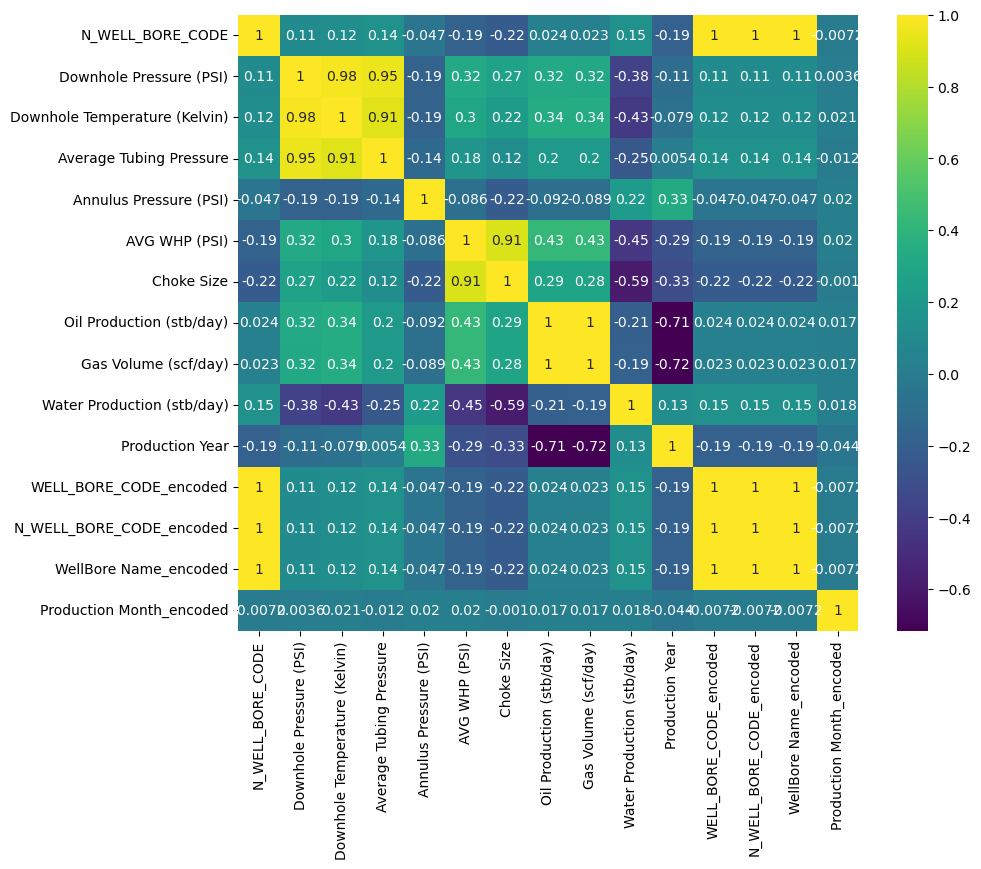

In [290]:
plt.figure(figsize=(10,8))
sns.heatmap(data=train_df.corr(), cmap='viridis',annot=True)

### Creaing a new feature called avg_annulus_pressure_per_year 
### By calculating the Annulus pressure (PSI) for each production year

In [291]:
avg_annulus_pressure_per_year = train_df.groupby('Production Year')['Annulus Pressure (PSI)'].mean()

In [292]:
avg_annulus_pressure_per_year.head()

Production Year
2008     90.627598
2009    112.576827
2010    169.065683
2011    135.844100
2012    141.665202
Name: Annulus Pressure (PSI), dtype: float64

In [293]:
avg_annulus_pressure_per_year = avg_annulus_pressure_per_year.reset_index()
avg_annulus_pressure_per_year.columns = ['Production Year', 'Average Annulus Pressure (PSI)']

In [294]:
avg_annulus_pressure_per_year

,Production Year,Average Annulus Pressure (PSI)
0,2008,90.627598
1,2009,112.576827
2,2010,169.065683
3,2011,135.844100
4,2012,141.665202
5,2013,247.622033
6,2014,232.189879
7,2015,205.281486


In [295]:
train_df = pd.merge(train_df, avg_annulus_pressure_per_year, on='Production Year', how='left')

In [296]:
train_df.head()

,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day),Production Year,Production Month,WELL_BORE_CODE_encoded,N_WELL_BORE_CODE_encoded,WellBore Name_encoded,Production Month_encoded,Average Annulus Pressure (PSI)
0,DSEAT-001-F-1 C,105,001-F-1 C,OP,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,0.0,0.0,2014,April,0,0,0,0,232.189879
1,DSEAT-001-F-1 C,105,001-F-1 C,OP,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,0.0,0.0,2014,April,0,0,0,0,232.189879
2,DSEAT-001-F-1 C,105,001-F-1 C,OP,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,0.0,0.0,2014,April,0,0,0,0,232.189879
3,DSEAT-001-F-1 C,105,001-F-1 C,OP,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,0.0,0.0,2014,April,0,0,0,0,232.189879
4,DSEAT-001-F-1 C,105,001-F-1 C,OP,4500.45403,370.02589,4020.53477,0.0,479.91926,33.07195,0.0,0.0,0.0,2014,April,0,0,0,0,232.189879


In [297]:
avg_annulus_pressure_per_year = test_df.groupby('Production Year')['Annulus Pressure (PSI)'].mean()
avg_annulus_pressure_per_year = avg_annulus_pressure_per_year.reset_index()
avg_annulus_pressure_per_year.columns = ['Production Year', 'Average Annulus Pressure (PSI)']
test_df = pd.merge(test_df, avg_annulus_pressure_per_year, on='Production Year', how='left')

In [298]:
test_df.head()

,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Production Year,Production Month,WELL_BORE_CODE_encoded,N_WELL_BORE_CODE_encoded,WellBore Name_encoded,Production Month_encoded,Average Annulus Pressure (PSI)
0,DSEAT-001-F-1 C,105.0,001-F-1 C,OP,3061.253047,380.665745,2659.809580,0.0,401.443468,0.491632,2015,July,0,0,0,5,159.324437
1,DSEAT-001-F-1 C,105.0,001-F-1 C,OP,3247.951135,376.759980,2547.453670,0.0,700.497465,21.775180,2015,July,0,0,0,5,159.324437
2,DSEAT-001-F-1 C,105.0,001-F-1 C,OP,3333.012485,375.985300,2533.912265,0.0,799.100220,27.638780,2015,July,0,0,0,5,159.324437
3,DSEAT-001-F-1 C,105.0,001-F-1 C,OP,3404.022465,375.419010,2481.804485,0.0,922.217980,36.178940,2015,July,0,0,0,5,159.324437
4,DSEAT-001-F-1 C,105.0,001-F-1 C,OP,3465.473030,375.004710,2408.310945,0.0,1057.162085,45.424140,2015,July,0,0,0,5,159.324437


### Creaing a new feature called downhole_p_t_K
### By calculating the ratio of Downhole Pressure (PSI) to Downhole Temperature (Kelvin)

In [299]:
train_df['downhole_p_t_K'] = train_df['Downhole Pressure (PSI)'] / train_df['Downhole Temperature (Kelvin)']
test_df['downhole_p_t_K'] = test_df['Downhole Pressure (PSI)'] / test_df['Downhole Temperature (Kelvin)']

In [300]:
train_df.head(2)

,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,...,Gas Volume (scf/day),Water Production (stb/day),Production Year,Production Month,WELL_BORE_CODE_encoded,N_WELL_BORE_CODE_encoded,WellBore Name_encoded,Production Month_encoded,Average Annulus Pressure (PSI),downhole_p_t_K
0,DSEAT-001-F-1 C,105,001-F-1 C,OP,0.0,273.15,0.0,0.0,0.0,0.0,...,0.0,0.0,2014,April,0,0,0,0,232.189879,0.0
1,DSEAT-001-F-1 C,105,001-F-1 C,OP,0.0,273.15,0.0,0.0,0.0,0.0,...,0.0,0.0,2014,April,0,0,0,0,232.189879,0.0


### Creaing a two new features called tubing_downhole_p_rshp and WHP_to_downhole_p_rshp (rshp means relationship)
### tubing_downhole_p_rshp is the product of Average Tubing Pressure and Downhole Pressure (PSI)
### WHP_to_downhole_p_rshp is the product of AVG WHP (PSI) and Downhole Pressure (PSI)

In [301]:
train_df['tubing_downhole_p_rshp'] = train_df['Average Tubing Pressure'] * train_df['Downhole Pressure (PSI)']
test_df['tubing_downhole_p_rshp'] = test_df['Average Tubing Pressure'] * test_df['Downhole Pressure (PSI)']
train_df['WHP_to_downhole_p_rshp'] = train_df['AVG WHP (PSI)'] * train_df['Downhole Pressure (PSI)']
test_df['WHP_to_downhole_p_rshp'] = test_df['AVG WHP (PSI)'] * test_df['Downhole Pressure (PSI)']

### Creaing a new feature called tubing_downhole_temp_ratio by calculating the ratio of Average Tubing Pressure to Downhole Temperature (Kelvin)

In [302]:
train_df['tubing_downhole_temp_ratio'] = train_df['Average Tubing Pressure'] / train_df['Downhole Temperature (Kelvin)']
test_df['tubing_downhole_temp_ratio'] = test_df['Average Tubing Pressure'] / test_df['Downhole Temperature (Kelvin)']

### Creaing a new feature called WHP_to_downhole_temp_ratio by calculating the ratio of AVG WHP (PSI) to Downhole Temperature (Kelvin)

In [303]:
train_df['WHP_to_downhole_temp_ratio'] = train_df['AVG WHP (PSI)'] / train_df['Downhole Temperature (Kelvin)']
test_df['WHP_to_downhole_temp_ratio'] = test_df['AVG WHP (PSI)'] / test_df['Downhole Temperature (Kelvin)']

In [304]:
test_df.isnull().sum()

WELL_BORE_CODE                    0
N_WELL_BORE_CODE                  0
WellBore Name                     0
WELL_TYPE                         0
Downhole Pressure (PSI)           0
Downhole Temperature (Kelvin)     0
Average Tubing Pressure           0
Annulus Pressure (PSI)            0
AVG WHP (PSI)                     0
Choke Size                        0
Production Year                   0
Production Month                  0
WELL_BORE_CODE_encoded            0
N_WELL_BORE_CODE_encoded          0
WellBore Name_encoded             0
Production Month_encoded          0
Average Annulus Pressure (PSI)    0
downhole_p_t_K                    0
tubing_downhole_p_rshp            0
WHP_to_downhole_p_rshp            0
tubing_downhole_temp_ratio        0
WHP_to_downhole_temp_ratio        0
dtype: int64

In [305]:
train_df[train_df['Choke Size'].isnull()]

,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,...,WELL_BORE_CODE_encoded,N_WELL_BORE_CODE_encoded,WellBore Name_encoded,Production Month_encoded,Average Annulus Pressure (PSI),downhole_p_t_K,tubing_downhole_p_rshp,WHP_to_downhole_p_rshp,tubing_downhole_temp_ratio,WHP_to_downhole_temp_ratio
452,DSEAT-001-F-11 H,106,001-F-11,OP,0.0,273.15,0.0,0.0,0.0,NaN,...,1,1,1,5,247.622033,0.0,0.0,0.0,0.0,0.0
454,DSEAT-001-F-11 H,106,001-F-11,OP,0.0,273.15,0.0,0.0,0.0,NaN,...,1,1,1,5,247.622033,0.0,0.0,0.0,0.0,0.0
465,DSEAT-001-F-11 H,106,001-F-11,OP,0.0,273.15,0.0,0.0,0.0,NaN,...,1,1,1,5,247.622033,0.0,0.0,0.0,0.0,0.0
468,DSEAT-001-F-11 H,106,001-F-11,OP,0.0,273.15,0.0,0.0,0.0,NaN,...,1,1,1,5,247.622033,0.0,0.0,0.0,0.0,0.0
469,DSEAT-001-F-11 H,106,001-F-11,OP,0.0,273.15,0.0,0.0,0.0,NaN,...,1,1,1,5,247.622033,0.0,0.0,0.0,0.0,0.0
472,DSEAT-001-F-11 H,106,001-F-11,OP,0.0,273.15,0.0,0.0,0.0,NaN,...,1,1,1,5,247.622033,0.0,0.0,0.0,0.0,0.0


In [306]:
train_df['Choke Size'] =train_df['Choke Size'].fillna(0)

In [307]:
train_df[train_df['Choke Size'].isnull()]

,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,...,WELL_BORE_CODE_encoded,N_WELL_BORE_CODE_encoded,WellBore Name_encoded,Production Month_encoded,Average Annulus Pressure (PSI),downhole_p_t_K,tubing_downhole_p_rshp,WHP_to_downhole_p_rshp,tubing_downhole_temp_ratio,WHP_to_downhole_temp_ratio


In [308]:
len(train_df['Choke Size'].unique())

6856

### Creaing a new feature called pressure_diff by calculating the difference between AVG WHP (PSI) and Downhole Pressure (PSI)

In [309]:
train_df['pressure_diff'] = train_df['AVG WHP (PSI)'] - train_df['Downhole Pressure (PSI)']
test_df['pressure_diff'] = test_df['AVG WHP (PSI)'] - test_df['Downhole Pressure (PSI)']

### Creaing a new feature called choke_whp_rshp (rshp means relationship) by calculating the product of AVG WHP (PSI) and Choke Size

In [310]:
train_df['choke_whp_rshp'] = train_df['AVG WHP (PSI)'] * train_df['Choke Size']
test_df['choke_whp_rshp'] = test_df['AVG WHP (PSI)'] * test_df['Choke Size']

In [311]:
train_df.isnull().sum()

WELL_BORE_CODE                    0
N_WELL_BORE_CODE                  0
WellBore Name                     0
WELL_TYPE                         0
Downhole Pressure (PSI)           0
Downhole Temperature (Kelvin)     0
Average Tubing Pressure           0
Annulus Pressure (PSI)            0
AVG WHP (PSI)                     0
Choke Size                        0
Oil Production (stb/day)          0
Gas Volume (scf/day)              0
Water Production (stb/day)        0
Production Year                   0
Production Month                  0
WELL_BORE_CODE_encoded            0
N_WELL_BORE_CODE_encoded          0
WellBore Name_encoded             0
Production Month_encoded          0
Average Annulus Pressure (PSI)    0
downhole_p_t_K                    0
tubing_downhole_p_rshp            0
WHP_to_downhole_p_rshp            0
tubing_downhole_temp_ratio        0
WHP_to_downhole_temp_ratio        0
pressure_diff                     0
choke_whp_rshp                    0
dtype: int64

In [312]:
test_df.isnull().sum()

WELL_BORE_CODE                    0
N_WELL_BORE_CODE                  0
WellBore Name                     0
WELL_TYPE                         0
Downhole Pressure (PSI)           0
Downhole Temperature (Kelvin)     0
Average Tubing Pressure           0
Annulus Pressure (PSI)            0
AVG WHP (PSI)                     0
Choke Size                        0
Production Year                   0
Production Month                  0
WELL_BORE_CODE_encoded            0
N_WELL_BORE_CODE_encoded          0
WellBore Name_encoded             0
Production Month_encoded          0
Average Annulus Pressure (PSI)    0
downhole_p_t_K                    0
tubing_downhole_p_rshp            0
WHP_to_downhole_p_rshp            0
tubing_downhole_temp_ratio        0
WHP_to_downhole_temp_ratio        0
pressure_diff                     0
choke_whp_rshp                    0
dtype: int64

In [313]:
train_df.shape

(6925, 27)

In [314]:
test_df.shape

(2075, 24)

In [315]:
train_df.columns

Index(['WELL_BORE_CODE', 'N_WELL_BORE_CODE', 'WellBore Name', 'WELL_TYPE',
       'Downhole Pressure (PSI)', 'Downhole Temperature (Kelvin)',
       'Average Tubing Pressure', 'Annulus Pressure (PSI)', 'AVG WHP (PSI)',
       'Choke Size', 'Oil Production (stb/day)', 'Gas Volume (scf/day)',
       'Water Production (stb/day)', 'Production Year', 'Production Month',
       'WELL_BORE_CODE_encoded', 'N_WELL_BORE_CODE_encoded',
       'WellBore Name_encoded', 'Production Month_encoded',
       'Average Annulus Pressure (PSI)', 'downhole_p_t_K',
       'tubing_downhole_p_rshp', 'WHP_to_downhole_p_rshp',
       'tubing_downhole_temp_ratio', 'WHP_to_downhole_temp_ratio',
       'pressure_diff', 'choke_whp_rshp'],
      dtype='object')

In [316]:
test_df.columns

Index(['WELL_BORE_CODE', 'N_WELL_BORE_CODE', 'WellBore Name', 'WELL_TYPE',
       'Downhole Pressure (PSI)', 'Downhole Temperature (Kelvin)',
       'Average Tubing Pressure', 'Annulus Pressure (PSI)', 'AVG WHP (PSI)',
       'Choke Size', 'Production Year', 'Production Month',
       'WELL_BORE_CODE_encoded', 'N_WELL_BORE_CODE_encoded',
       'WellBore Name_encoded', 'Production Month_encoded',
       'Average Annulus Pressure (PSI)', 'downhole_p_t_K',
       'tubing_downhole_p_rshp', 'WHP_to_downhole_p_rshp',
       'tubing_downhole_temp_ratio', 'WHP_to_downhole_temp_ratio',
       'pressure_diff', 'choke_whp_rshp'],
      dtype='object')

### Correlation of features with respect to the Productions, sorted by the Oil Production feature

In [317]:
train_df.corr()[['Oil Production (stb/day)', 'Gas Volume (scf/day)','Water Production (stb/day)']].sort_values(by='Oil Production (stb/day)')

,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
Production Year,-0.714094,-0.715708,0.126400
Average Annulus Pressure (PSI),-0.625420,-0.627991,0.173473
pressure_diff,-0.235802,-0.234087,0.295184
Water Production (stb/day),-0.206238,-0.189390,1.000000
Annulus Pressure (PSI),-0.092136,-0.089360,0.222422
Production Month_encoded,0.016772,0.017392,0.017954
WELL_BORE_CODE_encoded,0.024403,0.023477,0.147892
WellBore Name_encoded,0.024403,0.023477,0.147892
N_WELL_BORE_CODE_encoded,0.024403,0.023477,0.147892
N_WELL_BORE_CODE,0.024403,0.023477,0.147892


## Data Visualization

### Heatmap of correlation features

<AxesSubplot:>

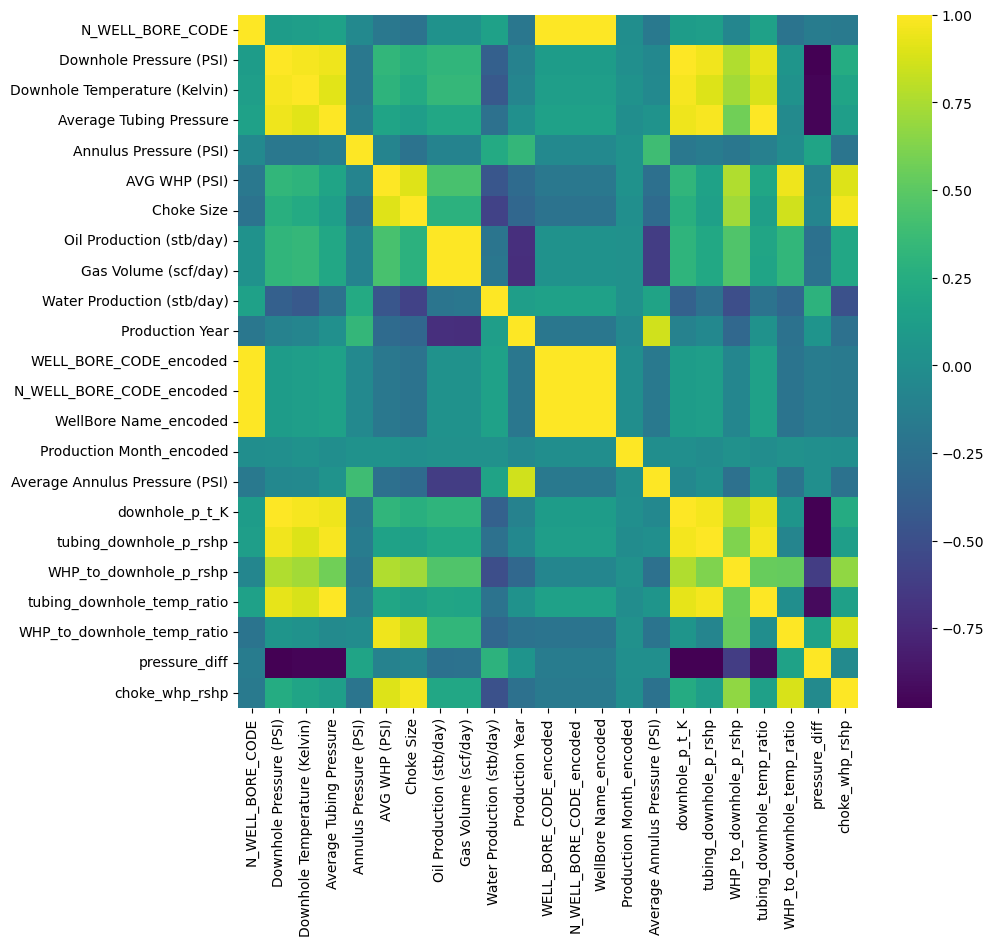

In [318]:
plt.figure(figsize=(10,9))
sns.heatmap(train_df.corr(),cmap='viridis')

### A Pairplot showing all the numeric features plotted against each other

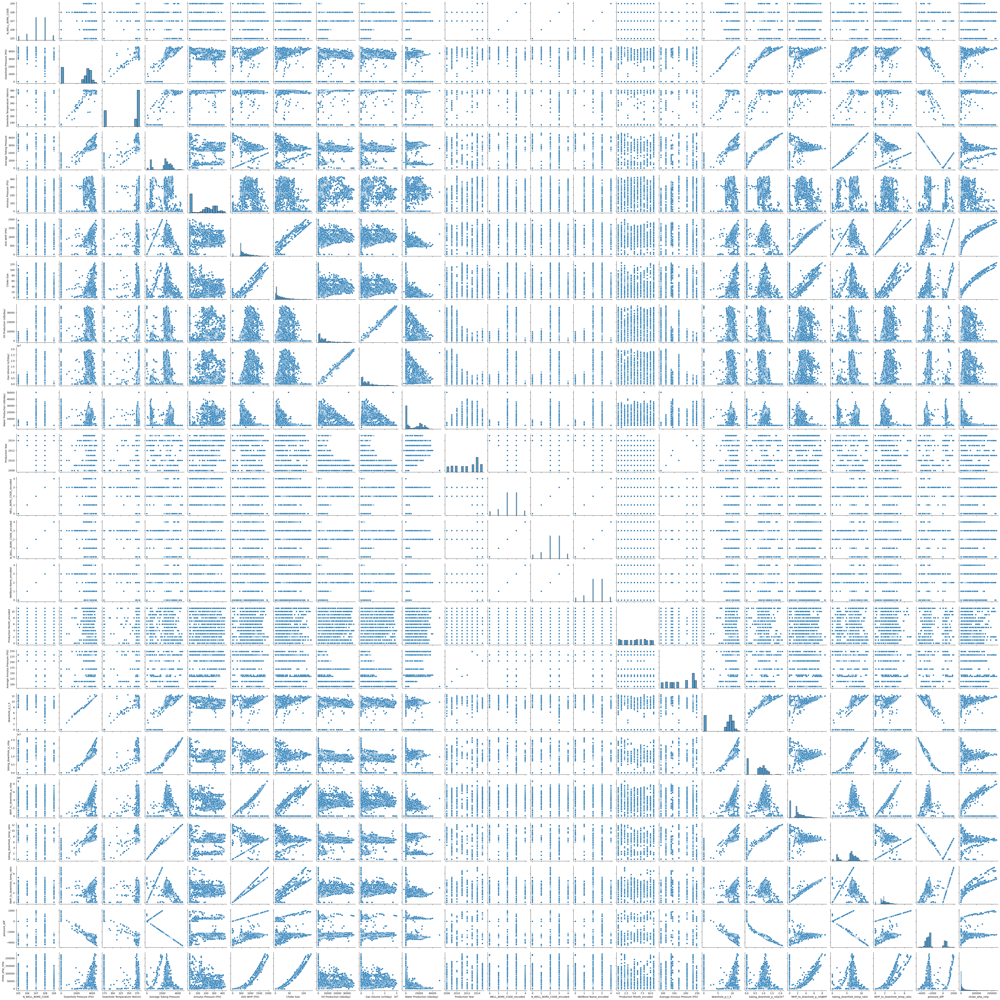

In [319]:
sns.pairplot(train_df)

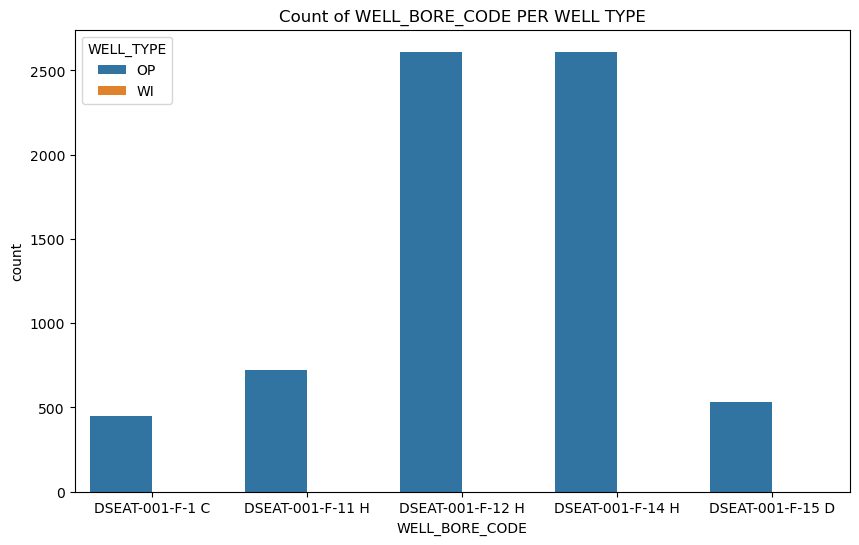

In [320]:
plt.figure(figsize=(10,6))
sns.countplot(data=train_df,x='WELL_BORE_CODE',hue='WELL_TYPE')
plt.title('Count of WELL_BORE_CODE PER WELL TYPE');

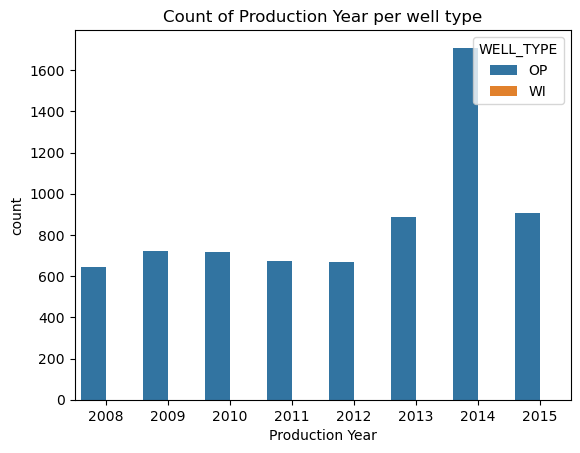

In [321]:
sns.countplot(x='Production Year', data=train_df, hue='WELL_TYPE')
plt.title('Count of Production Year per well type');

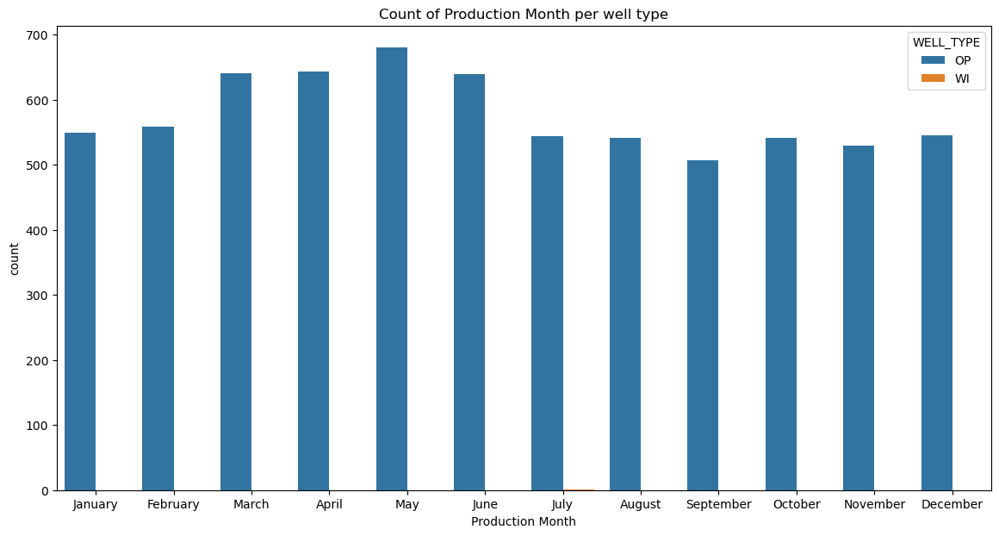

In [322]:
plt.figure(figsize=(14,7))
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July','August', 'September', 'October', 'November', 'December']

sns.countplot(x='Production Month', data=train_df, hue='WELL_TYPE',order=month_order)
plt.title('Count of Production Month per well type');

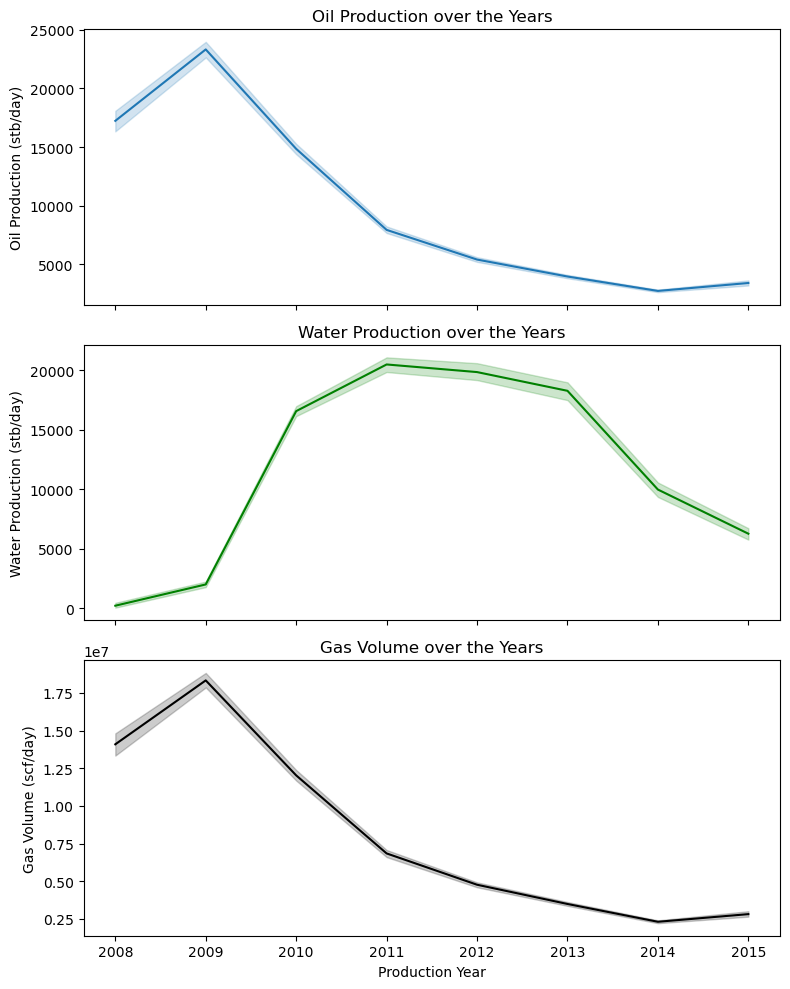

In [323]:
fig, axes = plt.subplots(3, 1, figsize=(8, 10), sharex=True)

sns.lineplot(ax=axes[0], x='Production Year', y='Oil Production (stb/day)', data=train_df)
axes[0].set_title('Oil Production over the Years')
axes[0].set_ylabel('Oil Production (stb/day)')

sns.lineplot(ax=axes[1], x='Production Year', y='Water Production (stb/day)', data=train_df,color='green')
axes[1].set_title('Water Production over the Years')
axes[1].set_ylabel('Water Production (stb/day)')

sns.lineplot(ax=axes[2], x='Production Year', y='Gas Volume (scf/day)', data=train_df,color='black')
axes[2].set_title('Gas Volume over the Years')
axes[2].set_ylabel('Gas Volume (scf/day)')
axes[2].set_xlabel('Production Year')

plt.tight_layout();

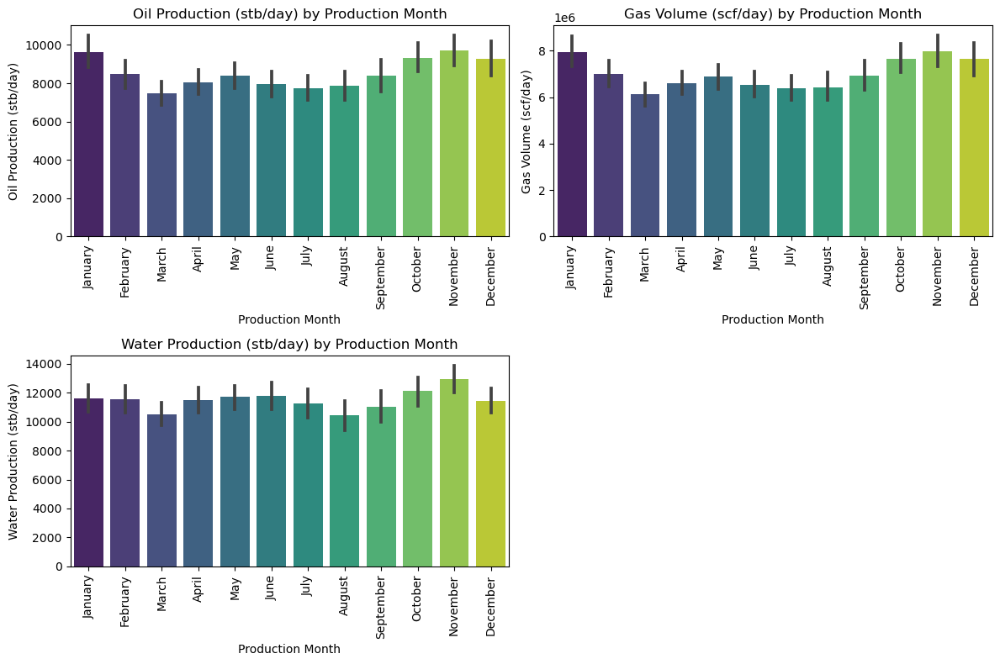

In [324]:
targets = ['Oil Production (stb/day)', 'Gas Volume (scf/day)', 'Water Production (stb/day)']
plt.figure(figsize=(12, 8))

for i, target in enumerate(targets, 1):
    plt.subplot(2, 2, i)
    sns.barplot(x='Production Month', y=target, data=train_df, palette='viridis',order=month_order)
    plt.title(f'{target} by Production Month')
    plt.xticks(rotation=90)

plt.tight_layout();

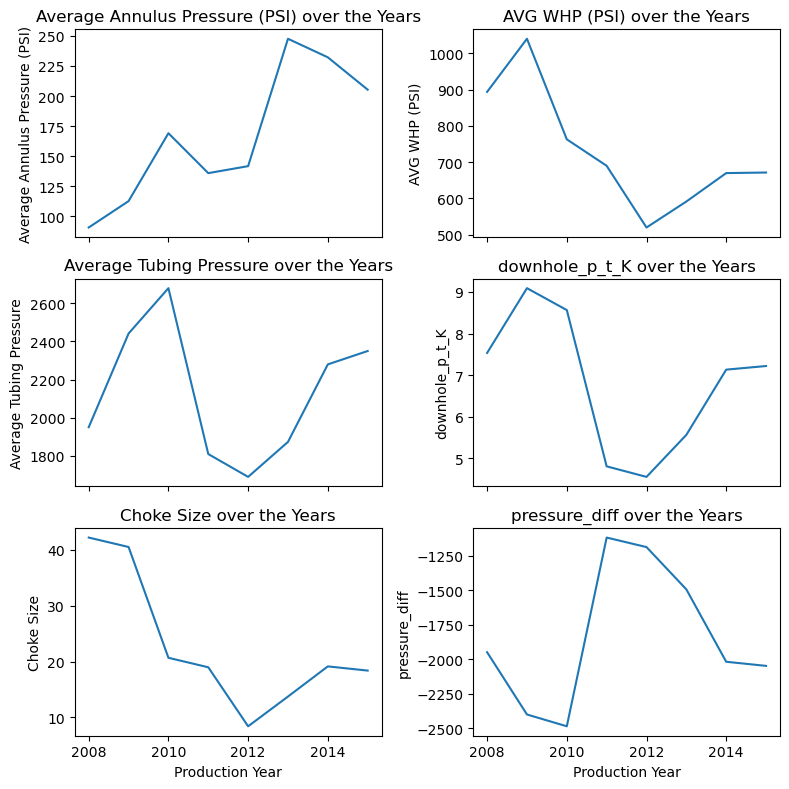

In [325]:
features = ['Average Annulus Pressure (PSI)','AVG WHP (PSI)', 'Average Tubing Pressure', 'downhole_p_t_K', 'Choke Size', 'pressure_diff']
fig, axes = plt.subplots(3, 2, figsize=(8, 8), sharex=True)
axes = axes.flatten()

for i, feature in enumerate(features):
    sns.lineplot(ax=axes[i], x='Production Year', y=feature, data=train_df, ci=None)
    axes[i].set_title(f'{feature} over the Years')
    axes[i].set_ylabel(feature)

plt.tight_layout();

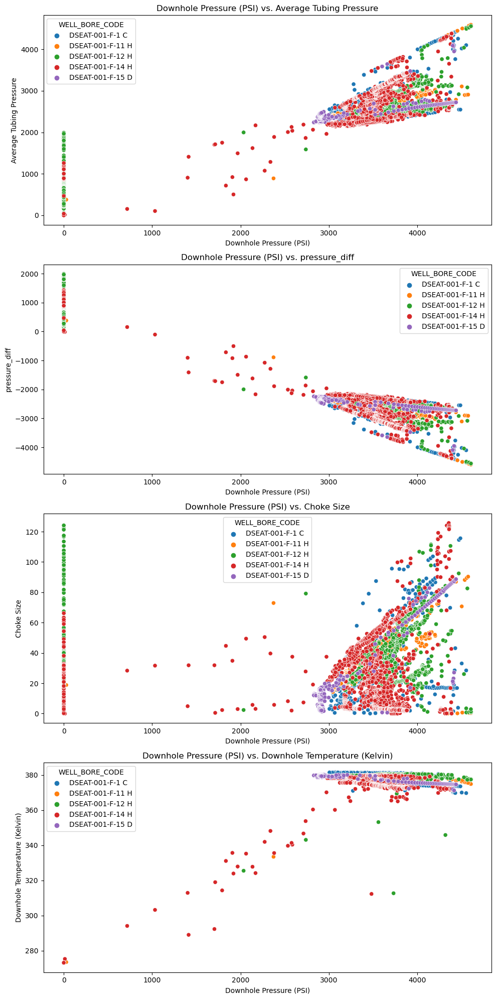

In [326]:
features = ['Average Tubing Pressure', 'pressure_diff', 'Choke Size', 'Downhole Temperature (Kelvin)']
fig, axes = plt.subplots(len(features), 1, figsize=(10, 20))

for i, feature in enumerate(features):
    sns.scatterplot(ax=axes[i], x='Downhole Pressure (PSI)', y=feature, data=train_df, hue='WELL_BORE_CODE')
    axes[i].set_title(f'Downhole Pressure (PSI) vs. {feature}')
    axes[i].set_xlabel('Downhole Pressure (PSI)')
    axes[i].set_ylabel(feature)

plt.tight_layout();

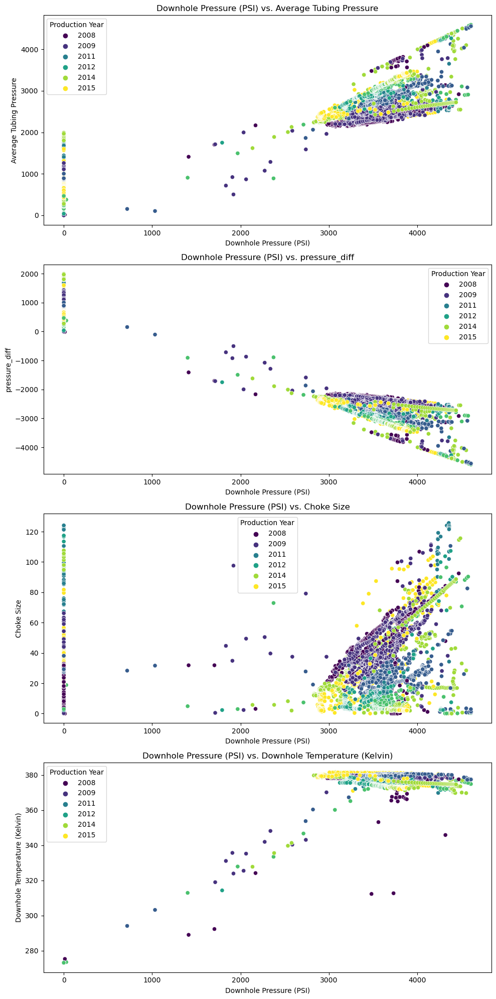

In [327]:
features = ['Average Tubing Pressure', 'pressure_diff', 'Choke Size', 'Downhole Temperature (Kelvin)']
fig, axes = plt.subplots(len(features), 1, figsize=(10, 20))

for i, feature in enumerate(features):
    sns.scatterplot(ax=axes[i], x='Downhole Pressure (PSI)', y=feature, data=train_df, hue='Production Year', palette='viridis')
    axes[i].set_title(f'Downhole Pressure (PSI) vs. {feature}')
    axes[i].set_xlabel('Downhole Pressure (PSI)')
    axes[i].set_ylabel(feature)

plt.tight_layout();

<Figure size 1200x600 with 0 Axes>

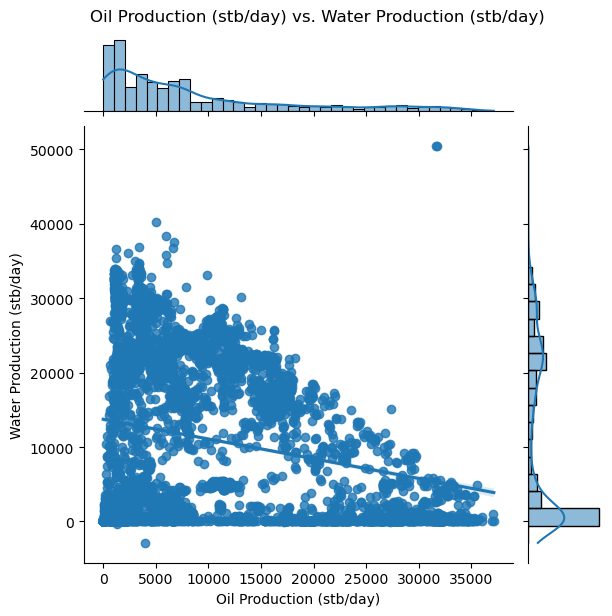

<Figure size 1200x600 with 0 Axes>

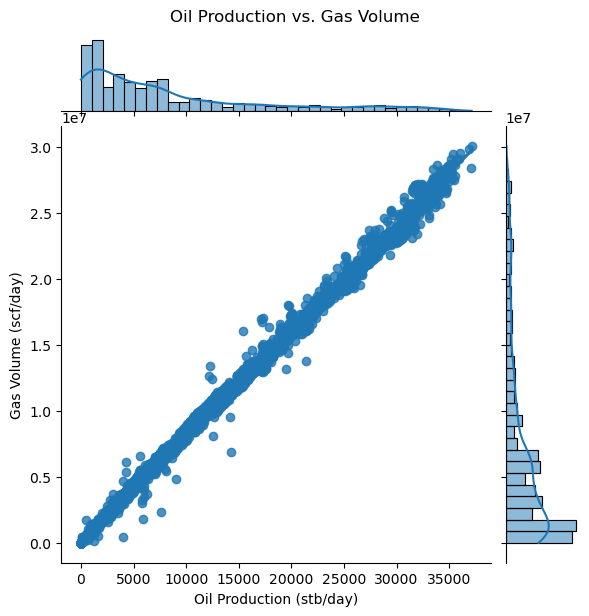

<Figure size 1200x600 with 0 Axes>

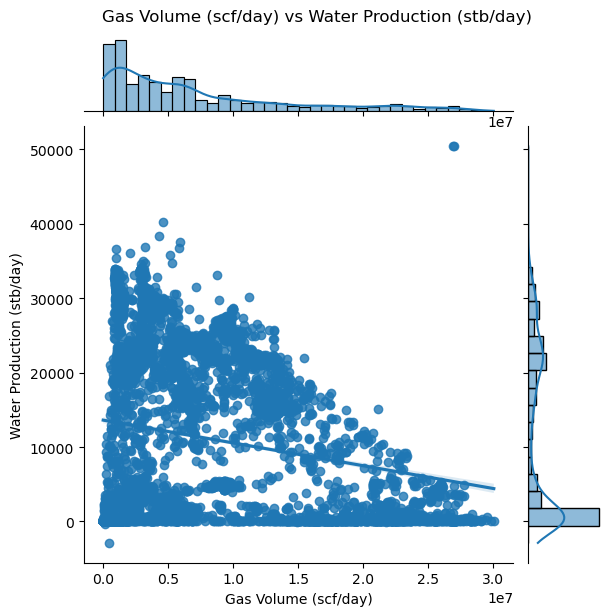

In [328]:
plt.figure(figsize=(12, 6))
sns.jointplot(x='Oil Production (stb/day)', y='Water Production (stb/day)', data=train_df, kind='reg')
plt.suptitle('Oil Production (stb/day) vs. Water Production (stb/day)', y=1.02)

plt.figure(figsize=(12, 6))
sns.jointplot(x='Oil Production (stb/day)', y='Gas Volume (scf/day)', data=train_df, kind='reg')
plt.suptitle('Oil Production vs. Gas Volume', y=1.02)

plt.figure(figsize=(12, 6))
sns.jointplot(x='Gas Volume (scf/day)', y='Water Production (stb/day)', data=train_df, kind='reg')
plt.suptitle('Gas Volume (scf/day) vs Water Production (stb/day)', y=1.02);

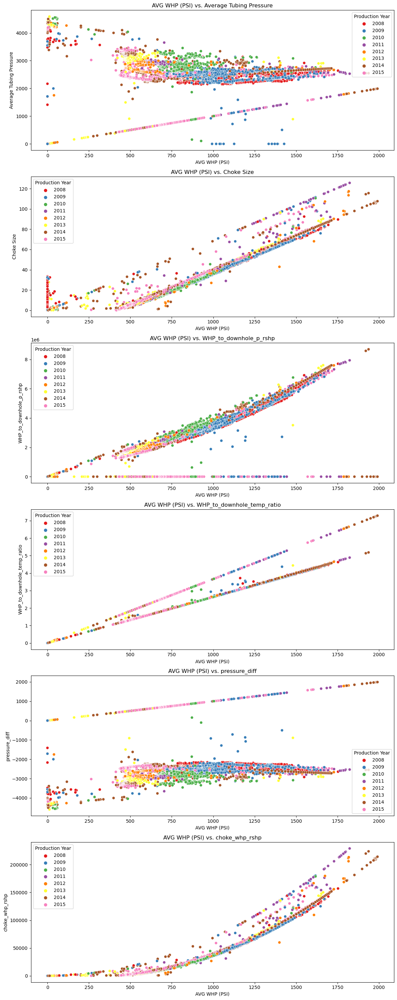

In [329]:
features = ['Average Tubing Pressure', 'Choke Size', 'WHP_to_downhole_p_rshp','WHP_to_downhole_temp_ratio','pressure_diff', 'choke_whp_rshp']
fig, axes = plt.subplots(len(features), 1, figsize=(12, 30))

for i, feature in enumerate(features):
    sns.scatterplot(ax=axes[i], x='AVG WHP (PSI)', y=feature, data=train_df, hue='Production Year', palette='Set1')
    axes[i].set_title(f'AVG WHP (PSI) vs. {feature}')
    axes[i].set_xlabel('AVG WHP (PSI)')
    axes[i].set_ylabel(feature)

plt.tight_layout();

In [330]:
train_df.select_dtypes(include=['number']).columns.tolist()

['N_WELL_BORE_CODE',
 'Downhole Pressure (PSI)',
 'Downhole Temperature (Kelvin)',
 'Average Tubing Pressure',
 'Annulus Pressure (PSI)',
 'AVG WHP (PSI)',
 'Choke Size',
 'Oil Production (stb/day)',
 'Gas Volume (scf/day)',
 'Water Production (stb/day)',
 'Production Year',
 'WELL_BORE_CODE_encoded',
 'N_WELL_BORE_CODE_encoded',
 'WellBore Name_encoded',
 'Production Month_encoded',
 'Average Annulus Pressure (PSI)',
 'downhole_p_t_K',
 'tubing_downhole_p_rshp',
 'WHP_to_downhole_p_rshp',
 'tubing_downhole_temp_ratio',
 'WHP_to_downhole_temp_ratio',
 'pressure_diff',
 'choke_whp_rshp']

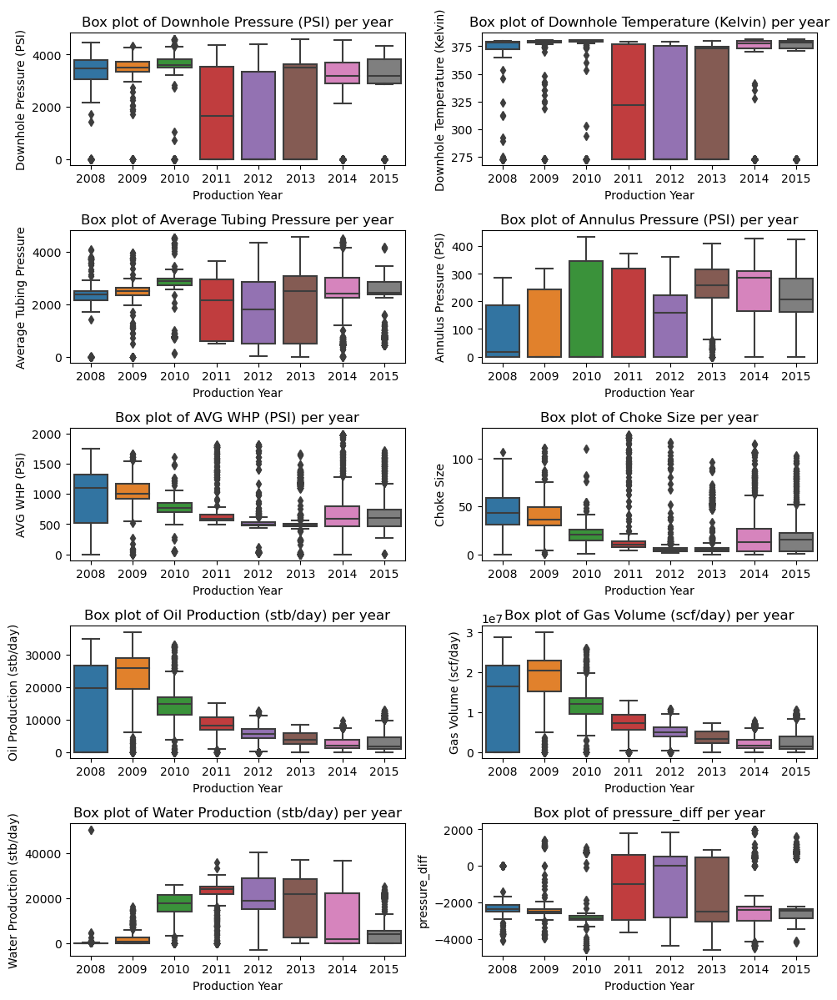

In [331]:
numerical_features = [
    'Downhole Pressure (PSI)', 'Downhole Temperature (Kelvin)',
    'Average Tubing Pressure', 'Annulus Pressure (PSI)', 'AVG WHP (PSI)',
    'Choke Size', 'Oil Production (stb/day)', 'Gas Volume (scf/day)',
    'Water Production (stb/day)', 'pressure_diff']

plt.figure(figsize=(10, 12))
for i, feature in enumerate(numerical_features, 1):
    plt.subplot(5, 2, i)
    sns.boxplot(y=feature, data=train_df,x='Production Year')
    plt.title(f'Box plot of {feature} per year')
plt.tight_layout();

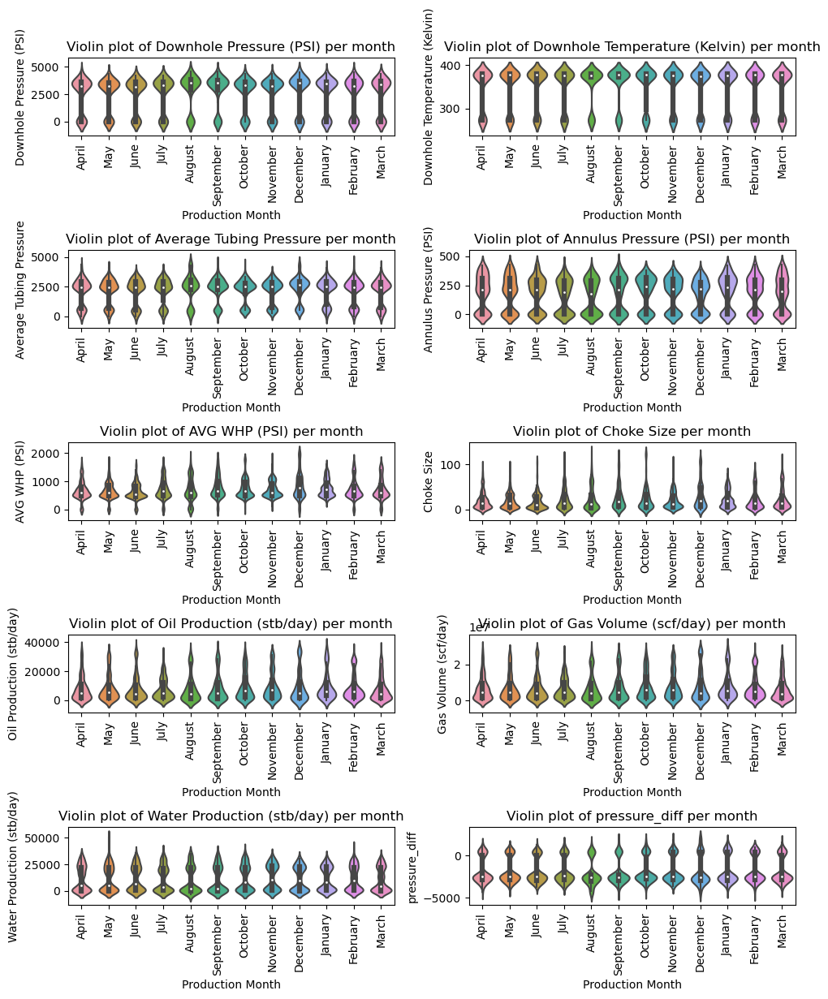

In [332]:
plt.figure(figsize=(10, 12))
for i, feature in enumerate(numerical_features, 1):
    plt.subplot(5, 2, i)
    sns.violinplot(x='Production Month', y=feature, data=train_df)
    plt.title(f'Violin plot of {feature} per month')
    plt.xticks(rotation=90)

plt.subplots_adjust(top=1.0)
plt.tight_layout();

In [333]:
train_df.corr()['Oil Production (stb/day)'].sort_values()

Production Year                  -0.714094
Average Annulus Pressure (PSI)   -0.625420
pressure_diff                    -0.235802
Water Production (stb/day)       -0.206238
Annulus Pressure (PSI)           -0.092136
Production Month_encoded          0.016772
WELL_BORE_CODE_encoded            0.024403
WellBore Name_encoded             0.024403
N_WELL_BORE_CODE_encoded          0.024403
N_WELL_BORE_CODE                  0.024403
tubing_downhole_temp_ratio        0.181556
choke_whp_rshp                    0.201789
Average Tubing Pressure           0.203944
tubing_downhole_p_rshp            0.210229
Choke Size                        0.288742
downhole_p_t_K                    0.311909
Downhole Pressure (PSI)           0.318232
WHP_to_downhole_temp_ratio        0.325692
Downhole Temperature (Kelvin)     0.339666
AVG WHP (PSI)                     0.427988
WHP_to_downhole_p_rshp            0.456693
Gas Volume (scf/day)              0.998425
Oil Production (stb/day)          1.000000
Name: Oil P

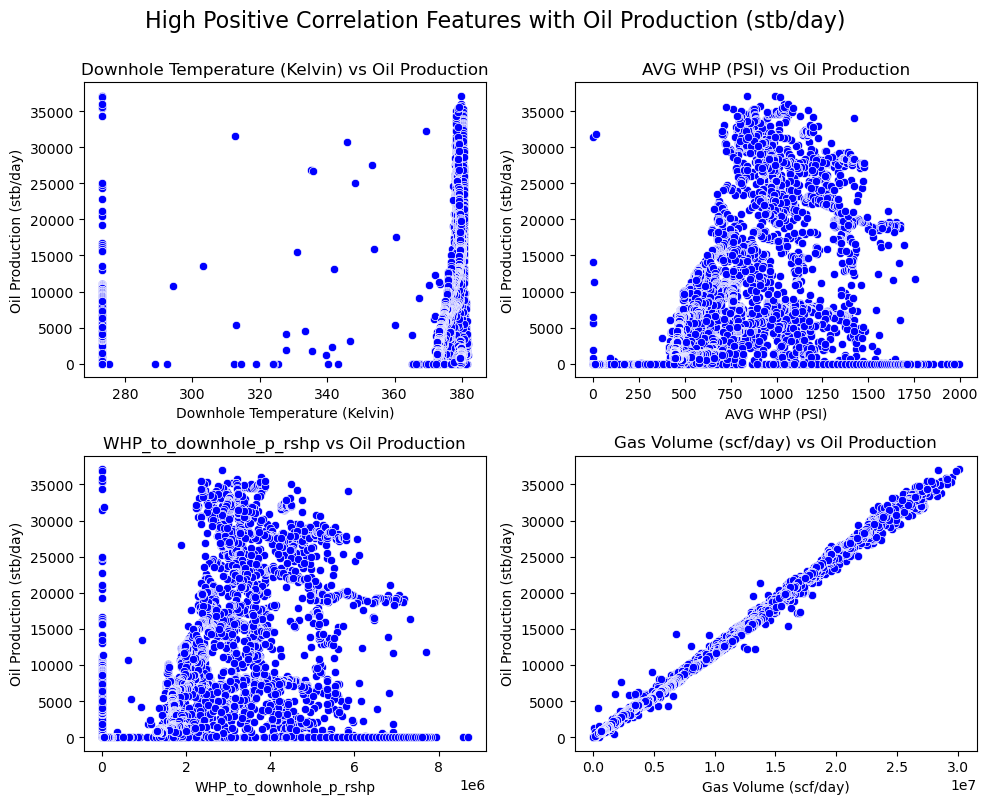

In [334]:
features = ['Downhole Temperature (Kelvin)', 'AVG WHP (PSI)', 'WHP_to_downhole_p_rshp','Gas Volume (scf/day)']
plt.figure(figsize=(10, 8))

for i, feature in enumerate(features, 1):
    plt.subplot(2, 2, i)
    sns.scatterplot(x=feature, y='Oil Production (stb/day)', data=train_df, color='b')
    plt.title(f'{feature} vs Oil Production')
    plt.xlabel(feature)
    plt.ylabel('Oil Production (stb/day)')

plt.suptitle('High Positive Correlation Features with Oil Production (stb/day)', fontsize=16, y=1)
plt.tight_layout();

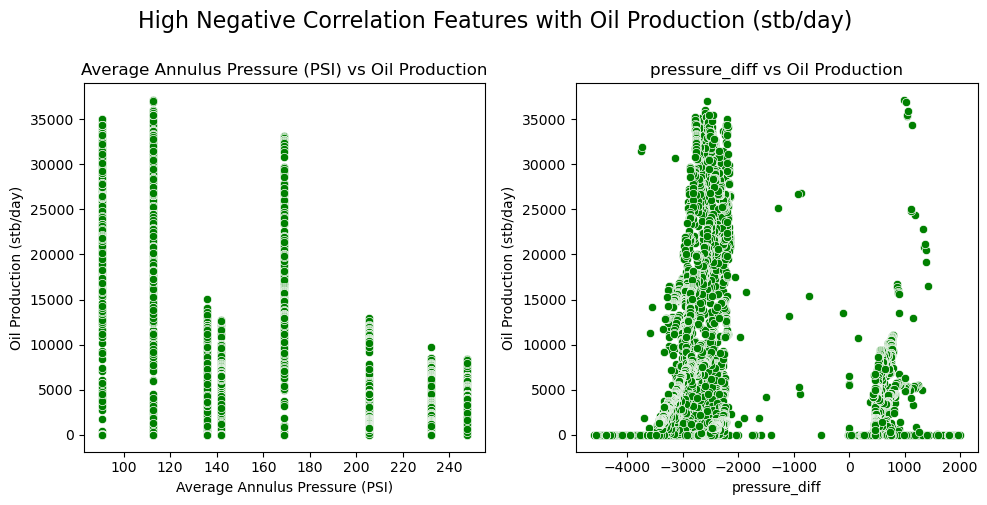

In [335]:
features = ['Average Annulus Pressure (PSI)','pressure_diff']
plt.figure(figsize=(10, 5))

for i, feature in enumerate(features, 1):
    plt.subplot(1, 2, i)
    sns.scatterplot(x=feature, y='Oil Production (stb/day)', data=train_df, color='g')
    plt.title(f'{feature} vs Oil Production')
    plt.xlabel(feature)
    plt.ylabel('Oil Production (stb/day)')

plt.suptitle('High Negative Correlation Features with Oil Production (stb/day)', fontsize=16, y=1)
plt.tight_layout();

In [336]:
train_df.corr()['Water Production (stb/day)'].sort_values()

Choke Size                       -0.587925
WHP_to_downhole_p_rshp           -0.508467
choke_whp_rshp                   -0.484070
AVG WHP (PSI)                    -0.447215
Downhole Temperature (Kelvin)    -0.429728
Downhole Pressure (PSI)          -0.378980
downhole_p_t_K                   -0.374266
WHP_to_downhole_temp_ratio       -0.322958
Average Tubing Pressure          -0.250208
tubing_downhole_p_rshp           -0.246060
tubing_downhole_temp_ratio       -0.225516
Oil Production (stb/day)         -0.206238
Gas Volume (scf/day)             -0.189390
Production Month_encoded          0.017954
Production Year                   0.126400
N_WELL_BORE_CODE                  0.147892
WellBore Name_encoded             0.147892
N_WELL_BORE_CODE_encoded          0.147892
WELL_BORE_CODE_encoded            0.147892
Average Annulus Pressure (PSI)    0.173473
Annulus Pressure (PSI)            0.222422
pressure_diff                     0.295184
Water Production (stb/day)        1.000000
Name: Water

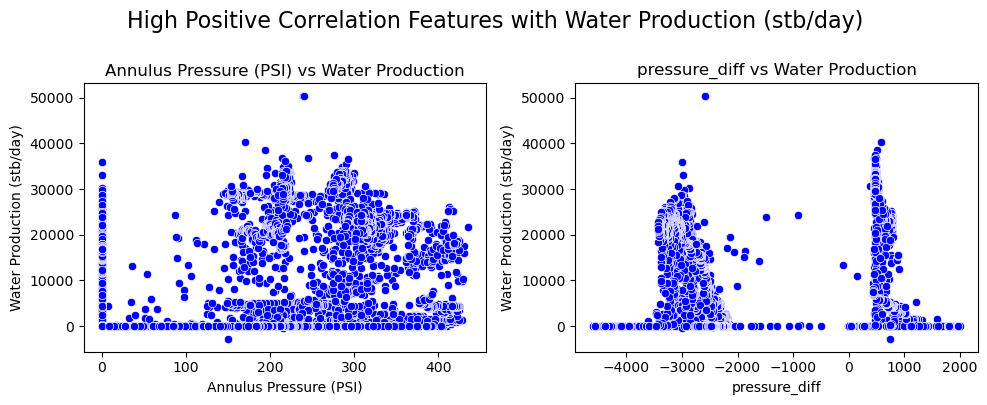

In [337]:
features = ['Annulus Pressure (PSI)', 'pressure_diff']
plt.figure(figsize=(10, 4))

for i, feature in enumerate(features, 1):
    plt.subplot(1, 2, i)
    sns.scatterplot(x=feature, y='Water Production (stb/day)', data=train_df, color='b')
    plt.title(f'{feature} vs Water Production')
    plt.xlabel(feature)
    plt.ylabel('Water Production (stb/day)')

plt.suptitle('High Positive Correlation Features with Water Production (stb/day)', fontsize=16, y=1)
plt.tight_layout();

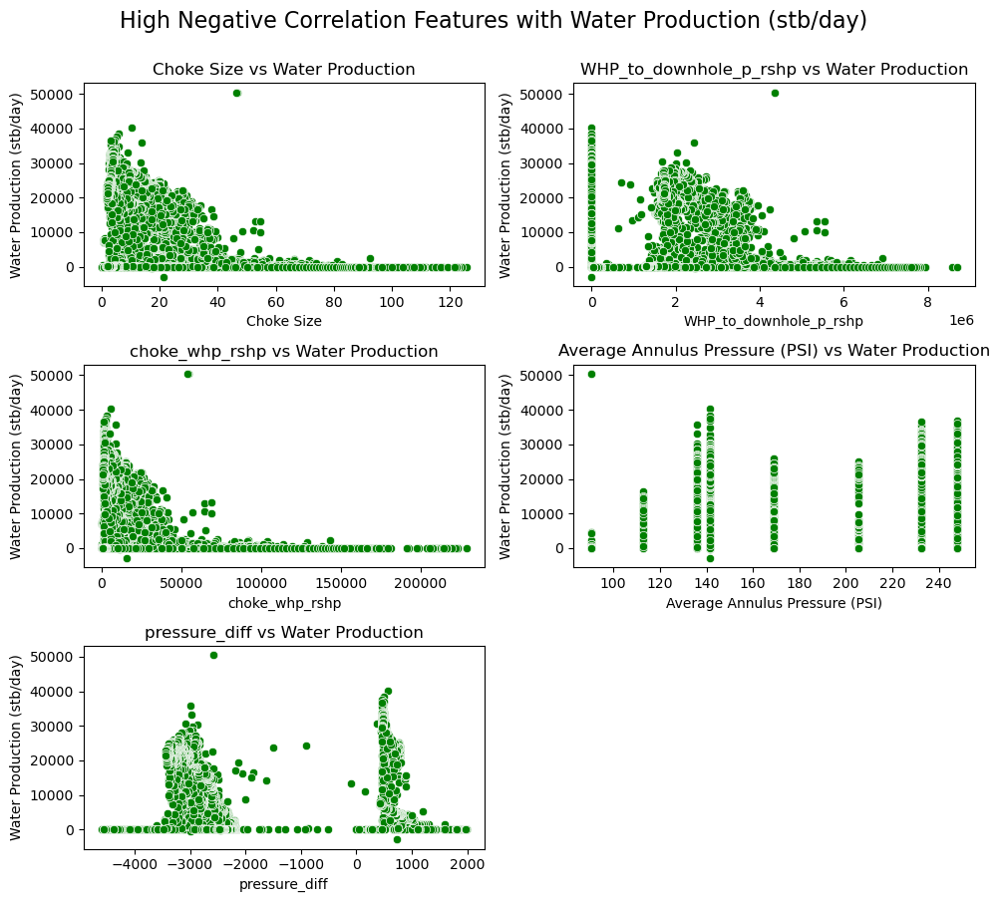

In [338]:
features = ['Choke Size', 'WHP_to_downhole_p_rshp', 'choke_whp_rshp','Average Annulus Pressure (PSI)','pressure_diff']
plt.figure(figsize=(10, 9))

for i, feature in enumerate(features, 1):
    plt.subplot(3, 2, i)
    sns.scatterplot(x=feature, y='Water Production (stb/day)', data=train_df, color='g')
    plt.title(f'{feature} vs Water Production')
    plt.xlabel(feature)
    plt.ylabel('Water Production (stb/day)')

plt.suptitle('High Negative Correlation Features with Water Production (stb/day)', fontsize=16, y=1)
plt.tight_layout();

In [339]:
train_df.corr()['Gas Volume (scf/day)'].sort_values()

Production Year                  -0.715708
Average Annulus Pressure (PSI)   -0.627991
pressure_diff                    -0.234087
Water Production (stb/day)       -0.189390
Annulus Pressure (PSI)           -0.089360
Production Month_encoded          0.017392
WELL_BORE_CODE_encoded            0.023477
WellBore Name_encoded             0.023477
N_WELL_BORE_CODE_encoded          0.023477
N_WELL_BORE_CODE                  0.023477
tubing_downhole_temp_ratio        0.180842
choke_whp_rshp                    0.197906
Average Tubing Pressure           0.202959
tubing_downhole_p_rshp            0.209077
Choke Size                        0.283535
downhole_p_t_K                    0.309908
Downhole Pressure (PSI)           0.316191
WHP_to_downhole_temp_ratio        0.324811
Downhole Temperature (Kelvin)     0.336812
AVG WHP (PSI)                     0.426122
WHP_to_downhole_p_rshp            0.454308
Oil Production (stb/day)          0.998425
Gas Volume (scf/day)              1.000000
Name: Gas V

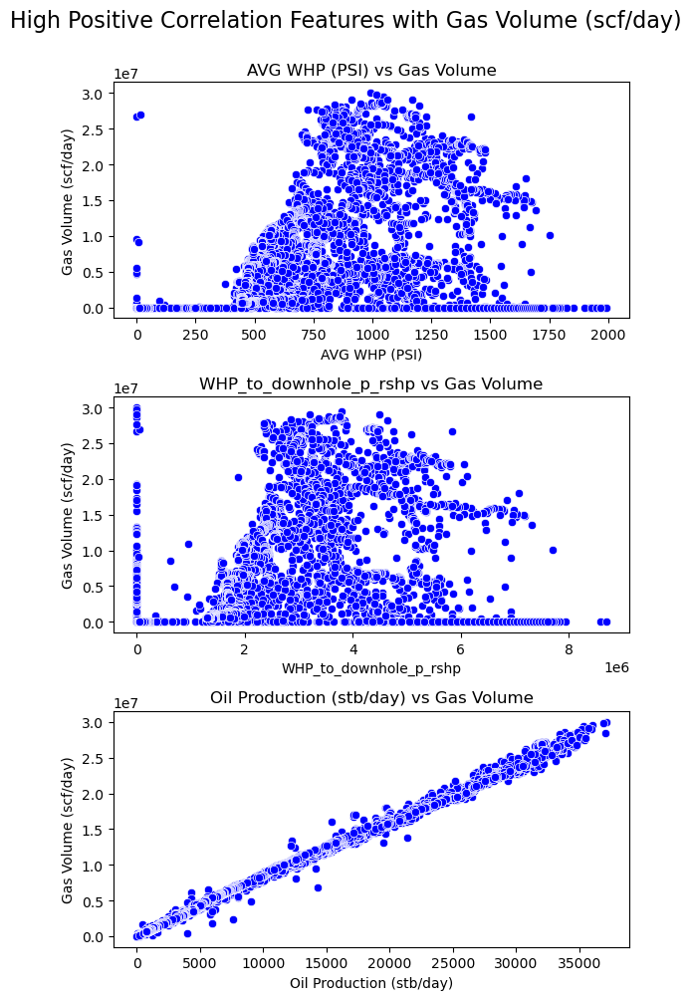

In [340]:
features = ['AVG WHP (PSI)', 'WHP_to_downhole_p_rshp', 'Oil Production (stb/day)']
plt.figure(figsize=(6, 10))

for i, feature in enumerate(features, 1):
    plt.subplot(3, 1, i)
    sns.scatterplot(x=feature, y='Gas Volume (scf/day)', data=train_df, color='b')
    plt.title(f'{feature} vs Gas Volume')
    plt.xlabel(feature)
    plt.ylabel('Gas Volume (scf/day)')

plt.suptitle('High Positive Correlation Features with Gas Volume (scf/day)', fontsize=16, y=1)
plt.tight_layout();

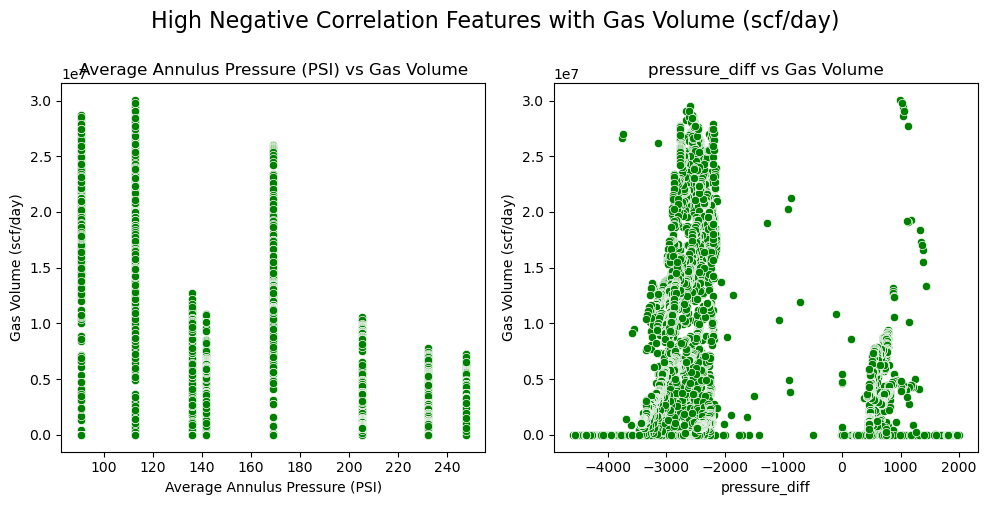

In [341]:
features = ['Average Annulus Pressure (PSI)','pressure_diff']
plt.figure(figsize=(10, 5))

for i, feature in enumerate(features, 1):
    plt.subplot(1, 2, i)
    sns.scatterplot(x=feature, y='Gas Volume (scf/day)', data=train_df, color='g')
    plt.title(f'{feature} vs Gas Volume')
    plt.xlabel(feature)
    plt.ylabel('Gas Volume (scf/day)')

plt.suptitle('High Negative Correlation Features with Gas Volume (scf/day)', fontsize=16, y=1)
plt.tight_layout();

### Further analysis after gaining some insights from the graph

In [342]:
train_df.head(2)

,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,...,WellBore Name_encoded,Production Month_encoded,Average Annulus Pressure (PSI),downhole_p_t_K,tubing_downhole_p_rshp,WHP_to_downhole_p_rshp,tubing_downhole_temp_ratio,WHP_to_downhole_temp_ratio,pressure_diff,choke_whp_rshp
0,DSEAT-001-F-1 C,105,001-F-1 C,OP,0.0,273.15,0.0,0.0,0.0,0.0,...,0,0,232.189879,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,DSEAT-001-F-1 C,105,001-F-1 C,OP,0.0,273.15,0.0,0.0,0.0,0.0,...,0,0,232.189879,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [343]:
test_df.head(2)

,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,...,WellBore Name_encoded,Production Month_encoded,Average Annulus Pressure (PSI),downhole_p_t_K,tubing_downhole_p_rshp,WHP_to_downhole_p_rshp,tubing_downhole_temp_ratio,WHP_to_downhole_temp_ratio,pressure_diff,choke_whp_rshp
0,DSEAT-001-F-1 C,105.0,001-F-1 C,OP,3061.253047,380.665745,2659.80958,0.0,401.443468,0.491632,...,0,5,159.324437,8.041840,8.142350e+06,1.228920e+06,6.987258,1.054583,-2659.809579,197.362339
1,DSEAT-001-F-1 C,105.0,001-F-1 C,OP,3247.951135,376.759980,2547.45367,0.0,700.497465,21.775180,...,0,5,159.324437,8.620743,8.274005e+06,2.275182e+06,6.761476,1.859267,-2547.453670,15253.458390


 ### Creating a new feature called avg_whp_per_year which is done by calculating the mean AVG WHP(PSI) per Production Year

In [344]:
avg_whp_per_year = train_df.groupby('Production Year')['AVG WHP (PSI)'].mean().reset_index()

In [345]:
avg_whp_per_year.head()

,Production Year,AVG WHP (PSI)
0,2008,893.772913
1,2009,1040.351312
2,2010,762.862025
3,2011,689.838166
4,2012,519.594092


In [346]:
train_df = pd.merge(train_df, avg_whp_per_year, on='Production Year', how='left', suffixes=('', '/yr'))

In [347]:
train_df.head()

,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,...,Production Month_encoded,Average Annulus Pressure (PSI),downhole_p_t_K,tubing_downhole_p_rshp,WHP_to_downhole_p_rshp,tubing_downhole_temp_ratio,WHP_to_downhole_temp_ratio,pressure_diff,choke_whp_rshp,AVG WHP (PSI)/yr
0,DSEAT-001-F-1 C,105,001-F-1 C,OP,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,...,0,232.189879,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000,0.00000,0.000000,669.732852
1,DSEAT-001-F-1 C,105,001-F-1 C,OP,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,...,0,232.189879,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000,0.00000,0.000000,669.732852
2,DSEAT-001-F-1 C,105,001-F-1 C,OP,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,...,0,232.189879,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000,0.00000,0.000000,669.732852
3,DSEAT-001-F-1 C,105,001-F-1 C,OP,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,...,0,232.189879,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000,0.00000,0.000000,669.732852
4,DSEAT-001-F-1 C,105,001-F-1 C,OP,4500.45403,370.02589,4020.53477,0.0,479.91926,33.07195,...,0,232.189879,12.162538,1.809423e+07,2.159855e+06,10.86555,1.296988,-4020.53477,15871.865771,669.732852


In [348]:
avg_whp_per_year_t = test_df.groupby('Production Year')['AVG WHP (PSI)'].mean().reset_index()
test_df = pd.merge(test_df, avg_whp_per_year_t, on='Production Year', how='left', suffixes=('', '/yr'))

In [349]:
test_df.head(2)

,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,...,Production Month_encoded,Average Annulus Pressure (PSI),downhole_p_t_K,tubing_downhole_p_rshp,WHP_to_downhole_p_rshp,tubing_downhole_temp_ratio,WHP_to_downhole_temp_ratio,pressure_diff,choke_whp_rshp,AVG WHP (PSI)/yr
0,DSEAT-001-F-1 C,105.0,001-F-1 C,OP,3061.253047,380.665745,2659.80958,0.0,401.443468,0.491632,...,5,159.324437,8.041840,8.142350e+06,1.228920e+06,6.987258,1.054583,-2659.809579,197.362339,595.252735
1,DSEAT-001-F-1 C,105.0,001-F-1 C,OP,3247.951135,376.759980,2547.45367,0.0,700.497465,21.775180,...,5,159.324437,8.620743,8.274005e+06,2.275182e+06,6.761476,1.859267,-2547.453670,15253.458390,595.252735


### Creating a new feature called choke_size_per_year which is done by calculating the average Choke Size per Production Year

In [350]:
choke_size_per_year = train_df.groupby('Production Year')['Choke Size'].mean().reset_index()
train_df = pd.merge(train_df, choke_size_per_year, on='Production Year', how='left', suffixes=('', '/yr'))
choke_size_per_year_t = test_df.groupby('Production Year')['Choke Size'].mean().reset_index()
test_df = pd.merge(test_df, choke_size_per_year_t, on='Production Year', how='left', suffixes=('', '/yr'))

In [351]:
train_df.corr()

,N_WELL_BORE_CODE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day),...,Average Annulus Pressure (PSI),downhole_p_t_K,tubing_downhole_p_rshp,WHP_to_downhole_p_rshp,tubing_downhole_temp_ratio,WHP_to_downhole_temp_ratio,pressure_diff,choke_whp_rshp,AVG WHP (PSI)/yr,Choke Size/yr
N_WELL_BORE_CODE,1.000000,0.107050,0.121245,0.144271,-0.046946,-0.186169,-0.220687,0.024403,0.023477,0.147892,...,-0.177032,0.111651,0.120790,-0.067875,0.143954,-0.213279,-0.155256,-0.170934,0.087853,0.079921
Downhole Pressure (PSI),0.107050,1.000000,0.976292,0.950710,-0.185430,0.322986,0.271500,0.318232,0.316191,-0.378980,...,-0.057301,0.999790,0.960193,0.765020,0.924682,0.056087,-0.976020,0.236146,0.267304,0.234701
Downhole Temperature (Kelvin),0.121245,0.976292,1.000000,0.914867,-0.186245,0.301547,0.225783,0.339666,0.336812,-0.429728,...,-0.046188,0.973909,0.898306,0.729502,0.882054,0.030475,-0.956050,0.177261,0.269194,0.236358
Average Tubing Pressure,0.144271,0.950710,0.914867,1.000000,-0.137008,0.181183,0.124714,0.203944,0.202959,-0.250208,...,0.036905,0.952329,0.977097,0.570185,0.995750,-0.035262,-0.956867,0.122790,0.134895,0.085811
Annulus Pressure (PSI),-0.046946,-0.185430,-0.186245,-0.137008,1.000000,-0.086250,-0.220282,-0.092136,-0.089360,0.222422,...,0.385472,-0.184946,-0.157026,-0.190657,-0.121986,-0.020204,0.174921,-0.207618,-0.238609,-0.247073
AVG WHP (PSI),-0.186169,0.322986,0.301547,0.181183,-0.086250,1.000000,0.905525,0.427988,0.426122,-0.447215,...,-0.256237,0.318033,0.160730,0.764551,0.190792,0.951409,-0.109227,0.897237,0.413950,0.394344
Choke Size,-0.220687,0.271500,0.225783,0.124714,-0.220282,0.905525,1.000000,0.288742,0.283535,-0.587925,...,-0.294645,0.268373,0.139849,0.717870,0.130983,0.858358,-0.076882,0.962491,0.437919,0.459691
Oil Production (stb/day),0.024403,0.318232,0.339666,0.203944,-0.092136,0.427988,0.288742,1.000000,0.998425,-0.206238,...,-0.625420,0.311909,0.210229,0.456693,0.181556,0.325692,-0.235802,0.201789,0.704726,0.652604
Gas Volume (scf/day),0.023477,0.316191,0.336812,0.202959,-0.089360,0.426122,0.283535,0.998425,1.000000,-0.189390,...,-0.627991,0.309908,0.209077,0.454308,0.180842,0.324811,-0.234087,0.197906,0.687253,0.639330
Water Production (stb/day),0.147892,-0.378980,-0.429728,-0.250208,0.222422,-0.447215,-0.587925,-0.206238,-0.189390,1.000000,...,0.173473,-0.374266,-0.246060,-0.508467,-0.225516,-0.322958,0.295184,-0.484070,-0.438586,-0.488218


In [352]:
test_df.corr()

,N_WELL_BORE_CODE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Production Year,WELL_BORE_CODE_encoded,N_WELL_BORE_CODE_encoded,...,Average Annulus Pressure (PSI),downhole_p_t_K,tubing_downhole_p_rshp,WHP_to_downhole_p_rshp,tubing_downhole_temp_ratio,WHP_to_downhole_temp_ratio,pressure_diff,choke_whp_rshp,AVG WHP (PSI)/yr,Choke Size/yr
N_WELL_BORE_CODE,1.000000,0.036616,-0.007056,0.101291,0.258884,-0.245599,-0.181013,0.093983,1.000000,1.000000,...,0.093983,0.045538,0.124600,-0.194792,0.113714,-0.251643,-0.091136,-0.198728,-0.093983,-0.093983
Downhole Pressure (PSI),0.036616,1.000000,0.942854,0.965313,-0.339201,0.249227,0.306677,-0.037980,0.036616,0.036616,...,-0.037980,0.999563,0.932466,0.550801,0.957016,0.092649,-0.977616,0.257876,0.037980,0.037980
Downhole Temperature (Kelvin),-0.007056,0.942854,1.000000,0.889743,-0.241221,0.237914,0.231186,-0.086478,-0.007056,-0.007056,...,-0.086478,0.934222,0.788870,0.519961,0.867847,0.072734,-0.921112,0.181329,0.086478,0.086478
Average Tubing Pressure,0.101291,0.965313,0.889743,1.000000,-0.266237,0.012966,0.086850,0.030070,0.101291,0.101291,...,0.030070,0.967235,0.974424,0.324720,0.998667,-0.133998,-0.993155,0.036229,-0.030070,-0.030070
Annulus Pressure (PSI),0.258884,-0.339201,-0.241221,-0.266237,1.000000,-0.327105,-0.528509,0.282676,0.258884,0.258884,...,0.282676,-0.343569,-0.334672,-0.406568,-0.267810,-0.278199,0.278910,-0.463412,-0.282676,-0.282676
AVG WHP (PSI),-0.245599,0.249227,0.237914,0.012966,-0.327105,1.000000,0.910466,-0.284138,-0.245599,-0.245599,...,-0.284138,0.245153,0.010834,0.927177,0.002076,0.983616,-0.039890,0.919625,0.284138,0.284138
Choke Size,-0.181013,0.306677,0.231186,0.086850,-0.528509,0.910466,1.000000,-0.146977,-0.181013,-0.181013,...,-0.146977,0.307820,0.139583,0.898956,0.080855,0.878982,-0.118616,0.978984,0.146977,0.146977
Production Year,0.093983,-0.037980,-0.086478,0.030070,0.282676,-0.284138,-0.146977,1.000000,0.093983,0.093983,...,1.000000,-0.034339,0.064879,-0.220391,0.035599,-0.282624,-0.022544,-0.157329,-1.000000,-1.000000
WELL_BORE_CODE_encoded,1.000000,0.036616,-0.007056,0.101291,0.258884,-0.245599,-0.181013,0.093983,1.000000,1.000000,...,0.093983,0.045538,0.124600,-0.194792,0.113714,-0.251643,-0.091136,-0.198728,-0.093983,-0.093983
N_WELL_BORE_CODE_encoded,1.000000,0.036616,-0.007056,0.101291,0.258884,-0.245599,-0.181013,0.093983,1.000000,1.000000,...,0.093983,0.045538,0.124600,-0.194792,0.113714,-0.251643,-0.091136,-0.198728,-0.093983,-0.093983


### Data Preparation for training

In [353]:
train_final = train_df.drop(['WELL_BORE_CODE','N_WELL_BORE_CODE', 'WellBore Name','Production Year','Production Month'],axis=1)

In [354]:
train_df.columns

Index(['WELL_BORE_CODE', 'N_WELL_BORE_CODE', 'WellBore Name', 'WELL_TYPE',
       'Downhole Pressure (PSI)', 'Downhole Temperature (Kelvin)',
       'Average Tubing Pressure', 'Annulus Pressure (PSI)', 'AVG WHP (PSI)',
       'Choke Size', 'Oil Production (stb/day)', 'Gas Volume (scf/day)',
       'Water Production (stb/day)', 'Production Year', 'Production Month',
       'WELL_BORE_CODE_encoded', 'N_WELL_BORE_CODE_encoded',
       'WellBore Name_encoded', 'Production Month_encoded',
       'Average Annulus Pressure (PSI)', 'downhole_p_t_K',
       'tubing_downhole_p_rshp', 'WHP_to_downhole_p_rshp',
       'tubing_downhole_temp_ratio', 'WHP_to_downhole_temp_ratio',
       'pressure_diff', 'choke_whp_rshp', 'AVG WHP (PSI)/yr', 'Choke Size/yr'],
      dtype='object')

In [355]:
test_df.columns

Index(['WELL_BORE_CODE', 'N_WELL_BORE_CODE', 'WellBore Name', 'WELL_TYPE',
       'Downhole Pressure (PSI)', 'Downhole Temperature (Kelvin)',
       'Average Tubing Pressure', 'Annulus Pressure (PSI)', 'AVG WHP (PSI)',
       'Choke Size', 'Production Year', 'Production Month',
       'WELL_BORE_CODE_encoded', 'N_WELL_BORE_CODE_encoded',
       'WellBore Name_encoded', 'Production Month_encoded',
       'Average Annulus Pressure (PSI)', 'downhole_p_t_K',
       'tubing_downhole_p_rshp', 'WHP_to_downhole_p_rshp',
       'tubing_downhole_temp_ratio', 'WHP_to_downhole_temp_ratio',
       'pressure_diff', 'choke_whp_rshp', 'AVG WHP (PSI)/yr', 'Choke Size/yr'],
      dtype='object')

In [356]:
train_final = train_df.drop(['WELL_BORE_CODE','N_WELL_BORE_CODE', 'WellBore Name','Production Year','Production Month'], axis=1)

In [357]:
test_final = test_df.drop(['WELL_BORE_CODE','N_WELL_BORE_CODE', 'WellBore Name','Production Year','Production Month'], axis=1)

In [358]:
len(train_final.columns)

24

In [359]:
len(test_final.columns)

21

In [360]:
train_final.describe()

,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day),WELL_BORE_CODE_encoded,...,Average Annulus Pressure (PSI),downhole_p_t_K,tubing_downhole_p_rshp,WHP_to_downhole_p_rshp,tubing_downhole_temp_ratio,WHP_to_downhole_temp_ratio,pressure_diff,choke_whp_rshp,AVG WHP (PSI)/yr,Choke Size/yr
count,6925.000000,6925.000000,6925.000000,6925.000000,6925.000000,6925.000000,6925.000000,6.925000e+03,6925.000000,6925.000000,...,6925.000000,6925.000000,6.925000e+03,6.925000e+03,6925.000000,6925.000000,6925.000000,6925.000000,6925.000000,6925.000000
mean,2587.482923,349.674794,2161.986343,180.369383,716.576882,21.845613,8494.774524,6.978690e+06,11480.559310,2.297040,...,180.369383,6.857242,7.185413e+06,2.032576e+06,5.877564,2.045309,-1870.906041,22677.554822,716.576882,21.845613
std,1588.474034,46.240823,1053.875029,139.771514,347.859953,22.300308,8927.596731,7.100875e+06,11484.481008,0.980161,...,53.877957,4.212464,4.758563e+06,1.698555e+06,2.617650,0.982268,1512.386963,34428.911067,143.996552,10.251261
min,0.000000,273.150000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,-2879.813600,0.000000,...,90.627598,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,-4592.612695,0.000000,519.594092,8.424753
25%,0.000000,273.150000,896.612291,0.000000,476.539814,4.624581,1686.600600,1.434288e+06,80.323300,2.000000,...,135.844100,0.000000,0.000000e+00,0.000000e+00,3.272076,1.464741,-2907.047474,2052.322175,669.732852,18.395751
50%,3378.397358,376.911370,2472.031527,213.091127,619.647824,14.288309,5479.470600,4.770461e+06,5529.413200,2.000000,...,205.281486,8.911978,8.467852e+06,1.836673e+06,6.538572,1.819527,-2472.031527,8310.325337,671.263788,19.144663
75%,3664.905359,379.496193,2907.047474,300.356843,903.890487,31.528609,11730.472600,9.892230e+06,22261.505100,3.000000,...,232.189879,9.705559,1.053256e+07,3.035532e+06,7.681233,2.553784,0.000000,27836.748219,762.862025,20.685717
max,4606.666675,381.652178,4592.612695,435.287508,1991.009935,125.718570,37122.573600,3.004494e+07,50444.164600,4.000000,...,247.622033,12.478456,2.114666e+07,8.688467e+06,12.250558,7.289072,1991.009935,229174.803221,1040.351312,42.208689


In [361]:
train_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6925 entries, 0 to 6924
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   WELL_TYPE                       6925 non-null   object 
 1   Downhole Pressure (PSI)         6925 non-null   float64
 2   Downhole Temperature (Kelvin)   6925 non-null   float64
 3   Average Tubing Pressure         6925 non-null   float64
 4   Annulus Pressure (PSI)          6925 non-null   float64
 5   AVG WHP (PSI)                   6925 non-null   float64
 6   Choke Size                      6925 non-null   float64
 7   Oil Production (stb/day)        6925 non-null   float64
 8   Gas Volume (scf/day)            6925 non-null   float64
 9   Water Production (stb/day)      6925 non-null   float64
 10  WELL_BORE_CODE_encoded          6925 non-null   int32  
 11  N_WELL_BORE_CODE_encoded        6925 non-null   int64  
 12  WellBore Name_encoded           69

In [362]:
train_final = pd.get_dummies(train_final,columns=['WELL_TYPE'], drop_first=True)

In [363]:
train_final= train_final.rename(columns={'WELL_TYPE_WI': 'WELL_TYPE'})

In [364]:
train_final.head()

,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day),WELL_BORE_CODE_encoded,...,downhole_p_t_K,tubing_downhole_p_rshp,WHP_to_downhole_p_rshp,tubing_downhole_temp_ratio,WHP_to_downhole_temp_ratio,pressure_diff,choke_whp_rshp,AVG WHP (PSI)/yr,Choke Size/yr,WELL_TYPE
0,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,0.0,0.0,0,...,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000,0.00000,0.000000,669.732852,19.144663,0
1,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,0.0,0.0,0,...,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000,0.00000,0.000000,669.732852,19.144663,0
2,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,0.0,0.0,0,...,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000,0.00000,0.000000,669.732852,19.144663,0
3,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,0.0,0.0,0,...,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000,0.00000,0.000000,669.732852,19.144663,0
4,4500.45403,370.02589,4020.53477,0.0,479.91926,33.07195,0.0,0.0,0.0,0,...,12.162538,1.809423e+07,2.159855e+06,10.86555,1.296988,-4020.53477,15871.865771,669.732852,19.144663,0


In [365]:
test_final = pd.get_dummies(test_final,columns=['WELL_TYPE'])
test_final= test_final.rename(columns={'WELL_TYPE_OP': 'WELL_TYPE'})

In [366]:
test_final.head()

,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,WELL_BORE_CODE_encoded,N_WELL_BORE_CODE_encoded,WellBore Name_encoded,Production Month_encoded,...,downhole_p_t_K,tubing_downhole_p_rshp,WHP_to_downhole_p_rshp,tubing_downhole_temp_ratio,WHP_to_downhole_temp_ratio,pressure_diff,choke_whp_rshp,AVG WHP (PSI)/yr,Choke Size/yr,WELL_TYPE
0,3061.253047,380.665745,2659.809580,0.0,401.443468,0.491632,0,0,0,5,...,8.041840,8.142350e+06,1.228920e+06,6.987258,1.054583,-2659.809579,197.362339,595.252735,15.174564,1
1,3247.951135,376.759980,2547.453670,0.0,700.497465,21.775180,0,0,0,5,...,8.620743,8.274005e+06,2.275182e+06,6.761476,1.859267,-2547.453670,15253.458390,595.252735,15.174564,1
2,3333.012485,375.985300,2533.912265,0.0,799.100220,27.638780,0,0,0,5,...,8.864741,8.445561e+06,2.663411e+06,6.739392,2.125350,-2533.912265,22086.155179,595.252735,15.174564,1
3,3404.022465,375.419010,2481.804485,0.0,922.217980,36.178940,0,0,0,5,...,9.067262,8.448118e+06,3.139251e+06,6.610759,2.456503,-2481.804485,33364.868965,595.252735,15.174564,1
4,3465.473030,375.004710,2408.310945,0.0,1057.162085,45.424140,0,0,0,5,...,9.241145,8.345937e+06,3.663567e+06,6.422082,2.819063,-2408.310945,48020.678552,595.252735,15.174564,1


In [367]:
train_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6925 entries, 0 to 6924
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Downhole Pressure (PSI)         6925 non-null   float64
 1   Downhole Temperature (Kelvin)   6925 non-null   float64
 2   Average Tubing Pressure         6925 non-null   float64
 3   Annulus Pressure (PSI)          6925 non-null   float64
 4   AVG WHP (PSI)                   6925 non-null   float64
 5   Choke Size                      6925 non-null   float64
 6   Oil Production (stb/day)        6925 non-null   float64
 7   Gas Volume (scf/day)            6925 non-null   float64
 8   Water Production (stb/day)      6925 non-null   float64
 9   WELL_BORE_CODE_encoded          6925 non-null   int32  
 10  N_WELL_BORE_CODE_encoded        6925 non-null   int64  
 11  WellBore Name_encoded           6925 non-null   int32  
 12  Production Month_encoded        69

In [368]:
test_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2075 entries, 0 to 2074
Data columns (total 21 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Downhole Pressure (PSI)         2075 non-null   float64
 1   Downhole Temperature (Kelvin)   2075 non-null   float64
 2   Average Tubing Pressure         2075 non-null   float64
 3   Annulus Pressure (PSI)          2075 non-null   float64
 4   AVG WHP (PSI)                   2075 non-null   float64
 5   Choke Size                      2075 non-null   float64
 6   WELL_BORE_CODE_encoded          2075 non-null   int32  
 7   N_WELL_BORE_CODE_encoded        2075 non-null   int64  
 8   WellBore Name_encoded           2075 non-null   int32  
 9   Production Month_encoded        2075 non-null   int32  
 10  Average Annulus Pressure (PSI)  2075 non-null   float64
 11  downhole_p_t_K                  2075 non-null   float64
 12  tubing_downhole_p_rshp          20

In [369]:
train_final.to_csv('train_final.csv', index=False)
test_final.to_csv('test_final.csv', index=False)

# Machine Learning / Data Training

In [370]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

### Oil Production

In [371]:
oil_train = pd.read_csv('train_final.csv')

In [372]:
oil_train.head()

,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day),WELL_BORE_CODE_encoded,...,downhole_p_t_K,tubing_downhole_p_rshp,WHP_to_downhole_p_rshp,tubing_downhole_temp_ratio,WHP_to_downhole_temp_ratio,pressure_diff,choke_whp_rshp,AVG WHP (PSI)/yr,Choke Size/yr,WELL_TYPE
0,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,0.0,0.0,0,...,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000,0.00000,0.000000,669.732852,19.144663,0
1,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,0.0,0.0,0,...,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000,0.00000,0.000000,669.732852,19.144663,0
2,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,0.0,0.0,0,...,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000,0.00000,0.000000,669.732852,19.144663,0
3,0.00000,273.15000,0.00000,0.0,0.00000,0.00000,0.0,0.0,0.0,0,...,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000,0.00000,0.000000,669.732852,19.144663,0
4,4500.45403,370.02589,4020.53477,0.0,479.91926,33.07195,0.0,0.0,0.0,0,...,12.162538,1.809423e+07,2.159855e+06,10.86555,1.296988,-4020.53477,15871.865771,669.732852,19.144663,0


In [373]:
X = oil_train.drop(['Oil Production (stb/day)','Gas Volume (scf/day)','Water Production (stb/day)'],axis=1)

In [374]:
len(X.columns)

21

In [375]:
y = oil_train['Oil Production (stb/day)']

In [376]:
y

0         0.0000
1         0.0000
2         0.0000
3         0.0000
4         0.0000
          ...   
6920    747.8181
6921    749.2019
6922    789.9611
6923    789.7724
6924    802.9814
Name: Oil Production (stb/day), Length: 6925, dtype: float64

### Data splitting

In [377]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Scaling

In [378]:
scaler_oil = StandardScaler()
X_train = scaler_oil.fit_transform(X_train)
X_test = scaler_oil.transform(X_test)

## Modelling

In [379]:
models = {
    'Linear Regression': LinearRegression(),
    'SVR': SVR(),
    'Random Forest': RandomForestRegressor(),
    'Decision Tree': DecisionTreeRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(),
    'XGBoost': XGBRegressor()
}

results = {'Model': [], 'R2_SCORE': [], 'RMSE': []}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    r_2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    results['Model'].append(name)
    results['R2_SCORE'].append(r_2)
    results['RMSE'].append(rmse)

results_df = pd.DataFrame(results)

In [380]:
results_df

,Model,R2_SCORE,RMSE
0,Linear Regression,0.601431,5626.058056
1,SVR,-0.030808,9047.764049
2,Random Forest,0.948869,2015.092024
3,Decision Tree,0.912238,2640.005712
4,Gradient Boosting,0.926723,2412.323721
5,XGBoost,0.947584,2040.244857


In [384]:
model = RandomForestRegressor()
param_grid = {'n_estimators': [100,200,300,400], 'max_depth': [None, 10, 20,30]}
grid_search = GridSearchCV(model, param_grid=param_grid, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [None, 10, 20, 30],
                         'n_estimators': [100, 200, 300, 400]},
             scoring='r2')

In [385]:
y_pred = grid_search.predict(X_test)
r_2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(r_2)
print(rmse)
print(grid_search.best_estimator_)

0.9497030410025814
1998.587521871046
RandomForestRegressor(max_depth=30, n_estimators=400)


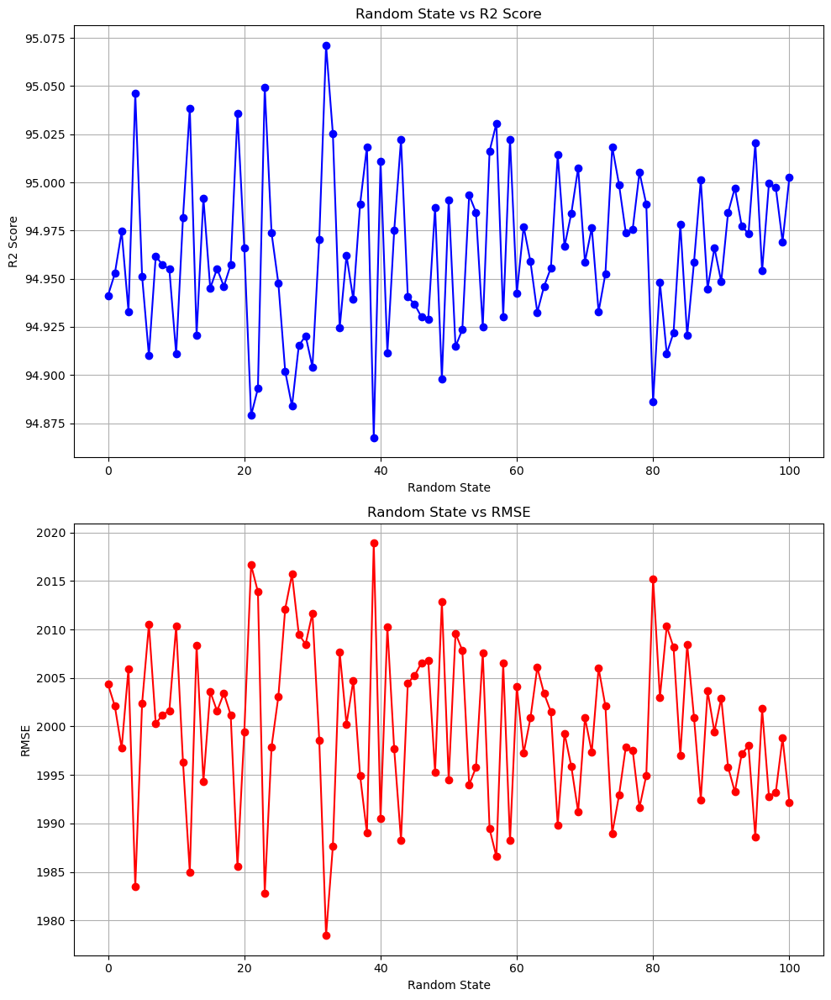

In [386]:
random_states = range(101)
r2_scores = []
rmses = []

for random_state in random_states:
    oil_model = RandomForestRegressor(max_depth=30, n_estimators=400, random_state=random_state)
    oil_model.fit(X_train, y_train)
    y_pred = oil_model.predict(X_test)
    r_2 = r2_score(y_test, y_pred) * 100
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2_scores.append(r_2)
    rmses.append(rmse)

fig, axs = plt.subplots(2, 1, figsize=(10, 12))

titles = ['Random State vs R2 Score', 'Random State vs RMSE']
y_labels = ['R2 Score', 'RMSE']
data = [r2_scores, rmses]
colors = ['b', 'r']

for i in range(2):
    axs[i].plot(random_states, data[i], marker='o', linestyle='-', color=colors[i])
    axs[i].set_title(titles[i])
    axs[i].set_xlabel('Random State')
    axs[i].set_ylabel(y_labels[i])
    axs[i].grid(True)

plt.tight_layout();

In [387]:
max_r2 = r2_scores.index(max(r2_scores))
max_r2_state= random_states[max_r2]

min_rmse = rmses.index(min(rmses))
min_rmse_state = random_states[min_rmse]

print(max_r2_state)
print(min_rmse_state)

32
32


### Final Oil Model

In [388]:
final_oil_model = RandomForestRegressor(max_depth=30, n_estimators=400,random_state=32)
final_oil_model.fit(X_train, y_train)
y_pred = final_oil_model.predict(X_test)
r_2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
result_dict = {'Actual Oil Production': y_test, 'Predicted Oil Production': y_pred}
comparison_df = pd.DataFrame(result_dict)
print(r_2)
print(rmse)

0.9507125027571665
1978.4300074366433


In [389]:
comparison_df

,Actual Oil Production,Predicted Oil Production
468,5607.4092,67.056908
3821,0.0000,0.000000
3218,853.4272,1591.977142
1315,32047.0468,31582.344116
1883,29689.6177,28694.425694
...,...,...
6098,2090.7331,2274.289452
4942,10640.2898,10519.910989
6047,2609.3436,2712.216235
4274,17448.7745,18318.091655


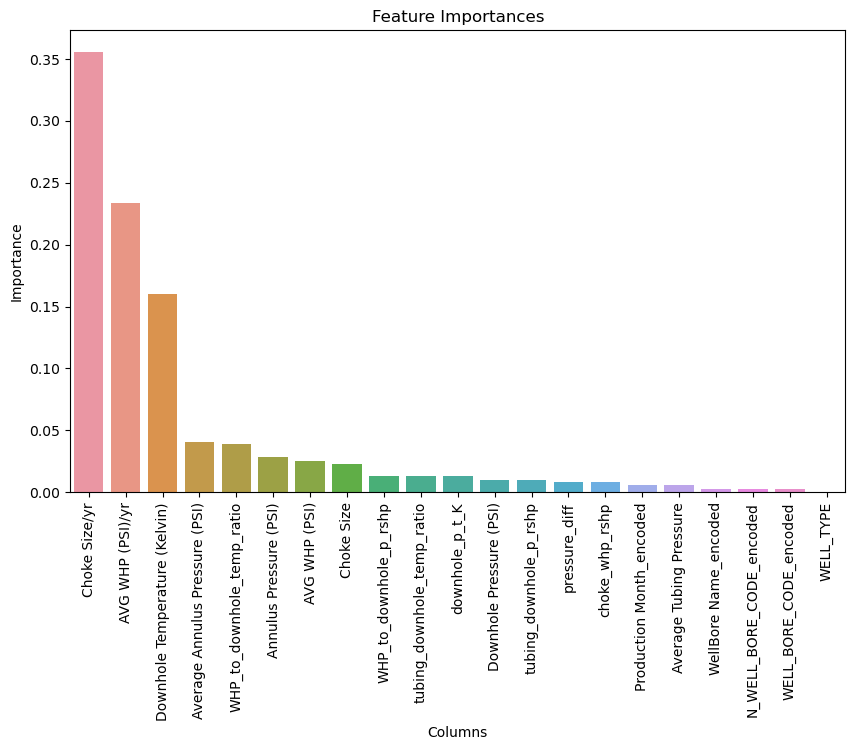

In [390]:
feature_importance = final_oil_model.feature_importances_
feature_columns = X.columns
imp_data =  pd.DataFrame({'Columns': feature_columns, 'Importance': feature_importance})
imp_data = imp_data.sort_values(by='Importance', ascending=False)


plt.figure(figsize=(10, 6))
sns.barplot(x='Columns', y='Importance', data=imp_data)
plt.title('Feature Importances')
plt.xticks(rotation=90);

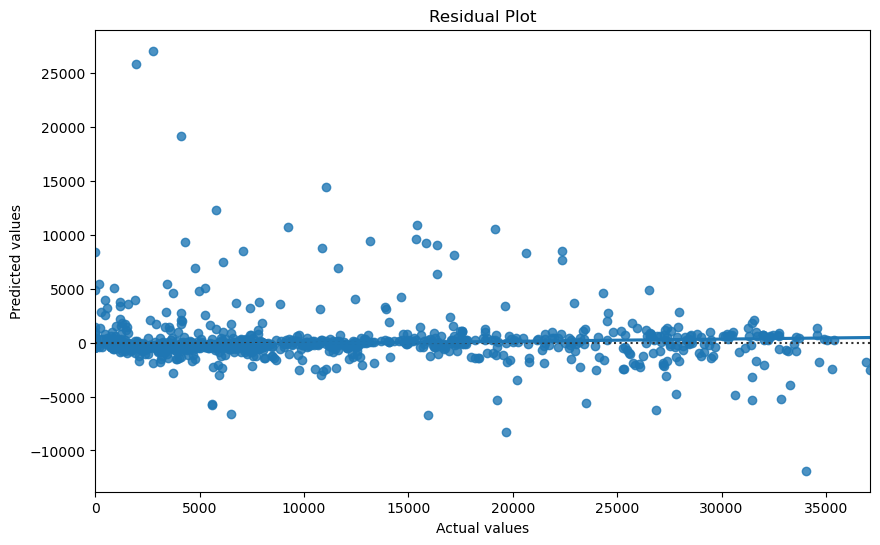

In [391]:
plt.figure(figsize=(10, 6))
sns.residplot(x=y_test, y=y_pred, lowess=True)
plt.xlabel('Actual values')
plt.ylabel('Predicted values')
plt.title('Residual Plot');

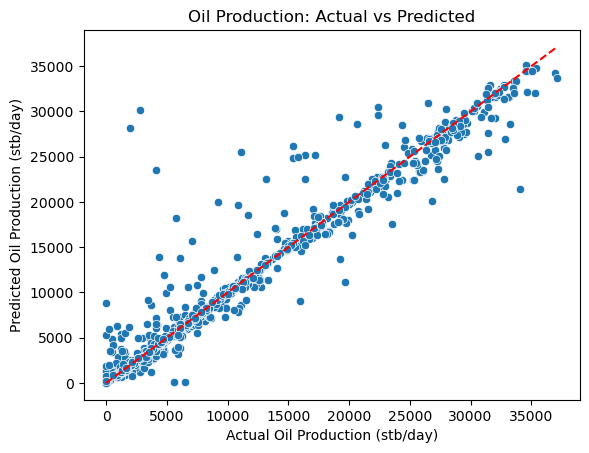

In [395]:
sns.scatterplot(data =comparison_df, x='Actual Oil Production', y='Predicted Oil Production')
plt.plot([comparison_df['Actual Oil Production'].min(), comparison_df['Actual Oil Production'].max()],
         [comparison_df['Actual Oil Production'].min(), comparison_df['Actual Oil Production'].max()], 'r--')
plt.title('Oil Production: Actual vs Predicted')
plt.xlabel('Actual Oil Production (stb/day)')
plt.ylabel('Predicted Oil Production (stb/day)');

### Predictions

In [397]:
oil_predict = pd.read_csv('test_final.csv')

In [398]:
oil_predict.head()

,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,WELL_BORE_CODE_encoded,N_WELL_BORE_CODE_encoded,WellBore Name_encoded,Production Month_encoded,...,downhole_p_t_K,tubing_downhole_p_rshp,WHP_to_downhole_p_rshp,tubing_downhole_temp_ratio,WHP_to_downhole_temp_ratio,pressure_diff,choke_whp_rshp,AVG WHP (PSI)/yr,Choke Size/yr,WELL_TYPE
0,3061.253047,380.665745,2659.809580,0.0,401.443468,0.491632,0,0,0,5,...,8.041840,8.142350e+06,1.228920e+06,6.987258,1.054583,-2659.809579,197.362339,595.252735,15.174564,1
1,3247.951135,376.759980,2547.453670,0.0,700.497465,21.775180,0,0,0,5,...,8.620743,8.274005e+06,2.275182e+06,6.761476,1.859267,-2547.453670,15253.458390,595.252735,15.174564,1
2,3333.012485,375.985300,2533.912265,0.0,799.100220,27.638780,0,0,0,5,...,8.864741,8.445561e+06,2.663411e+06,6.739392,2.125350,-2533.912265,22086.155179,595.252735,15.174564,1
3,3404.022465,375.419010,2481.804485,0.0,922.217980,36.178940,0,0,0,5,...,9.067262,8.448118e+06,3.139251e+06,6.610759,2.456503,-2481.804485,33364.868965,595.252735,15.174564,1
4,3465.473030,375.004710,2408.310945,0.0,1057.162085,45.424140,0,0,0,5,...,9.241145,8.345937e+06,3.663567e+06,6.422082,2.819063,-2408.310945,48020.678552,595.252735,15.174564,1


In [399]:
X.columns

Index(['Downhole Pressure (PSI)', 'Downhole Temperature (Kelvin)',
       'Average Tubing Pressure', 'Annulus Pressure (PSI)', 'AVG WHP (PSI)',
       'Choke Size', 'WELL_BORE_CODE_encoded', 'N_WELL_BORE_CODE_encoded',
       'WellBore Name_encoded', 'Production Month_encoded',
       'Average Annulus Pressure (PSI)', 'downhole_p_t_K',
       'tubing_downhole_p_rshp', 'WHP_to_downhole_p_rshp',
       'tubing_downhole_temp_ratio', 'WHP_to_downhole_temp_ratio',
       'pressure_diff', 'choke_whp_rshp', 'AVG WHP (PSI)/yr', 'Choke Size/yr',
       'WELL_TYPE'],
      dtype='object')

In [400]:
oil_predict.columns

Index(['Downhole Pressure (PSI)', 'Downhole Temperature (Kelvin)',
       'Average Tubing Pressure', 'Annulus Pressure (PSI)', 'AVG WHP (PSI)',
       'Choke Size', 'WELL_BORE_CODE_encoded', 'N_WELL_BORE_CODE_encoded',
       'WellBore Name_encoded', 'Production Month_encoded',
       'Average Annulus Pressure (PSI)', 'downhole_p_t_K',
       'tubing_downhole_p_rshp', 'WHP_to_downhole_p_rshp',
       'tubing_downhole_temp_ratio', 'WHP_to_downhole_temp_ratio',
       'pressure_diff', 'choke_whp_rshp', 'AVG WHP (PSI)/yr', 'Choke Size/yr',
       'WELL_TYPE'],
      dtype='object')

In [401]:
scaled_oil_pred = scaler_oil.transform(oil_predict)

In [402]:
scaled_oil_pred

array([[ 0.29901856,  0.67131307,  0.46921865, ..., -0.83938105,
        -0.64624218,  1.        ],
       [ 0.4165832 ,  0.58684335,  0.36268786, ..., -0.83938105,
        -0.64624218,  1.        ],
       [ 0.47014672,  0.5700894 ,  0.34984851, ..., -0.83938105,
        -0.64624218,  1.        ],
       ...,
       [ 1.52971009,  0.29324365,  2.70291827, ..., -2.18452877,
        -1.28167014,  1.        ],
       [ 1.52971009,  0.29324365,  2.70291827, ..., -2.18452877,
        -1.28167014,  1.        ],
       [ 1.52971009,  0.29324365,  2.70291827, ..., -2.18452877,
        -1.28167014,  1.        ]])

In [403]:
final_oil_pred = final_oil_model.predict(scaled_oil_pred)

In [404]:
final_oil_pred

array([7232.699283  , 5994.161801  , 5435.08254175, ...,   50.30187857,
         50.30187857,   50.30187857])

In [405]:
#joblib.dump(final_oil_model, 'final_oil_model.pkl')

### Dataframe Predictions will contain all the predictions going forward, so its created below

In [406]:
predictions = pd.DataFrame(columns=['Oil Production (stb/day)', 'Gas Volume (scf/day)', 'Water Production (stb/day)'])

In [407]:
predictions['Oil Production (stb/day)'] = final_oil_pred

In [408]:
predictions

,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
0,7232.699283,NaN,NaN
1,5994.161801,NaN,NaN
2,5435.082542,NaN,NaN
3,933.654577,NaN,NaN
4,832.916139,NaN,NaN
...,...,...,...
2070,50.301879,NaN,NaN
2071,50.301879,NaN,NaN
2072,50.301879,NaN,NaN
2073,50.301879,NaN,NaN


# Gas Volume 

In [419]:
gas_train = pd.read_csv('train_final.csv')

In [420]:
X = gas_train.drop(['Oil Production (stb/day)','Gas Volume (scf/day)','Water Production (stb/day)'],axis=1)

In [421]:
y = gas_train['Gas Volume (scf/day)']

### data Splitting

In [422]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### data scaling

In [423]:
scaler_gas = StandardScaler()
X_train = scaler_gas.fit_transform(X_train)
X_test = scaler_gas.transform(X_test)

### Modelling

In [424]:
models = {
    'Linear Regression': LinearRegression(),
    'SVR': SVR(),
    'Random Forest': RandomForestRegressor(),
    'Decision Tree': DecisionTreeRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(),
    'XGBoost': XGBRegressor()
}

results = {'Model': [], 'R2_SCORE': [], 'RMSE': []}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    r_2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    results['Model'].append(name)
    results['R2_SCORE'].append(r_2)
    results['RMSE'].append(rmse)

results_df = pd.DataFrame(results)

In [425]:
results_df

,Model,R2_SCORE,RMSE
0,Linear Regression,0.604591,4.447309e+06
1,SVR,-0.085529,7.368764e+06
2,Random Forest,0.950901,1.567148e+06
3,Decision Tree,0.925523,1.930123e+06
4,Gradient Boosting,0.923617,1.954664e+06
5,XGBoost,0.948820,1.600020e+06


In [426]:
model = RandomForestRegressor()
param_grid = {'n_estimators': [100,200,300,400], 'max_depth': [None, 10, 20,30]}
grid_search = GridSearchCV(model, param_grid=param_grid, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [None, 10, 20, 30],
                         'n_estimators': [100, 200, 300, 400]},
             scoring='r2')

In [427]:
y_pred = grid_search.predict(X_test)
r_2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(r_2)
print(rmse)
print(grid_search.best_estimator_)

0.9512556062876987
1561479.26001718
RandomForestRegressor(max_depth=20, n_estimators=400)


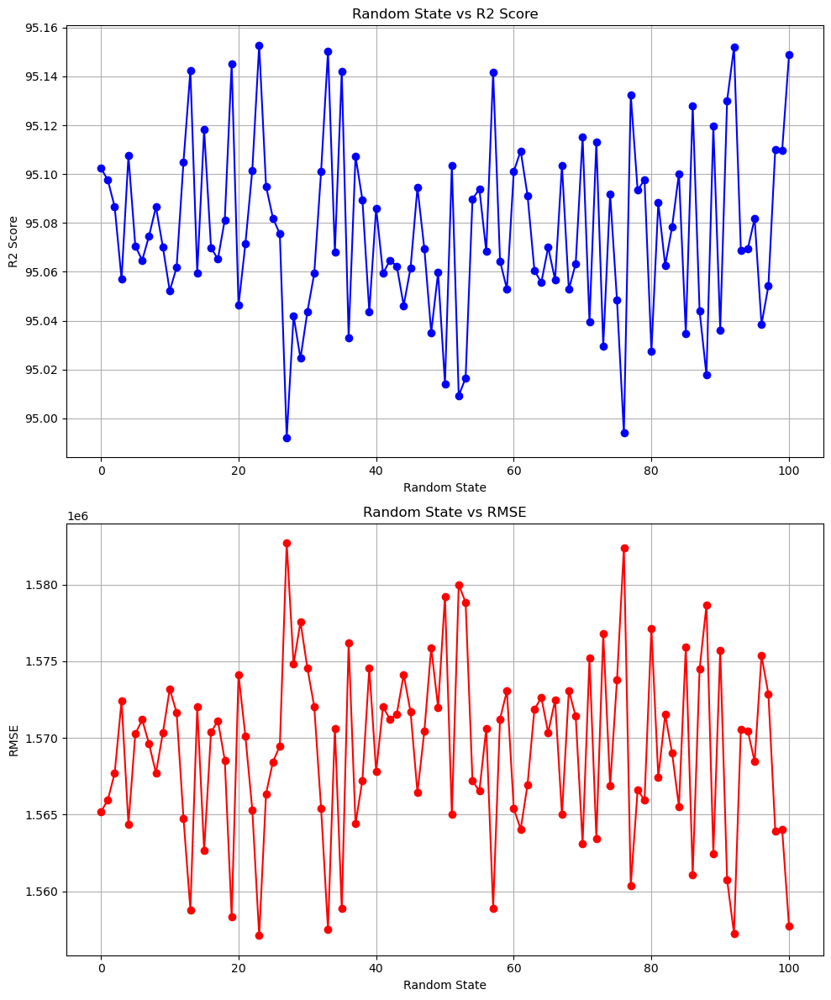

In [430]:
random_states = range(101)
r2_scores = []
rmses = []

for random_state in random_states:
    gas_model = RandomForestRegressor(max_depth=20, n_estimators=400, random_state=random_state)
    gas_model.fit(X_train, y_train)
    y_pred = gas_model.predict(X_test)
    r_2 = r2_score(y_test, y_pred) * 100
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2_scores.append(r_2)
    rmses.append(rmse)

fig, axs = plt.subplots(2, 1, figsize=(10, 12))

titles = ['Random State vs R2 Score', 'Random State vs RMSE']
y_labels = ['R2 Score', 'RMSE']
data = [r2_scores, rmses]
colors = ['b', 'r']

for i in range(2):
    axs[i].plot(random_states, data[i], marker='o', linestyle='-', color=colors[i])
    axs[i].set_title(titles[i])
    axs[i].set_xlabel('Random State')
    axs[i].set_ylabel(y_labels[i])
    axs[i].grid(True)

plt.tight_layout();

In [432]:
max_r2 = r2_scores.index(max(r2_scores))
max_r2_state= random_states[max_r2]

min_rmse = rmses.index(min(rmses))
min_rmse_state = random_states[min_rmse]

print(max_r2_state)
print(min_rmse_state)

23
23


## Final Gas Model

In [433]:
final_gas_model = RandomForestRegressor(max_depth=20, n_estimators=400,random_state=23)
final_gas_model.fit(X_train, y_train)
y_pred = final_gas_model.predict(X_test)
r_2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
result_dict = {'Actual gas Production': y_test, 'Predicted gas Production': y_pred}
comparison_df = pd.DataFrame(result_dict)
print(r_2)
print(rmse)

0.9515282358512789
1557106.4255789914


In [434]:
comparison_df

,Actual gas Production,Predicted gas Production
468,4.637945e+06,6.118486e+04
3821,0.000000e+00,0.000000e+00
3218,8.039413e+05,1.391257e+06
1315,2.696991e+07,2.633534e+07
1883,2.338791e+07,2.261619e+07
...,...,...
6098,1.905770e+06,2.080524e+06
4942,9.313473e+06,9.184152e+06
6047,2.192565e+06,2.289792e+06
4274,1.407792e+07,1.464446e+07


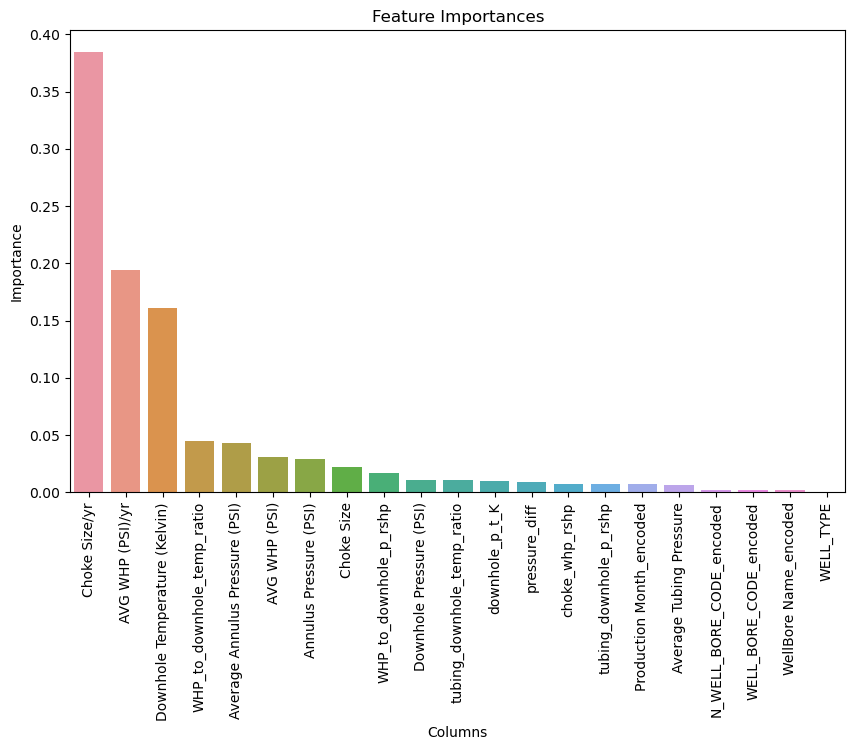

In [435]:
feature_importance = final_gas_model.feature_importances_
feature_columns = X.columns
imp_data =  pd.DataFrame({'Columns': feature_columns, 'Importance': feature_importance})
imp_data = imp_data.sort_values(by='Importance', ascending=False)


plt.figure(figsize=(10, 6))
sns.barplot(x='Columns', y='Importance', data=imp_data)
plt.title('Feature Importances')
plt.xticks(rotation=90);

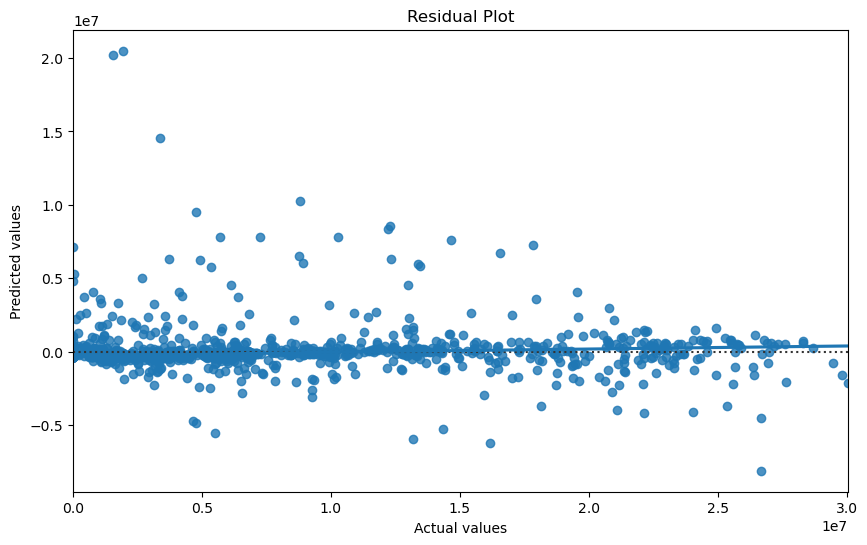

In [436]:
plt.figure(figsize=(10, 6))
sns.residplot(x=y_test, y=y_pred, lowess=True)
plt.xlabel('Actual values')
plt.ylabel('Predicted values')
plt.title('Residual Plot');

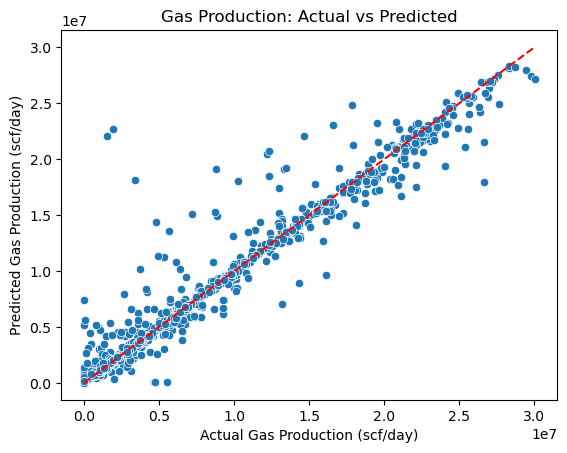

In [437]:
sns.scatterplot(data =comparison_df, x='Actual gas Production', y='Predicted gas Production')
plt.plot([comparison_df['Actual gas Production'].min(), comparison_df['Actual gas Production'].max()],
         [comparison_df['Actual gas Production'].min(), comparison_df['Actual gas Production'].max()], 'r--')
plt.title('Gas Production: Actual vs Predicted')
plt.xlabel('Actual Gas Production (scf/day)')
plt.ylabel('Predicted Gas Production (scf/day)');

### Predictions

In [439]:
gas_predict = pd.read_csv('test_final.csv')

In [440]:
gas_predict.head()

,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,WELL_BORE_CODE_encoded,N_WELL_BORE_CODE_encoded,WellBore Name_encoded,Production Month_encoded,...,downhole_p_t_K,tubing_downhole_p_rshp,WHP_to_downhole_p_rshp,tubing_downhole_temp_ratio,WHP_to_downhole_temp_ratio,pressure_diff,choke_whp_rshp,AVG WHP (PSI)/yr,Choke Size/yr,WELL_TYPE
0,3061.253047,380.665745,2659.809580,0.0,401.443468,0.491632,0,0,0,5,...,8.041840,8.142350e+06,1.228920e+06,6.987258,1.054583,-2659.809579,197.362339,595.252735,15.174564,1
1,3247.951135,376.759980,2547.453670,0.0,700.497465,21.775180,0,0,0,5,...,8.620743,8.274005e+06,2.275182e+06,6.761476,1.859267,-2547.453670,15253.458390,595.252735,15.174564,1
2,3333.012485,375.985300,2533.912265,0.0,799.100220,27.638780,0,0,0,5,...,8.864741,8.445561e+06,2.663411e+06,6.739392,2.125350,-2533.912265,22086.155179,595.252735,15.174564,1
3,3404.022465,375.419010,2481.804485,0.0,922.217980,36.178940,0,0,0,5,...,9.067262,8.448118e+06,3.139251e+06,6.610759,2.456503,-2481.804485,33364.868965,595.252735,15.174564,1
4,3465.473030,375.004710,2408.310945,0.0,1057.162085,45.424140,0,0,0,5,...,9.241145,8.345937e+06,3.663567e+06,6.422082,2.819063,-2408.310945,48020.678552,595.252735,15.174564,1


In [441]:
scaled_gas_pred = scaler_gas.transform(gas_predict)

In [442]:
final_gas_pred = final_gas_model.predict(scaled_gas_pred)

In [443]:
final_gas_pred

array([7002167.38342751, 6784504.34719   , 5909161.5456975 , ...,
         29153.65175935,   29153.65175935,   29153.65175935])

In [444]:
#joblib.dump(final_gas_model, 'final_gas_model.pkl')

### Predictions dataframe updated

In [445]:
predictions['Gas Volume (scf/day)'] = final_gas_pred

In [446]:
predictions

,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
0,7232.699283,7.002167e+06,NaN
1,5994.161801,6.784504e+06,NaN
2,5435.082542,5.909162e+06,NaN
3,933.654577,1.151160e+06,NaN
4,832.916139,1.114134e+06,NaN
...,...,...,...
2070,50.301879,2.915365e+04,NaN
2071,50.301879,2.915365e+04,NaN
2072,50.301879,2.915365e+04,NaN
2073,50.301879,2.915365e+04,NaN


## Water Production

In [447]:
water_train = pd.read_csv('train_final.csv')

In [448]:
X = water_train.drop(['Oil Production (stb/day)','Gas Volume (scf/day)','Water Production (stb/day)'],axis=1)

In [449]:
y = water_train['Water Production (stb/day)']

### data splitting and scaling

In [450]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
scaler_water = StandardScaler()
X_train = scaler_water.fit_transform(X_train)
X_test = scaler_water.transform(X_test)

### Modelling

In [451]:
models = {
    'Linear Regression': LinearRegression(),
    'SVR': SVR(),
    'Random Forest': RandomForestRegressor(),
    'Decision Tree': DecisionTreeRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(),
    'XGBoost': XGBRegressor()
}

results = {'Model': [], 'R2_SCORE': [], 'RMSE': []}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    r_2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    results['Model'].append(name)
    results['R2_SCORE'].append(r_2)
    results['RMSE'].append(rmse)

results_df = pd.DataFrame(results)

In [452]:
results_df

,Model,R2_SCORE,RMSE
0,Linear Regression,0.271330,9844.790892
1,SVR,-0.131153,12265.963676
2,Random Forest,0.964681,2167.444790
3,Decision Tree,0.946480,2668.083425
4,Gradient Boosting,0.937406,2885.398242
5,XGBoost,0.959493,2321.160513


In [472]:
model = RandomForestRegressor()
param_grid = {'n_estimators': [100,200,300,400], 'max_depth': [None, 10, 20,30]}
grid_search = GridSearchCV(model, param_grid=param_grid, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [None, 10, 20, 30],
                         'n_estimators': [100, 200, 300, 400]},
             scoring='r2')

In [473]:
y_pred = grid_search.predict(X_test)
r_2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(r_2)
print(rmse)
print(grid_search.best_estimator_)

0.9650868219779632
2154.9427471229797
RandomForestRegressor(max_depth=20, n_estimators=300)


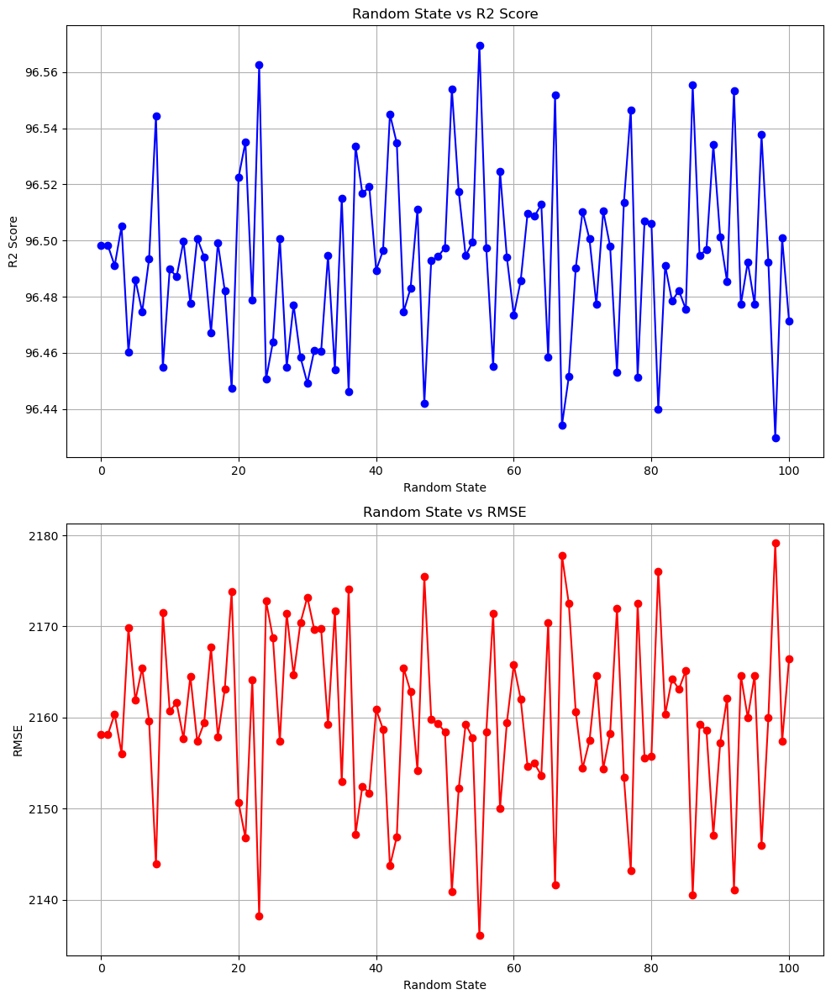

In [474]:
random_states = range(101)
r2_scores = []
rmses = []

for random_state in random_states:
    water_model = RandomForestRegressor(max_depth=20,n_estimators=300, random_state=random_state)
    water_model.fit(X_train, y_train)
    y_pred = water_model.predict(X_test)
    r_2 = r2_score(y_test, y_pred) * 100
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2_scores.append(r_2)
    rmses.append(rmse)

fig, axs = plt.subplots(2, 1, figsize=(10, 12))

titles = ['Random State vs R2 Score', 'Random State vs RMSE']
y_labels = ['R2 Score', 'RMSE']
data = [r2_scores, rmses]
colors = ['b', 'r']

for i in range(2):
    axs[i].plot(random_states, data[i], marker='o', linestyle='-', color=colors[i])
    axs[i].set_title(titles[i])
    axs[i].set_xlabel('Random State')
    axs[i].set_ylabel(y_labels[i])
    axs[i].grid(True)

plt.tight_layout();

In [475]:
max_r2 = r2_scores.index(max(r2_scores))
max_r2_state= random_states[max_r2]

min_rmse = rmses.index(min(rmses))
min_rmse_state = random_states[min_rmse]

print(max_r2_state)
print(min_rmse_state)

55
55


### Final Water Model

In [476]:
final_water_model = RandomForestRegressor(max_depth=20,n_estimators=300,random_state=55)
final_water_model.fit(X_train, y_train)
y_pred = final_water_model.predict(X_test)
r_2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
result_dict = {'Actual water Production': y_test, 'Predicted water Production': y_pred}
comparison_df = pd.DataFrame(result_dict)
print(r_2)
print(rmse)

0.9656960825462163
2136.057327514165


In [477]:
comparison_df

,Actual water Production,Predicted water Production
468,0.0000,0.000000
3821,0.0000,0.000000
3218,18386.4877,27493.997201
1315,80.1975,143.372620
1883,8809.8998,9265.895447
...,...,...
6098,20901.7329,21303.588201
4942,25369.7715,24690.368711
6047,18602.1718,21089.523838
4274,1688.4876,1804.907048


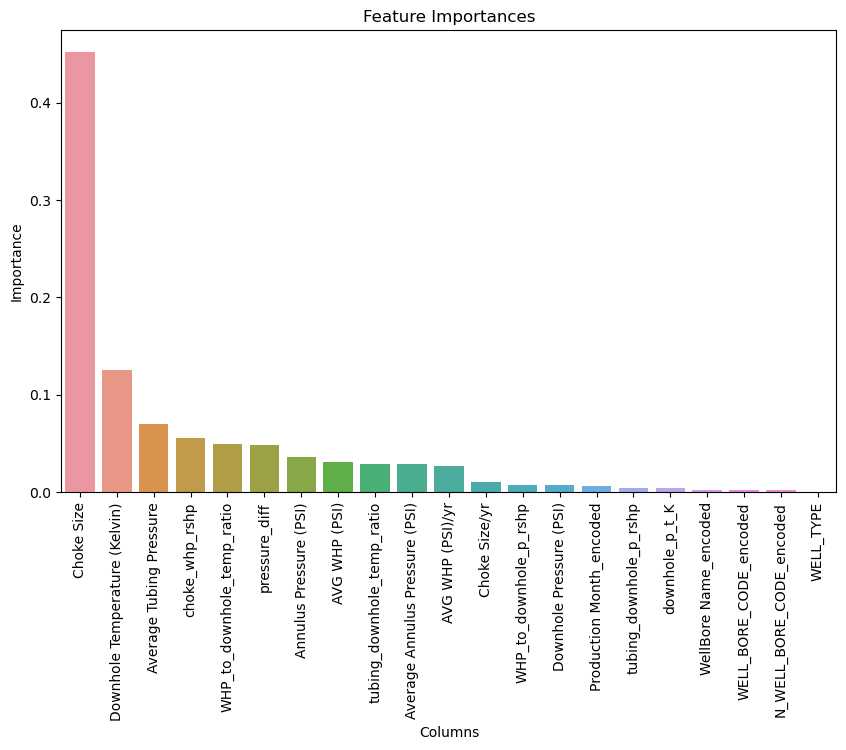

In [478]:
feature_importance = final_water_model.feature_importances_
feature_columns = X.columns
imp_data =  pd.DataFrame({'Columns': feature_columns, 'Importance': feature_importance})
imp_data = imp_data.sort_values(by='Importance', ascending=False)


plt.figure(figsize=(10, 6))
sns.barplot(x='Columns', y='Importance', data=imp_data)
plt.title('Feature Importances')
plt.xticks(rotation=90);

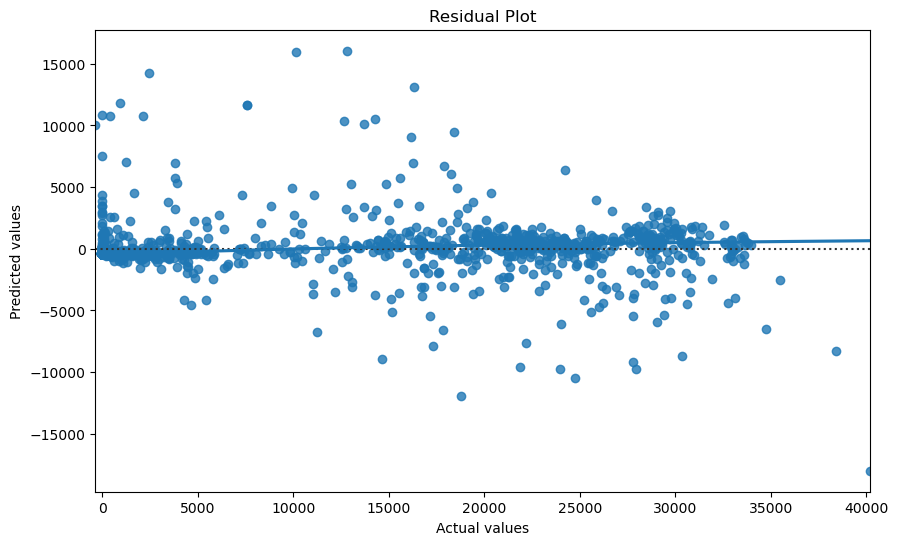

In [479]:
plt.figure(figsize=(10, 6))
sns.residplot(x=y_test, y=y_pred, lowess=True)
plt.xlabel('Actual values')
plt.ylabel('Predicted values')
plt.title('Residual Plot');

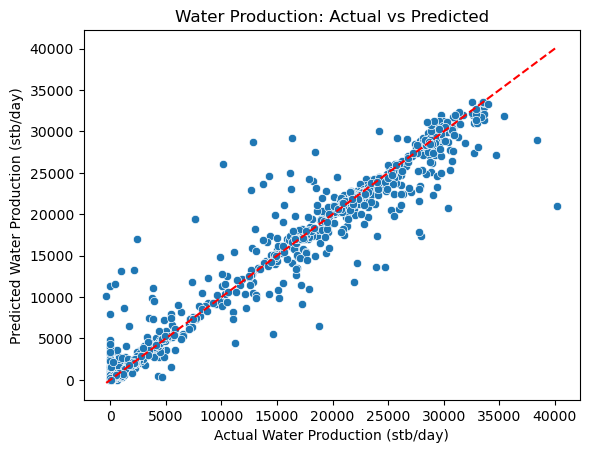

In [480]:
sns.scatterplot(data =comparison_df, x='Actual water Production', y='Predicted water Production')
plt.plot([comparison_df['Actual water Production'].min(), comparison_df['Actual water Production'].max()],
         [comparison_df['Actual water Production'].min(), comparison_df['Actual water Production'].max()], 'r--')
plt.title('Water Production: Actual vs Predicted')
plt.xlabel('Actual Water Production (stb/day)')
plt.ylabel('Predicted Water Production (stb/day)');

### Predictions

In [482]:
water_predict = pd.read_csv('test_final.csv')

In [483]:
water_predict.head()

,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size,WELL_BORE_CODE_encoded,N_WELL_BORE_CODE_encoded,WellBore Name_encoded,Production Month_encoded,...,downhole_p_t_K,tubing_downhole_p_rshp,WHP_to_downhole_p_rshp,tubing_downhole_temp_ratio,WHP_to_downhole_temp_ratio,pressure_diff,choke_whp_rshp,AVG WHP (PSI)/yr,Choke Size/yr,WELL_TYPE
0,3061.253047,380.665745,2659.809580,0.0,401.443468,0.491632,0,0,0,5,...,8.041840,8.142350e+06,1.228920e+06,6.987258,1.054583,-2659.809579,197.362339,595.252735,15.174564,1
1,3247.951135,376.759980,2547.453670,0.0,700.497465,21.775180,0,0,0,5,...,8.620743,8.274005e+06,2.275182e+06,6.761476,1.859267,-2547.453670,15253.458390,595.252735,15.174564,1
2,3333.012485,375.985300,2533.912265,0.0,799.100220,27.638780,0,0,0,5,...,8.864741,8.445561e+06,2.663411e+06,6.739392,2.125350,-2533.912265,22086.155179,595.252735,15.174564,1
3,3404.022465,375.419010,2481.804485,0.0,922.217980,36.178940,0,0,0,5,...,9.067262,8.448118e+06,3.139251e+06,6.610759,2.456503,-2481.804485,33364.868965,595.252735,15.174564,1
4,3465.473030,375.004710,2408.310945,0.0,1057.162085,45.424140,0,0,0,5,...,9.241145,8.345937e+06,3.663567e+06,6.422082,2.819063,-2408.310945,48020.678552,595.252735,15.174564,1


In [484]:
scaled_water_pred = scaler_water.transform(water_predict)

In [485]:
final_water_pred = final_water_model.predict(scaled_water_pred)

In [486]:
final_water_pred

array([2709.35984167, 4358.095481  , 3713.50281344, ..., 1391.53649033,
       1391.53649033, 1362.91363567])

### update to the predictions dataframe

In [487]:
predictions['Water Production (stb/day)'] = final_water_pred

In [488]:
predictions

,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
0,7232.699283,7.002167e+06,2709.359842
1,5994.161801,6.784504e+06,4358.095481
2,5435.082542,5.909162e+06,3713.502813
3,933.654577,1.151160e+06,2130.196686
4,832.916139,1.114134e+06,382.462346
...,...,...,...
2070,50.301879,2.915365e+04,1813.426918
2071,50.301879,2.915365e+04,1818.255751
2072,50.301879,2.915365e+04,1391.536490
2073,50.301879,2.915365e+04,1391.536490


In [489]:
predictions.isnull().sum()

Oil Production (stb/day)      0
Gas Volume (scf/day)          0
Water Production (stb/day)    0
dtype: int64

In [490]:
#joblib.dump(final_water_model, 'final_water_model.pkl')

### Saving predictions in a csv format

In [491]:
predictions.to_csv('spe_oau_pred.csv', index=False)

# Post Analysis

### Adding the predicted productions to the original validation / test_df

In [492]:
test_df['Oil Production (stb/day)'] = predictions['Oil Production (stb/day)']
test_df['Gas Volume (scf/day)'] = predictions['Gas Volume (scf/day)']
test_df['Water Production (stb/day)'] = predictions['Water Production (stb/day)']

In [493]:
test_df.columns

Index(['WELL_BORE_CODE', 'N_WELL_BORE_CODE', 'WellBore Name', 'WELL_TYPE',
       'Downhole Pressure (PSI)', 'Downhole Temperature (Kelvin)',
       'Average Tubing Pressure', 'Annulus Pressure (PSI)', 'AVG WHP (PSI)',
       'Choke Size', 'Production Year', 'Production Month',
       'WELL_BORE_CODE_encoded', 'N_WELL_BORE_CODE_encoded',
       'WellBore Name_encoded', 'Production Month_encoded',
       'Average Annulus Pressure (PSI)', 'downhole_p_t_K',
       'tubing_downhole_p_rshp', 'WHP_to_downhole_p_rshp',
       'tubing_downhole_temp_ratio', 'WHP_to_downhole_temp_ratio',
       'pressure_diff', 'choke_whp_rshp', 'AVG WHP (PSI)/yr', 'Choke Size/yr',
       'Oil Production (stb/day)', 'Gas Volume (scf/day)',
       'Water Production (stb/day)'],
      dtype='object')

In [494]:
val_df = pd.read_csv('dseats_2024_validation_dataset.csv')
val_df = val_df.drop(['Oil Production (stb/day)','Gas Volume (scf/day)','Water Production (stb/day)'], axis=1)

In [495]:
val_df[~val_df.isnull().any(axis=1)]

,PRODUCTION DATE,Field Name,WELL_BORE_CODE,N_WELL_BORE_CODE,WellBore Name,FLOW_KIND,WELL_TYPE,Downhole Pressure (PSI),Downhole Temperature (Kelvin),Average Tubing Pressure,Annulus Pressure (PSI),AVG WHP (PSI),Choke Size
0,2015-07-01 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3061.253047,380.665745,2659.809580,0.0,401.443468,0.491632
1,2015-07-02 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3247.951135,376.759980,2547.453670,0.0,700.497465,21.775180
2,2015-07-03 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3333.012485,375.985300,2533.912265,0.0,799.100220,27.638780
3,2015-07-04 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3404.022465,375.419010,2481.804485,0.0,922.217980,36.178940
4,2015-07-05 00:00:00,DSEAT,DSEAT-001-F-1 C,105.0,001-F-1 C,production,OP,3465.473030,375.004710,2408.310945,0.0,1057.162085,45.424140
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2070,2016-09-12 00:00:00,DSEAT,DSEAT-001-F-15 D,109.0,001-F-15 D,production,OP,5015.648165,363.184330,5015.648165,0.0,0.000000,13.876190
2071,2016-09-13 00:00:00,DSEAT,DSEAT-001-F-15 D,109.0,001-F-15 D,production,OP,5015.648165,363.184330,5015.648165,0.0,0.000000,13.974080
2072,2016-09-14 00:00:00,DSEAT,DSEAT-001-F-15 D,109.0,001-F-15 D,production,OP,5015.648165,363.184330,5015.648165,0.0,0.000000,14.063160
2073,2016-09-15 00:00:00,DSEAT,DSEAT-001-F-15 D,109.0,001-F-15 D,production,OP,5015.648165,363.184330,5015.648165,0.0,0.000000,14.174450


### Inserting the production dates to the predictions dataframe

In [496]:
predictions.insert(0, 'PRODUCTION DATE', val_df['PRODUCTION DATE'])

In [497]:
predictions.head()

,PRODUCTION DATE,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
0,2015-07-01 00:00:00,7232.699283,7.002167e+06,2709.359842
1,2015-07-02 00:00:00,5994.161801,6.784504e+06,4358.095481
2,2015-07-03 00:00:00,5435.082542,5.909162e+06,3713.502813
3,2015-07-04 00:00:00,933.654577,1.151160e+06,2130.196686
4,2015-07-05 00:00:00,832.916139,1.114134e+06,382.462346


In [498]:
predictions.isnull().sum()

PRODUCTION DATE               0
Oil Production (stb/day)      0
Gas Volume (scf/day)          0
Water Production (stb/day)    0
dtype: int64

## Finale Predictions Saving

In [499]:
predictions.to_csv('Enoch_Soyinka_2024_DSEATS_Datathon_5673020.csv', index=False)

In [500]:
train_df.columns

Index(['WELL_BORE_CODE', 'N_WELL_BORE_CODE', 'WellBore Name', 'WELL_TYPE',
       'Downhole Pressure (PSI)', 'Downhole Temperature (Kelvin)',
       'Average Tubing Pressure', 'Annulus Pressure (PSI)', 'AVG WHP (PSI)',
       'Choke Size', 'Oil Production (stb/day)', 'Gas Volume (scf/day)',
       'Water Production (stb/day)', 'Production Year', 'Production Month',
       'WELL_BORE_CODE_encoded', 'N_WELL_BORE_CODE_encoded',
       'WellBore Name_encoded', 'Production Month_encoded',
       'Average Annulus Pressure (PSI)', 'downhole_p_t_K',
       'tubing_downhole_p_rshp', 'WHP_to_downhole_p_rshp',
       'tubing_downhole_temp_ratio', 'WHP_to_downhole_temp_ratio',
       'pressure_diff', 'choke_whp_rshp', 'AVG WHP (PSI)/yr', 'Choke Size/yr'],
      dtype='object')

# Estimating Productions Over time(in my case Years) using sum and average

## Estimation of the Total and Average daily Oil production (Oil Production (stb/day)) for each Production Year for both the Historical and Predicted Oil Production

In [501]:
total_oil_prod_hist_yrr = train_df.groupby('Production Year')['Oil Production (stb/day)'].sum().reset_index()
total_oil_prod_pred_yr = test_df.groupby('Production Year')['Oil Production (stb/day)'].sum().reset_index()

avg_oil_prod_hist_yrr = train_df.groupby('Production Year')['Oil Production (stb/day)'].mean().reset_index()
avg_oil_prod_pred_yr = test_df.groupby('Production Year')['Oil Production (stb/day)'].mean().reset_index()

#### sum

In [502]:
print(total_oil_prod_hist_yrr,total_oil_prod_pred_yr)

   Production Year  Oil Production (stb/day)
0             2008              1.109792e+07
1             2009              1.688483e+07
2             2010              1.062949e+07
3             2011              5.333702e+06
4             2012              3.611758e+06
5             2013              3.509899e+06
6             2014              4.674146e+06
7             2015              3.084576e+06    Production Year  Oil Production (stb/day)
0             2015              3.658692e+06
1             2016              3.208767e+06


#### Average

In [503]:
print(avg_oil_prod_hist_yrr,avg_oil_prod_pred_yr)

   Production Year  Oil Production (stb/day)
0             2008              17232.794555
1             2009              23321.582778
2             2010              14845.652290
3             2011               7937.057092
4             2012               5406.823077
5             2013               3961.511076
6             2014               2733.418779
7             2015               3408.371057    Production Year  Oil Production (stb/day)
0             2015               3976.839153
1             2016               2778.153407


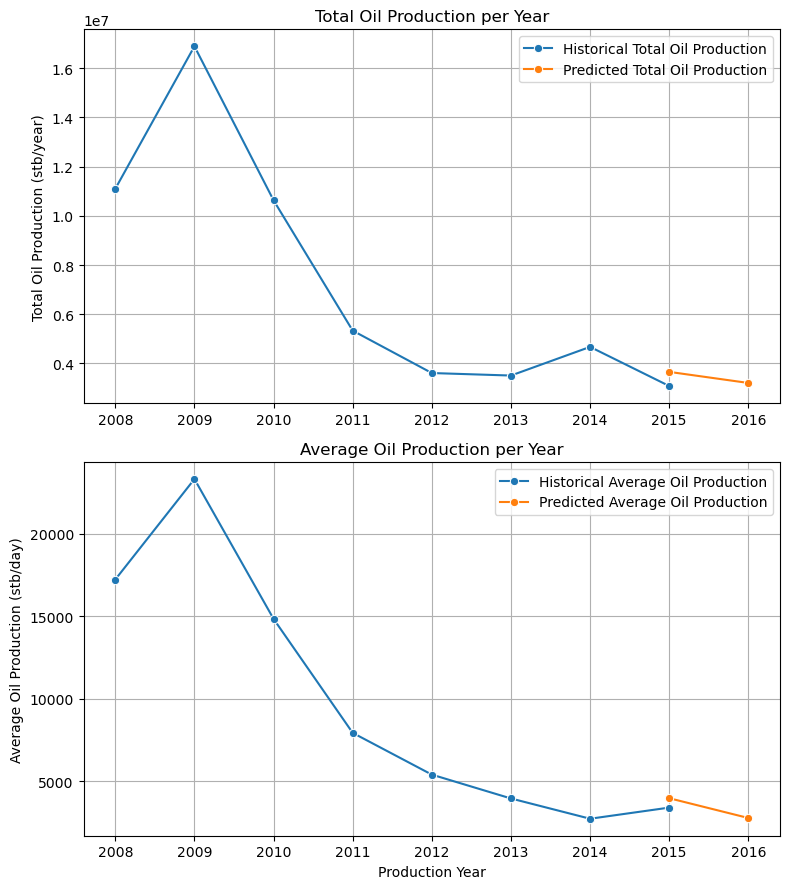

In [504]:
plt.figure(figsize=(8, 9))

plt.subplot(2, 1, 1)
sns.lineplot(data=total_oil_prod_hist_yrr, x='Production Year', y='Oil Production (stb/day)', label='Historical Total Oil Production', marker='o')
sns.lineplot(data=total_oil_prod_pred_yr, x='Production Year', y='Oil Production (stb/day)', label='Predicted Total Oil Production', marker='o')
plt.xlabel('')
plt.ylabel('Total Oil Production (stb/year)')
plt.title('Total Oil Production per Year')
plt.legend()
plt.grid(True)

plt.subplot(2, 1, 2)
sns.lineplot(data=avg_oil_prod_hist_yrr, x='Production Year', y='Oil Production (stb/day)', label='Historical Average Oil Production', marker='o')
sns.lineplot(data=avg_oil_prod_pred_yr, x='Production Year', y='Oil Production (stb/day)', label='Predicted Average Oil Production', marker='o')
plt.xlabel('Production Year')
plt.ylabel('Average Oil Production (stb/day)')
plt.title('Average Oil Production per Year')
plt.legend()
plt.grid(True)

plt.tight_layout();

### Bar chart Representation for Total Oil Production

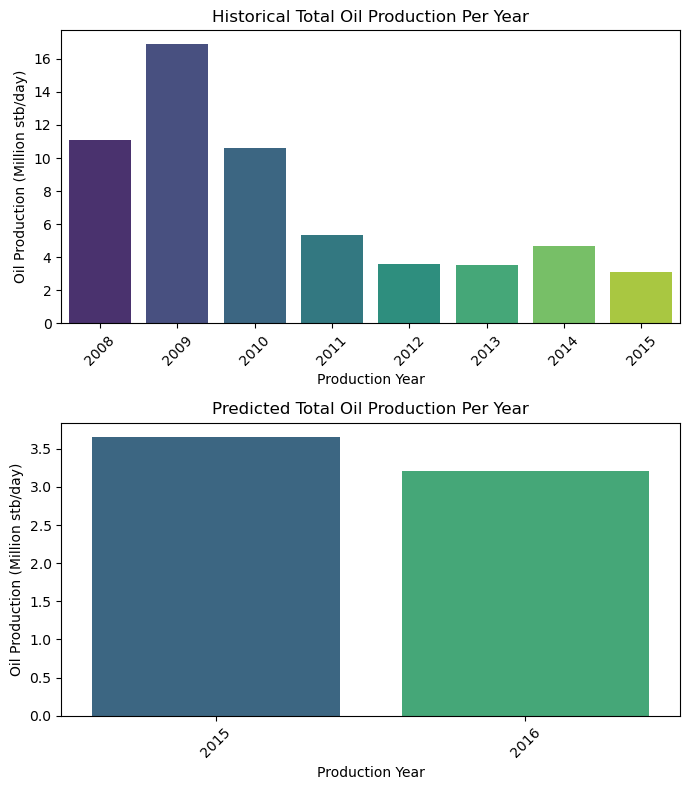

In [552]:
plt.figure(figsize=(7, 8))

plt.subplot(2, 1, 1)
sns.barplot(x=total_oil_prod_hist_yrr['Production Year'], y=total_oil_prod_hist_yrr['Oil Production (stb/day)'] / 1e6, palette='viridis')
plt.xlabel('Production Year')
plt.ylabel('Oil Production (Million stb/day)')
plt.title('Historical Total Oil Production Per Year')
plt.xticks(rotation=45)

plt.subplot(2, 1, 2)
sns.barplot(x=total_oil_prod_pred_yr['Production Year'], y=total_oil_prod_pred_yr['Oil Production (stb/day)'] / 1e6, palette='viridis')
plt.xlabel('Production Year')
plt.ylabel('Oil Production (Million stb/day)')
plt.title('Predicted Total Oil Production Per Year')
plt.xticks(rotation=45)

plt.tight_layout();

### Bar chart Representation for Average Oil Production

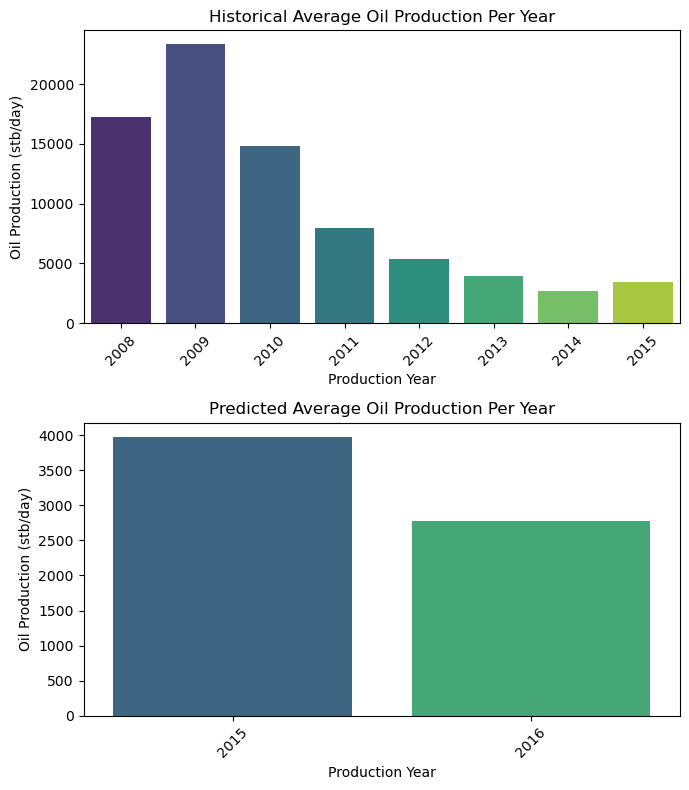

In [553]:
plt.figure(figsize=(7, 8))

plt.subplot(2, 1, 1)
sns.barplot(x=avg_oil_prod_hist_yrr['Production Year'], y=avg_oil_prod_hist_yrr['Oil Production (stb/day)'], palette='viridis')
plt.xlabel('Production Year')
plt.ylabel('Oil Production (stb/day)')
plt.title('Historical Average Oil Production Per Year')
plt.xticks(rotation=45)

plt.subplot(2, 1, 2)
sns.barplot(x=avg_oil_prod_pred_yr['Production Year'], y=avg_oil_prod_pred_yr['Oil Production (stb/day)'], palette='viridis')
plt.xlabel('Production Year')
plt.ylabel('Oil Production (stb/day)')
plt.title('Predicted Average Oil Production Per Year')
plt.xticks(rotation=45)

plt.tight_layout();

## Estimation of the Total and Average daily Water Production (Water Production (stb/day)) for each Production Year for both the Historical and Predicted Water Production

In [505]:
total_water_prod_hist_yrr = train_df.groupby('Production Year')['Water Production (stb/day)'].sum().reset_index()
total_water_prod_pred_yr = test_df.groupby('Production Year')['Water Production (stb/day)'].sum().reset_index()

avg_water_prod_hist_yrr = train_df.groupby('Production Year')['Water Production (stb/day)'].mean().reset_index()
avg_water_prod_pred_yr = test_df.groupby('Production Year')['Water Production (stb/day)'].mean().reset_index()

#### Total

In [542]:
print(total_water_prod_hist_yrr,total_water_prod_pred_yr)

   Production Year  Water Production (stb/day)
0             2008                1.478712e+05
1             2009                1.459933e+06
2             2010                1.187297e+07
3             2011                1.377913e+07
4             2012                1.326939e+07
5             2013                1.620534e+07
6             2014                1.708409e+07
7             2015                5.684150e+06    Production Year  Water Production (stb/day)
0             2015                6.511100e+06
1             2016                7.322650e+06


#### Average

In [507]:
print(avg_water_prod_hist_yrr,avg_water_prod_pred_yr )

   Production Year  Water Production (stb/day)
0             2008                  229.613715
1             2009                 2016.481388
2             2010                16582.361964
3             2011                20504.653811
4             2012                19864.362654
5             2013                18290.452392
6             2014                 9990.693618
7             2015                 6280.828485    Production Year  Water Production (stb/day)
0             2015                 7077.282092
1             2016                 6339.956315


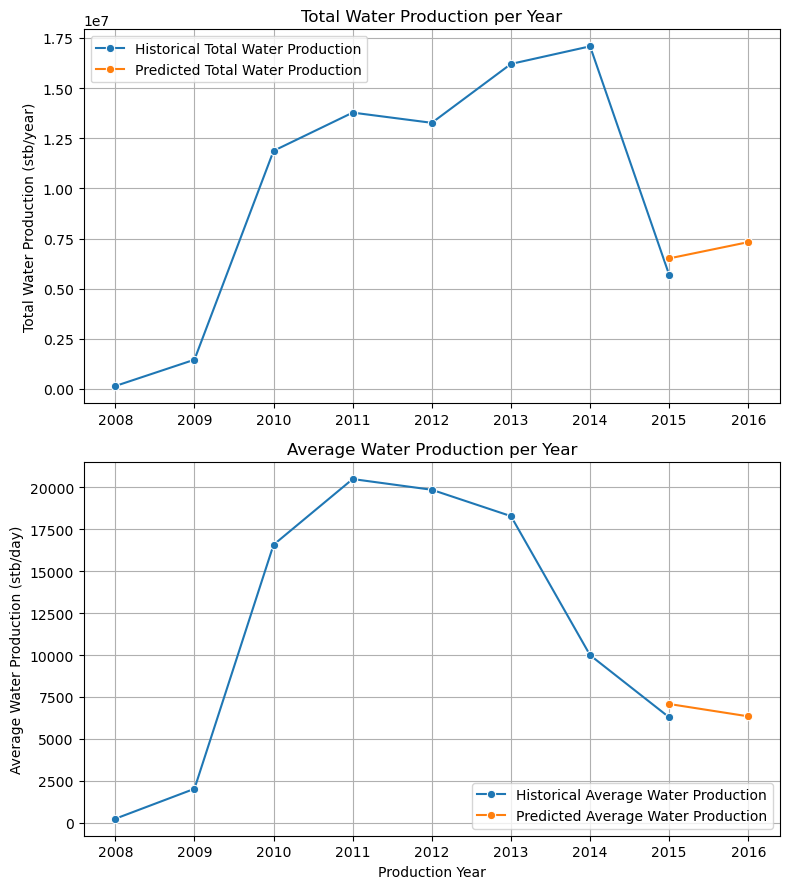

In [508]:
plt.figure(figsize=(8, 9))

plt.subplot(2, 1, 1)
sns.lineplot(data=total_water_prod_hist_yrr, x='Production Year', y='Water Production (stb/day)', label='Historical Total Water Production', marker='o')
sns.lineplot(data=total_water_prod_pred_yr, x='Production Year', y='Water Production (stb/day)', label='Predicted Total Water Production', marker='o')
plt.xlabel('')
plt.ylabel('Total Water Production (stb/year)')
plt.title('Total Water Production per Year')
plt.legend()
plt.grid(True)

plt.subplot(2, 1, 2)
sns.lineplot(data=avg_water_prod_hist_yrr, x='Production Year', y='Water Production (stb/day)', label='Historical Average Water Production', marker='o')
sns.lineplot(data=avg_water_prod_pred_yr, x='Production Year', y='Water Production (stb/day)', label='Predicted Average Water Production', marker='o')
plt.xlabel('Production Year')
plt.ylabel('Average Water Production (stb/day)')
plt.title('Average Water Production per Year')
plt.legend()
plt.grid(True)

plt.tight_layout();

### Bar chart Representation for Total Water Production

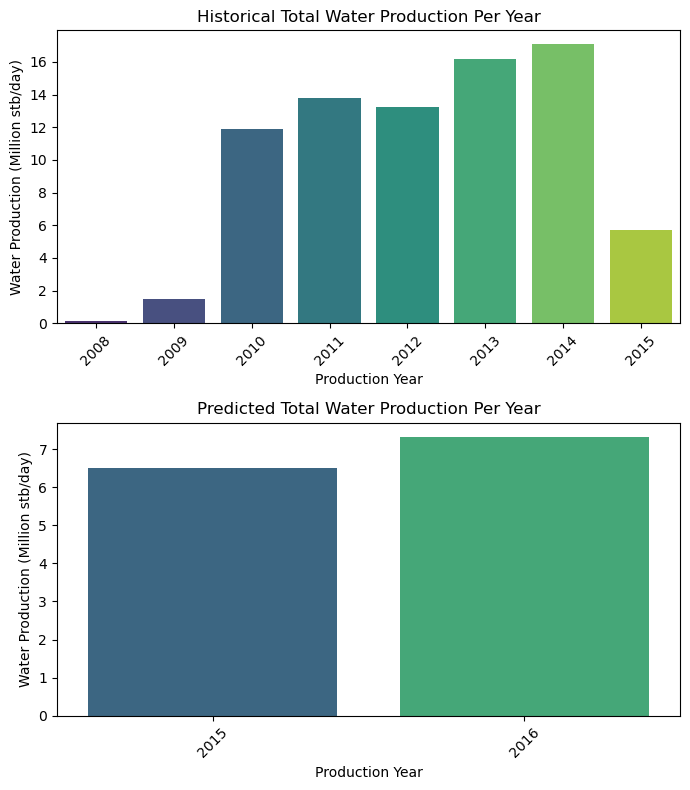

In [549]:
plt.figure(figsize=(7, 8))

plt.subplot(2, 1, 1)
sns.barplot(x=total_water_prod_hist_yrr['Production Year'], y=total_water_prod_hist_yrr['Water Production (stb/day)'] / 1e6, palette='viridis')
plt.xlabel('Production Year')
plt.ylabel('Water Production (Million stb/day)')
plt.title('Historical Total Water Production Per Year')
plt.xticks(rotation=45)

plt.subplot(2, 1, 2)
sns.barplot(x=total_water_prod_pred_yr['Production Year'], y=total_water_prod_pred_yr['Water Production (stb/day)'] / 1e6, palette='viridis')
plt.xlabel('Production Year')
plt.ylabel('Water Production (Million stb/day)')
plt.title('Predicted Total Water Production Per Year')
plt.xticks(rotation=45)

plt.tight_layout();

### Bar chart Representation for Average Water Production

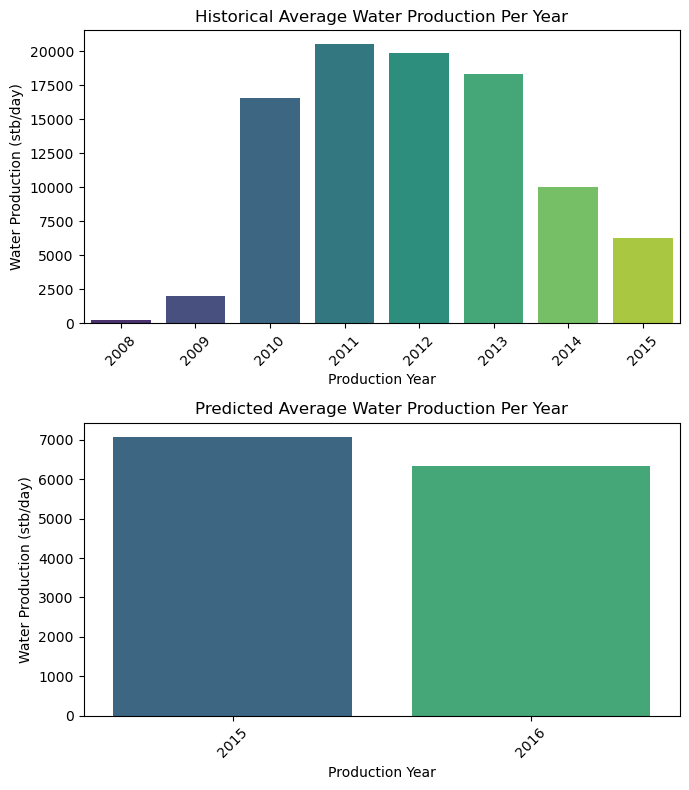

In [551]:
plt.figure(figsize=(7, 8))

plt.subplot(2, 1, 1)
sns.barplot(x=avg_water_prod_hist_yrr['Production Year'], y=avg_water_prod_hist_yrr['Water Production (stb/day)'], palette='viridis')
plt.xlabel('Production Year')
plt.ylabel('Water Production (stb/day)')
plt.title('Historical Average Water Production Per Year')
plt.xticks(rotation=45)

plt.subplot(2, 1, 2)
sns.barplot(x=avg_water_prod_pred_yr['Production Year'], y=avg_water_prod_pred_yr['Water Production (stb/day)'], palette='viridis')
plt.xlabel('Production Year')
plt.ylabel('Water Production (stb/day)')
plt.title('Predicted Average Water Production Per Year')
plt.xticks(rotation=45)

plt.tight_layout();

## Estimation of the Total and Average Gas production (Gas Volume (scf/day)) for each Production Year for both the Historical and Predicted Gas Production

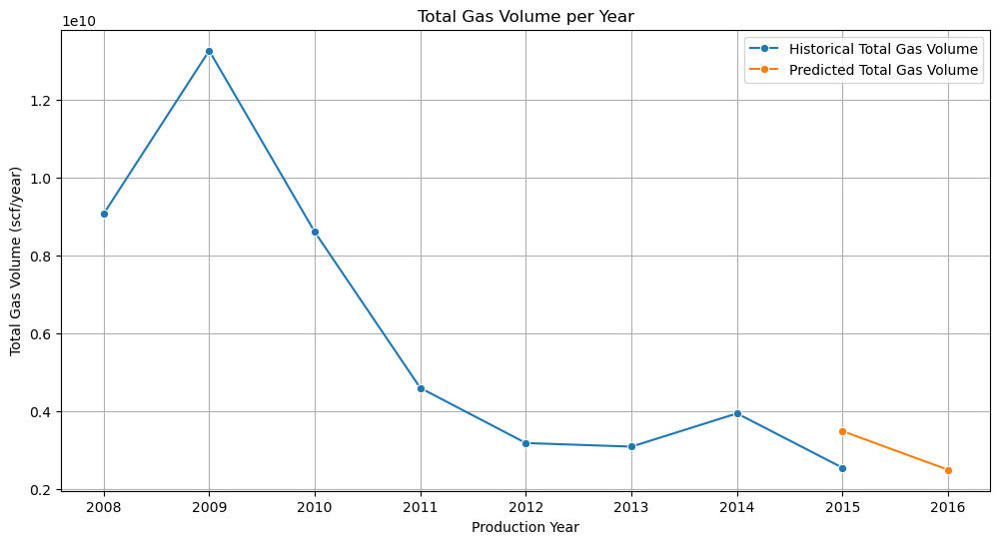

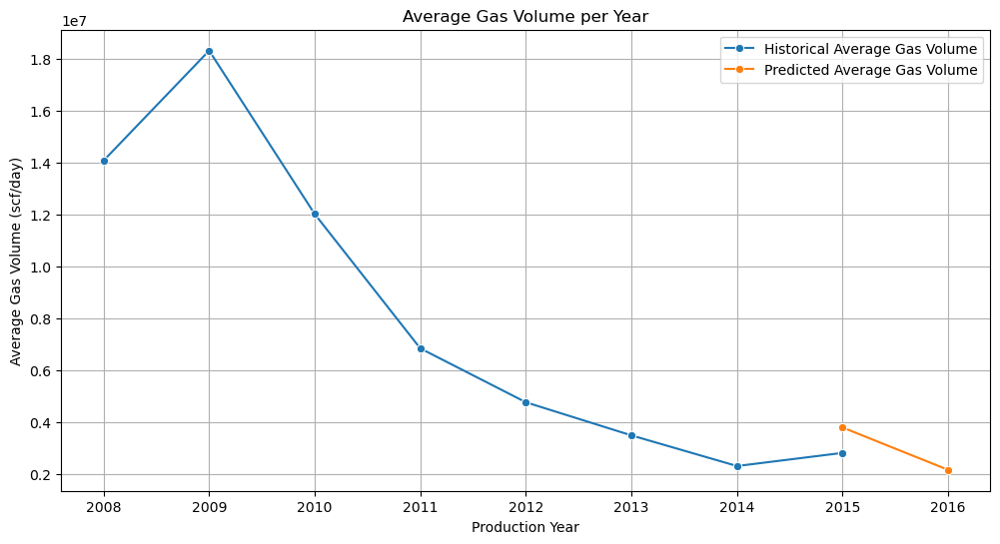

In [509]:
total_gas_prod_hist_yrr = train_df.groupby('Production Year')['Gas Volume (scf/day)'].sum().reset_index()
total_gas_prod_pred_yr = test_df.groupby('Production Year')['Gas Volume (scf/day)'].sum().reset_index()

avg_gas_prod_hist_yrr = train_df.groupby('Production Year')['Gas Volume (scf/day)'].mean().reset_index()
avg_gas_prod_pred_yr = test_df.groupby('Production Year')['Gas Volume (scf/day)'].mean().reset_index()

plt.figure(figsize=(12, 6))

sns.lineplot(data=total_gas_prod_hist_yrr, x='Production Year', y='Gas Volume (scf/day)', label='Historical Total Gas Volume', marker='o')
sns.lineplot(data=total_gas_prod_pred_yr, x='Production Year', y='Gas Volume (scf/day)', label='Predicted Total Gas Volume', marker='o')
plt.xlabel('Production Year')
plt.ylabel('Total Gas Volume (scf/year)')
plt.title('Total Gas Volume per Year')
plt.legend()
plt.grid(True);

plt.figure(figsize=(12, 6))

sns.lineplot(data=avg_gas_prod_hist_yrr, x='Production Year', y='Gas Volume (scf/day)', label='Historical Average Gas Volume', marker='o')
sns.lineplot(data=avg_gas_prod_pred_yr, x='Production Year', y='Gas Volume (scf/day)', label='Predicted Average Gas Volume', marker='o')
plt.xlabel('Production Year')
plt.ylabel('Average Gas Volume (scf/day)')
plt.title('Average Gas Volume per Year')
plt.legend()
plt.grid(True);

### Total

In [544]:
print(total_gas_prod_hist_yrr,total_gas_prod_pred_yr )

   Production Year  Gas Volume (scf/day)
0             2008          9.073462e+09
1             2009          1.327217e+10
2             2010          8.611378e+09
3             2011          4.600303e+09
4             2012          3.184365e+09
5             2013          3.091849e+09
6             2014          3.946253e+09
7             2015          2.547651e+09    Production Year  Gas Volume (scf/day)
0             2015          3.490112e+09
1             2016          2.495013e+09


### Average

In [543]:
print(avg_gas_prod_hist_yrr,avg_gas_prod_pred_yr)

   Production Year  Gas Volume (scf/day)
0             2008          1.408923e+07
1             2009          1.833172e+07
2             2010          1.202706e+07
3             2011          6.845689e+06
4             2012          4.767014e+06
5             2013          3.489671e+06
6             2014          2.307750e+06
7             2015          2.815084e+06    Production Year  Gas Volume (scf/day)
0             2015          3.793600e+06
1             2016          2.160185e+06


### Bar chart Representation for Total Gas Volume

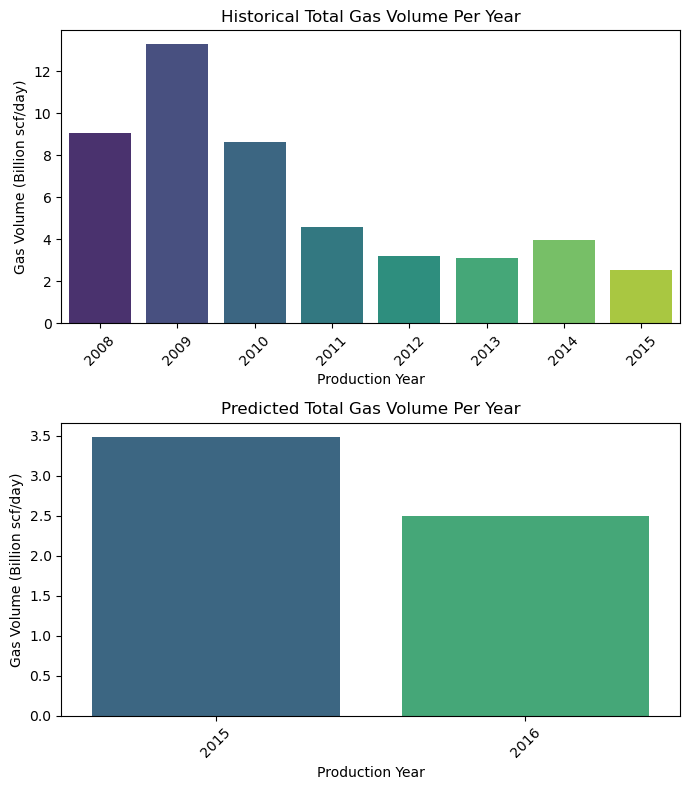

In [539]:
plt.figure(figsize=(7, 8))

plt.subplot(2, 1, 1)
sns.barplot(x=total_gas_prod_hist_yrr['Production Year'], y=total_gas_prod_hist_yrr['Gas Volume (scf/day)'] / 1e9, palette='viridis')
plt.xlabel('Production Year')
plt.ylabel('Gas Volume (Billion scf/day)')
plt.title('Historical Total Gas Volume Per Year')
plt.xticks(rotation=45)

plt.subplot(2, 1, 2)
sns.barplot(x=total_gas_prod_pred_yr['Production Year'], y=total_gas_prod_pred_yr['Gas Volume (scf/day)'] / 1e9, palette='viridis')
plt.xlabel('Production Year')
plt.ylabel('Gas Volume (Billion scf/day)')
plt.title('Predicted Total Gas Volume Per Year')
plt.xticks(rotation=45)

plt.tight_layout();

### Bar chart Representation for Average Gas Volume

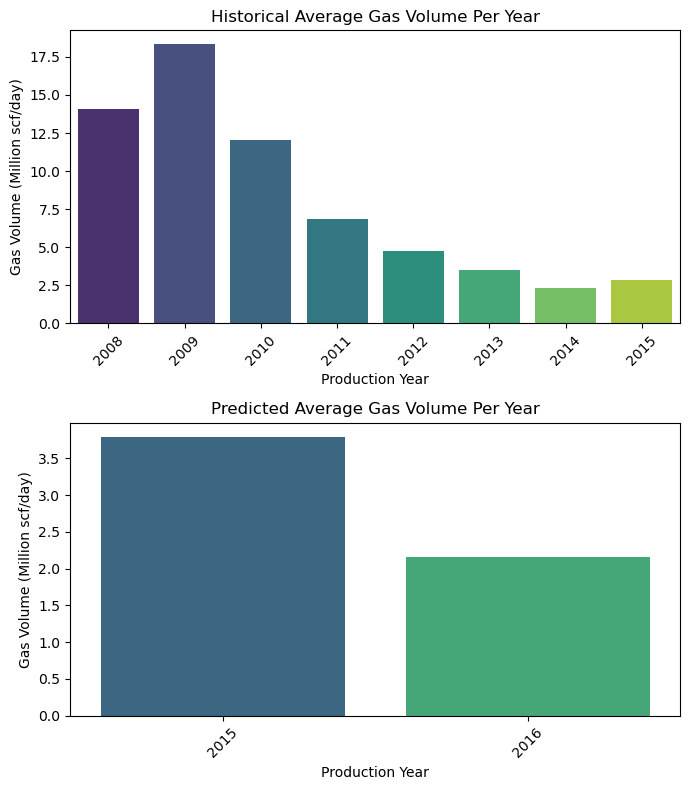

In [541]:
plt.figure(figsize=(7, 8))

plt.subplot(2, 1, 1)
sns.barplot(x=avg_gas_prod_hist_yrr['Production Year'], y=avg_gas_prod_hist_yrr['Gas Volume (scf/day)'] / 1e6, palette='viridis')
plt.xlabel('Production Year')
plt.ylabel('Gas Volume (Million scf/day)')
plt.title('Historical Average Gas Volume Per Year')
plt.xticks(rotation=45)

plt.subplot(2, 1, 2)
sns.barplot(x=avg_gas_prod_pred_yr['Production Year'], y=avg_gas_prod_pred_yr['Gas Volume (scf/day)'] / 1e6, palette='viridis')
plt.xlabel('Production Year')
plt.ylabel('Gas Volume (Million scf/day)')
plt.title('Predicted Average Gas Volume Per Year')
plt.xticks(rotation=45)

plt.tight_layout();

# Final Estimation Showing The Total Production For Each Year

### For Historical Data

In [554]:
total_prod_hist = pd.merge(total_gas_prod_hist_yrr, total_water_prod_hist_yrr, on='Production Year')
total_prod_hist = pd.merge(total_prod_hist, total_oil_prod_hist_yrr, on='Production Year')

In [555]:
total_prod_hist

,Production Year,Gas Volume (scf/day),Water Production (stb/day),Oil Production (stb/day)
0,2008,9.073462e+09,1.478712e+05,1.109792e+07
1,2009,1.327217e+10,1.459933e+06,1.688483e+07
2,2010,8.611378e+09,1.187297e+07,1.062949e+07
3,2011,4.600303e+09,1.377913e+07,5.333702e+06
4,2012,3.184365e+09,1.326939e+07,3.611758e+06
5,2013,3.091849e+09,1.620534e+07,3.509899e+06
6,2014,3.946253e+09,1.708409e+07,4.674146e+06
7,2015,2.547651e+09,5.684150e+06,3.084576e+06


In [557]:
total_prod_hist['Total Production'] = (total_prod_hist['Gas Volume (scf/day)'] + total_prod_hist['Water Production (stb/day)'] + total_prod_hist['Oil Production (stb/day)'])

In [559]:
total_prod_hist

,Production Year,Gas Volume (scf/day),Water Production (stb/day),Oil Production (stb/day),Total Production
0,2008,9.073462e+09,1.478712e+05,1.109792e+07,9.084708e+09
1,2009,1.327217e+10,1.459933e+06,1.688483e+07,1.329051e+10
2,2010,8.611378e+09,1.187297e+07,1.062949e+07,8.633880e+09
3,2011,4.600303e+09,1.377913e+07,5.333702e+06,4.619416e+09
4,2012,3.184365e+09,1.326939e+07,3.611758e+06,3.201246e+09
5,2013,3.091849e+09,1.620534e+07,3.509899e+06,3.111564e+09
6,2014,3.946253e+09,1.708409e+07,4.674146e+06,3.968011e+09
7,2015,2.547651e+09,5.684150e+06,3.084576e+06,2.556420e+09


In [584]:
def autopct_func(values):
    def my_autopct(pct):
        total = sum(values)
        val = pct * total / 100.0
        return f'{val:.1f}B'
    return my_autopct

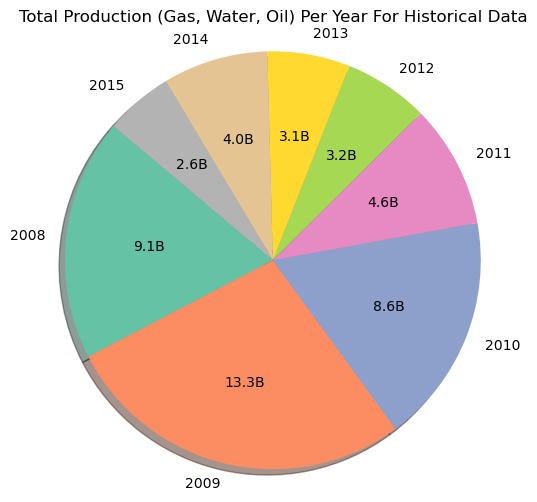

In [588]:
hist_values = total_prod_hist['Production Year'].astype(str)
hist_estimates = total_prod_hist['Total Production'] / 1e9
hist_colors = plt.cm.Set2(np.linspace(0, 1, len(hist_values)))

plt.figure(figsize=(6, 6))
plt.pie(hist_estimates, labels=hist_values, colors=hist_colors, autopct=autopct_func(hist_estimates), shadow=True, startangle=140)
plt.title('Total Production (Gas, Water, Oil) Per Year For Historical Data')
plt.axis('equal');

### For Predicted Data

In [560]:
total_prod_pred = pd.merge(total_gas_prod_pred_yr, total_water_prod_pred_yr, on='Production Year')
total_prod_pred = pd.merge(total_prod_pred, total_oil_prod_pred_yr, on='Production Year')
total_prod_pred['Total Production'] = (total_prod_pred['Gas Volume (scf/day)'] + total_prod_pred['Water Production (stb/day)'] + total_prod_pred['Oil Production (stb/day)'])

In [561]:
total_prod_pred

,Production Year,Gas Volume (scf/day),Water Production (stb/day),Oil Production (stb/day),Total Production
0,2015,3.490112e+09,6.511100e+06,3.658692e+06,3.500281e+09
1,2016,2.495013e+09,7.322650e+06,3.208767e+06,2.505545e+09


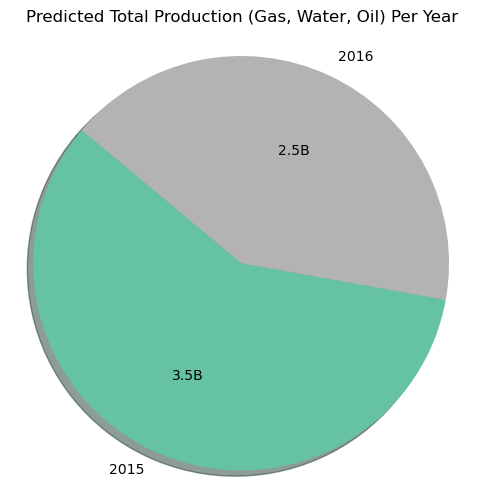

In [589]:
pred_values = total_prod_pred['Production Year'].astype(str)
pred_estimates = total_prod_pred['Total Production'] / 1e9
pred_colors = plt.cm.Set2(np.linspace(0, 1, len(pred_values)))

plt.figure(figsize=(6, 6))
plt.pie(pred_estimates, labels=pred_values, colors=pred_colors, autopct=autopct_func(pred_estimates), shadow=True, startangle=140)
plt.title('Predicted Total Production (Gas, Water, Oil) Per Year')
plt.axis('equal');

In [512]:
pd.read_csv('Enoch_Soyinka_2024_DSEATS_Datathon_5673020.csv')

,PRODUCTION DATE,Oil Production (stb/day),Gas Volume (scf/day),Water Production (stb/day)
0,2015-07-01 00:00:00,7232.699283,7.002167e+06,2709.359842
1,2015-07-02 00:00:00,5994.161801,6.784504e+06,4358.095481
2,2015-07-03 00:00:00,5435.082542,5.909162e+06,3713.502813
3,2015-07-04 00:00:00,933.654577,1.151160e+06,2130.196686
4,2015-07-05 00:00:00,832.916139,1.114134e+06,382.462346
...,...,...,...,...
2070,2016-09-12 00:00:00,50.301879,2.915365e+04,1813.426918
2071,2016-09-13 00:00:00,50.301879,2.915365e+04,1818.255751
2072,2016-09-14 00:00:00,50.301879,2.915365e+04,1391.536490
2073,2016-09-15 00:00:00,50.301879,2.915365e+04,1391.536490
